<a href="https://colab.research.google.com/github/AmandineLecerfDefer/OC_P5_Segmentez_des_clients_d-un_site_e-commerce/blob/main/POLIST_02_notebookmodelisation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <center><u><font color='red'>Projet 5 : Segmentez des clients d'un site e-commerce</font></u></center>

Amandine Lecerf Defer

Since the data comes from an e-commerce site database, it would have been interesting to perform an RFM segmentation. However, this segmentation would not be relevant in our case because the majority of the buyers have only made one order.

# <font color='green'>Setting up the work environment</font>

## <font color='blue'>Library</font>

In [ ]:
# if problem
# !pip3 install jupyter
# !ipython kernel install --name=python3 --user

# in terminal
# python -m pip install ipykernel
# python -m ipykernel install --user

In [ ]:
# %%flake8

#!pip install termcolor
#!pip install pylab-sdk

!pip install pickle
!pip install autopep8
!pip install -U scikit-learn

import matplotlib.patches as mpatches
import pylab
import collections
import datetime
import math
import pickle
import warnings
import time
import pickle
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib.collections import LineCollection
from matplotlib.patches import Circle
from scipy.stats import variation
from sklearn.cluster import DBSCAN, AgglomerativeClustering, KMeans
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import davies_bouldin_score, silhouette_samples, silhouette_score
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from termcolor import colored

warnings.filterwarnings("ignore")

%matplotlib inline

pd.options.mode.chained_assignment = None

pd.options.display.width = 0

ERROR: Could not find a version that satisfies the requirement pickle (from versions: none)
ERROR: No matching distribution found for pickle
Requirement already up-to-date: scikit-learn in /usr/local/lib/python3.7/dist-packages (0.24.2)


In [ ]:
# %%flake8
#  Installation :
!pip install flake8 pycodestyle pycodestyle_magic
# Activate %%flake8 magic function
%load_ext pycodestyle_magic

# module to know if the text is with pep8 reglementation
# !pip install pycodestyle flake8
# !pip install pycodestyle_magic
# %load_ext pycodestyle_magic
# automatic search for the entire document : %pycodestyle_on
# or %flake8_on to turn off : %pycodestyle_off or %flake8_off
# for each cell :  %%pycodestyle or %%flake8
# %%flake8 block showing output and to see ouptut, put %%flake8 in comment

The pycodestyle_magic extension is already loaded. To reload it, use:
  %reload_ext pycodestyle_magic


## <font color='blue'> Function </font>

In [ ]:
# %%flake8
def display_scree_plot(pca):
    """
    Graph representing the eigenvalues of the pca model based on the file
    under study
    pca : pca of the model"""
    scree = pca.explained_variance_ratio_ * 100
    plt.bar(np.arange(len(scree)) + 1, scree)
    plt.plot(np.arange(len(scree)) + 1, scree.cumsum(), c="red", marker="o")
    plt.xlabel("rank of the axis of inertia")
    plt.ylabel("percentage of inertia")
    plt.title("Eigenvalue decay")  # Eboulis des valeurs propres
    plt.show(block=False)

In [ ]:
# %%flake8
def distribution(df, transformed=False):
    """
    Visualization code for displaying skewed distributions of features
    df : studied dataframe
    transformed : if the data has had a logarithmic transformation
    by default None
    """
    cols = df.select_dtypes(include=["int64", "float64"]).columns.tolist()
    num_plots = len(cols)
    num_cols = math.ceil(np.sqrt(num_plots))
    num_rows = math.ceil(num_plots / num_cols)
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 15))
    for ind, col in enumerate(cols):
        i = math.floor(ind / num_cols)
        j = ind - i * num_cols
        if num_rows == 1:
            if num_cols == 1:
                sns.distplot(df[col], kde=True, ax=axs)
            else:
                sns.distplot(df[col], kde=True, ax=axs[j])
        else:
            sns.distplot(df[col], kde=True, ax=axs[i, j])

        # Plot aesthetics
        if transformed:
            fig.suptitle("Log-transformed Distributions", fontsize=16, y=1.03)
        else:
            fig.suptitle("Skewed Distributions", fontsize=16, y=1.03)

        fig.tight_layout()
        fig.show()

    return fig

In [ ]:
# %%flake8
def norm_description_var(df):
    """
    This function calculates the mean and standard deviation of each
    numerical column of a dataframe to check that they have been normalized
    df : study dataframe"""
    for col in df:
        colData = df[col]
        moyenne = np.mean(colData)
        ecartType = np.std(colData)
        print("Statistical measures for the variable {}".format(col))
        print(
            "The mean of the variable {} is : {} ".format(
                col, round(abs(moyenne), 2))
        )
        print(
            "The standard deviation of the variable {} is : {} ".format(
                col, round(abs(ecartType), 2)
            )
        )
        print("\n \n")

In [ ]:
# %%flake8
def distribution_simple(df):
    """creation of a graph for each column to show its distribution
    df : study dataframe """
    cols = df.select_dtypes(include=["float64"]).columns.tolist()
    num_plots = len(cols)
    num_cols = math.ceil(np.sqrt(num_plots))
    num_rows = math.ceil(num_plots / num_cols)
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 15))
    for ind, col in enumerate(cols):
        i = math.floor(ind / num_cols)
        j = ind - i * num_cols
        if num_rows == 1:
            if num_cols == 1:
                sns.distplot(df[col], kde=True, ax=axs)
            else:
                sns.distplot(df[col], kde=True, ax=axs[j])
        else:
            sns.distplot(df[col], kde=True, ax=axs[i, j])

In [ ]:
# %%flake8
def get_df_name(df):
    """this function returns the name of the dataframe passed as argument
    df : dataframe dataframe whose name we want to know"""
    name = [x for x in globals() if globals()[x] is df][0]
    return name

In [ ]:
# %%flake8
def DaviesBouldin(X, labels):
    """This function is used to manually calculate the Davies Bouldin index
    X : Data
    labels : labels of the model"""
    from scipy.spatial.distance import euclidean
    n_cluster = len(np.bincount(labels))
    cluster_k = [X[labels == k] for k in range(n_cluster)]
    centroids = [np.mean(k, axis=0) for k in cluster_k]
    variances = [np.mean([euclidean(p, centroids[i]) for p in k]) for i, k in
                 enumerate(cluster_k)]
    db = []
    for i in range(n_cluster):
        for j in range(n_cluster):
            if j != i:
                db.append((variances[i] + variances[j]) / euclidean(
                    centroids[i], centroids[j]))
    return(np.max(db) / n_cluster)

In [ ]:
# %%flake8
def standartization_encodage(frame):
    """From a dataframe, normalization of numerical columns and encoding of
    nominal variables to transform them into categorical. Function that returns
    the modified dataframe.
    frame : study dataframe """
    print(
        colored(
            "Digital data standardization and One Hot Encoding of "
            "the dataset {}.".format(get_df_name(frame)),
            "blue",
        )
    )

    print(colored("\n Digital data standardization : \n", "green"))
    print(
        "Normalization is necessary for our data because "
        "the data are not of the same order."
    )
    print(
        "We transform the distribution of the data in order to have "
        "the mean at 0 and the standard deviation at 1.\n \n"
    )
    dataset_num = frame.copy()
    print(distribution(dataset_num))
    plt.pause(0.001)
    numerical_columns = dataset_num.select_dtypes(["int", "float"]).columns
    dataset_num[numerical_columns] = StandardScaler().fit_transform(
        dataset_num[numerical_columns]
    )
    plotting = dataset_num[numerical_columns]
    print("\n \n")
    print(norm_description_var(plotting))
    print(distribution(plotting))
    plt.pause(0.001)

    print(
        colored(
            "\n \n Dummy variable : one-hot encoding by the method "
            "get_dummies",
            "green",
        )
    )
    dataset_nom = frame.copy()
    categorical_columns = dataset_nom.select_dtypes(
        ["category", "object"]).columns
    print(dataset_nom[categorical_columns].shape)
    one_hot_encoded = pd.get_dummies(dataset_nom[categorical_columns])
    encoded = list(one_hot_encoded.columns)
    print("{} total features after one-hot encoding.".format(len(encoded)))

    print(colored("\n Final Dataset", "green"))
    del dataset_num["customer_region"]
    del dataset_num["most_payment_used"]
    del dataset_num["category_most_purchased"]
    dataframe = pd.merge(
        dataset_num, one_hot_encoded, left_index=True, right_index=True
    )
    lignes = dataframe.shape[0]
    colonnes = dataframe.shape[1]
    print("Le jeu de données a {} lignes et {} "
          "colonnes.".format(lignes, colonnes))
    nan = dataframe.isnull().values.any()
    if not nan:
        print("There is no missing data \n \n \n \n ")
    else:
        print("There are {} missing data \n \n \n ".format(nan))
    dataframe = dataframe.reset_index()
    del dataframe["index"]

    return dataframe

# <font color='green'>CSV Importation</font>

In [ ]:
# %%flake8
from google.colab import drive
drive.mount('/content/drive')

%cd /content/drive/My\ Drive/Data_projet_OC
!ls

data = pd.read_csv('/content/drive/MyDrive/Data_projet_OC/'
                   'bd_olist_finale.csv')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive/Data_projet_OC
bd_olist_finale.csv  tot_data_label.csv


In [ ]:
"""# %%flake8
data = pd.read_csv(
    "/Users/amandinelecerfdefer/Desktop/"
    "Formation_Data_Scientist_OC/WORK-projet5/csv_produits/"
    "bd_olist_finale.csv"
)"""

'# %%flake8\ndata = pd.read_csv(\n    "/Users/amandinelecerfdefer/Desktop/"\n    "Formation_Data_Scientist_OC/WORK-projet5/csv_produits/"\n    "bd_olist_finale.csv"\n)'

In [ ]:
data

,customer_unique_id,customer_region,number_order,distance_between_seller_customer,date_last_order,mean_days_between_orders,mean_item_per_order,mean_volume_item_ordered,date_first_order,mean_product_price,mean_freight_value,mean_order_value,mean_review_score,mean_payment_sequential,mean_payment_installment,most_payment_used,category_most_purchased,price_for_Office_equipment_furniture,price_for_clothing_accessories,price_for_electronic_equipment,price_for_food_drink,price_for_furniture_decoration_home,price_for_garden_pets,price_for_home_appliances,price_for_hygiene_health_wellness,price_for_leisure_homemade,price_for_other,price_for_repairs_constructions
0,861eff4711a542e4b93843c6dd7febb0,Southeast,1.0,3.160256,736465.0,0.0,1.0,107136.0,736465.0,124.99,21.88,146.87,4.0,1.0,2.0,credit_card,Office_equipment_furniture,124.99,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0
1,290c77bc529b7ac935b93aa66c333dc3,Southeast,1.0,3.831877,736706.0,0.0,1.0,53400.0,736706.0,289.00,46.48,335.48,5.0,1.0,8.0,credit_card,home_appliances,0.00,0.0,0.0,0.0,0.0,0.0,289.0,0.00,0.0,0.0,0.0
2,060e732b5b29e8181a18229c7b0b2b5e,Southeast,1.0,0.293126,736833.0,0.0,1.0,45968.0,736833.0,139.94,17.79,157.73,5.0,1.0,7.0,credit_card,Office_equipment_furniture,139.94,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0
3,259dac757896d24d7702b9acbbff3f3c,Southeast,1.0,0.181996,736766.0,0.0,1.0,79968.0,736766.0,149.94,23.36,173.30,5.0,1.0,1.0,credit_card,Office_equipment_furniture,149.94,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0
4,345ecd01c38d18a9036ed96c73b8d066,Southeast,1.0,2.080467,736904.0,0.0,1.0,23625.0,736904.0,230.00,22.25,252.25,5.0,1.0,8.0,credit_card,furniture_decoration_home,0.00,0.0,0.0,0.0,230.0,0.0,0.0,0.00,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85403,4b5820135d360a45552b5163835b1d89,Southeast,1.0,3.984376,736680.0,0.0,1.0,26496.0,736680.0,55.00,20.88,75.88,1.0,1.0,1.0,credit_card,home_appliances,0.00,0.0,0.0,0.0,0.0,0.0,55.0,0.00,0.0,0.0,0.0
85404,1a29b476fee25c95fbafc67c5ac95cf8,Southeast,1.0,3.445074,736791.0,0.0,1.0,11132.0,736791.0,74.90,13.88,88.78,4.0,1.0,6.0,credit_card,leisure_homemade,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,74.9,0.0,0.0
85405,d52a67c98be1cf6a5c84435bd38d095d,Southeast,1.0,2.322013,736788.0,0.0,1.0,13200.0,736788.0,114.90,14.16,129.06,5.0,1.0,3.0,credit_card,leisure_homemade,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,114.9,0.0,0.0
85406,e9f50caf99f032f0bf3c55141f019d99,Northeast,1.0,21.390305,736792.0,0.0,1.0,9000.0,736792.0,37.00,19.04,56.04,1.0,1.0,5.0,credit_card,hygiene_health_wellness,0.00,0.0,0.0,0.0,0.0,0.0,0.0,37.00,0.0,0.0,0.0


In [ ]:
# %%flake8
del data["customer_unique_id"]

In [ ]:
data.head()

,customer_region,number_order,distance_between_seller_customer,date_last_order,mean_days_between_orders,mean_item_per_order,mean_volume_item_ordered,date_first_order,mean_product_price,mean_freight_value,mean_order_value,mean_review_score,mean_payment_sequential,mean_payment_installment,most_payment_used,category_most_purchased,price_for_Office_equipment_furniture,price_for_clothing_accessories,price_for_electronic_equipment,price_for_food_drink,price_for_furniture_decoration_home,price_for_garden_pets,price_for_home_appliances,price_for_hygiene_health_wellness,price_for_leisure_homemade,price_for_other,price_for_repairs_constructions
0,Southeast,1.0,3.160256,736465.0,0.0,1.0,107136.0,736465.0,124.99,21.88,146.87,4.0,1.0,2.0,credit_card,Office_equipment_furniture,124.99,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Southeast,1.0,3.831877,736706.0,0.0,1.0,53400.0,736706.0,289.00,46.48,335.48,5.0,1.0,8.0,credit_card,home_appliances,0.00,0.0,0.0,0.0,0.0,0.0,289.0,0.0,0.0,0.0,0.0
2,Southeast,1.0,0.293126,736833.0,0.0,1.0,45968.0,736833.0,139.94,17.79,157.73,5.0,1.0,7.0,credit_card,Office_equipment_furniture,139.94,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Southeast,1.0,0.181996,736766.0,0.0,1.0,79968.0,736766.0,149.94,23.36,173.30,5.0,1.0,1.0,credit_card,Office_equipment_furniture,149.94,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Southeast,1.0,2.080467,736904.0,0.0,1.0,23625.0,736904.0,230.00,22.25,252.25,5.0,1.0,8.0,credit_card,furniture_decoration_home,0.00,0.0,0.0,0.0,230.0,0.0,0.0,0.0,0.0,0.0,0.0


# <font color='green'> Sample Data Formation</font>

## <font color='blue'> Preparation </font>

In [ ]:
# %%flake8
formatted_data = data.copy()

In [ ]:
# %%flake8
formatted_data["date_first_order"].min()

736359.0

In [ ]:
# %%flake8
formatted_data["date_first_order"].max()

736927.0

Our data spans the years 2017 and 2018. To determine the best clustering algorithm, I decide to take customers who placed their first order during the first 6 months of 2017.

In [ ]:
# %%flake8
datetime.datetime.fromordinal(736348)

datetime.datetime(2017, 1, 19, 0, 0)

In [ ]:
# %%flake8
datetime.datetime.fromordinal(736927)

datetime.datetime(2018, 8, 21, 0, 0)

Separation of the dataset every 3 months to have different small datasets

## <font color='blue'> sample 1 : 2017-01-01 to 2017-03-31 </font>

In [ ]:
# %%flake8
d = datetime.date(year=2017, month=1, day=1)
d.toordinal()

736330

In [ ]:
# %%flake8
d = datetime.date(year=2017, month=3, day=31)
d.toordinal()

736419

For our sample, we must therefore keep the lines where the first command is between 736330 and 736511.

In [ ]:
# %%flake8
sample_1strim = formatted_data.loc[
    (formatted_data["date_first_order"] >= 736330)
    & (formatted_data["date_first_order"] <= 736419)
]

In [ ]:
# %%flake8
sample_1strim.shape

(3942, 27)

## <font color='blue'> sample 2 : 2017-04-01 to 2017-06-30 </font>

In [ ]:
# %%flake8
d = datetime.date(year=2017, month=4, day=1)
d.toordinal()

736420

In [ ]:
# %%flake8
d = datetime.date(year=2017, month=6, day=30)
d.toordinal()

736510

For our sample, we must therefore keep the lines where the first command is between 736420 and 736510.

In [ ]:
# %%flake8
sample_2strim = formatted_data.loc[
    (formatted_data["date_first_order"] >= 736420)
    & (formatted_data["date_first_order"] <= 736510)
]

In [ ]:
# %%flake8
sample_2strim.shape

(8063, 27)

## <font color='blue'> sample 3 : 2017-07-01 to 2017-09-30 </font>

In [ ]:
# %%flake8
d = datetime.date(year=2017, month=7, day=1)
d.toordinal()

736511

In [ ]:
# %%flake8
d = datetime.date(year=2017, month=9, day=30)
d.toordinal()

736602

For our sample, we must therefore keep the lines where the first command is between 736511 and 736510.

In [ ]:
# %%flake8
sample_3strim = formatted_data.loc[
    (formatted_data["date_first_order"] >= 736511)
    & (formatted_data["date_first_order"] <= 736602)
]

In [ ]:
# %%flake8
sample_3strim.shape

(11004, 27)

## <font color='blue'> sample 4 : 2017-10-01 to 2017-12-31 </font>

In [ ]:
# %%flake8
d = datetime.date(year=2017, month=10, day=1)
d.toordinal()

736603

In [ ]:
# %%flake8
d = datetime.date(year=2017, month=12, day=31)
d.toordinal()

736694

For our sample, we must therefore keep the lines where the first command is between 736603 and 736694.

In [ ]:
# %%flake8
sample_4strim = formatted_data.loc[
    (formatted_data["date_first_order"] >= 736603)
    & (formatted_data["date_first_order"] <= 736694)
]

In [ ]:
# %%flake8
sample_4strim.shape

(15640, 27)

## <font color='blue'> sample 5 : 2018-01-01 to 2018-03-31 </font>

In [ ]:
# %%flake8
d = datetime.date(year=2018, month=1, day=1)
d.toordinal()

736695

In [ ]:
# %%flake8
d = datetime.date(year=2018, month=3, day=31)
d.toordinal()

736784

For our sample, we must therefore keep the lines where the first command is between 736695 and 736784.

In [ ]:
# %%flake8
sample_5strim = formatted_data.loc[
    (formatted_data["date_first_order"] >= 736695)
    & (formatted_data["date_first_order"] <= 736784)
]

In [ ]:
# %%flake8
sample_5strim.shape

(18682, 27)

## <font color='blue'> sample 6 : 2018-04-01 to 2018-06-30 </font>

In [ ]:
# %%flake8
d = datetime.date(year=2018, month=4, day=1)
d.toordinal()

736785

In [ ]:
# %%flake8
d = datetime.date(year=2018, month=6, day=30)
d.toordinal()

736875

For our sample, we must therefore keep the lines where the first command is between 736785 and 736875.

In [ ]:
# %%flake8
sample_6strim = formatted_data.loc[
    (formatted_data["date_first_order"] >= 736785)
    & (formatted_data["date_first_order"] <= 736875)
]

In [ ]:
# %%flake8
sample_6strim.shape

(17493, 27)

## <font color='blue'> sample 7 : 2018-07-01 to 2018-09-30 </font>

In [ ]:
# %%flake8
d = datetime.date(year=2018, month=7, day=1)
d.toordinal()

736876

In [ ]:
# %%flake8
d = datetime.date(year=2018, month=9, day=30)
d.toordinal()

736967

For our sample, we must therefore keep the lines where the first command is between 736876 and 736967.

In [ ]:
# %%flake8
sample_7strim = formatted_data.loc[
    (formatted_data["date_first_order"] >= 736876)
    & (formatted_data["date_first_order"] <= 736967)
]

In [ ]:
# %%flake8
sample_7strim.shape

(10584, 27)

# <font color='green'> Data Preprocessing Normalization et one hot encoding</font>

It is necessary to prepare the data before sending it to a model so that it can work properly. 

The preparation of the data is done in several steps:


* Missing values: see previous notebook
* Asymmetric data: here treated by a normalization step
* Categorical nominal data: processed here by OneHotEncoder

### <font color='violet'> Preparation </font>

In [ ]:
# %%flake8
all_dfs = [
    sample_1strim,
    sample_2strim,
    sample_3strim,
    sample_4strim,
    sample_5strim,
    sample_6strim,
    sample_7strim,
]

In [ ]:
# %%flake8
list_names = [
    "sample_1strim",
    "sample_2strim",
    "sample_3strim",
    "sample_4strim",
    "sample_5strim",
    "sample_6strim",
    "sample_7strim",
]

### <font color='violet'> Missing Data </font>

In [ ]:
# %%flake8
for name in list_names:
    pos = list_names.index(name)
    dataset = all_dfs[pos]
    print("Missing data of the dataset {}.".format(name))
    print(dataset.isna().sum())
    print("\n \n")

Missing data of the dataset sample_1strim.
customer_region                         0
number_order                            0
distance_between_seller_customer        0
date_last_order                         0
mean_days_between_orders                0
mean_item_per_order                     0
mean_volume_item_ordered                0
date_first_order                        0
mean_product_price                      0
mean_freight_value                      0
mean_order_value                        0
mean_review_score                       0
mean_payment_sequential                 0
mean_payment_installment                0
most_payment_used                       0
category_most_purchased                 0
price_for_Office_equipment_furniture    0
price_for_clothing_accessories          0
price_for_electronic_equipment          0
price_for_food_drink                    0
price_for_furniture_decoration_home     0
price_for_garden_pets                   0
price_for_home_appliances        

There is no missing data.

### <font color='violet'> Data Prepocessing </font>

Digital data standardization and One Hot Encoding of the dataset sample_1strim.

 Digital data standardization : 

Normalization is necessary for our data because the data are not of the same order.
We transform the distribution of the data in order to have the mean at 0 and the standard deviation at 1.
 

Figure(1440x1080)


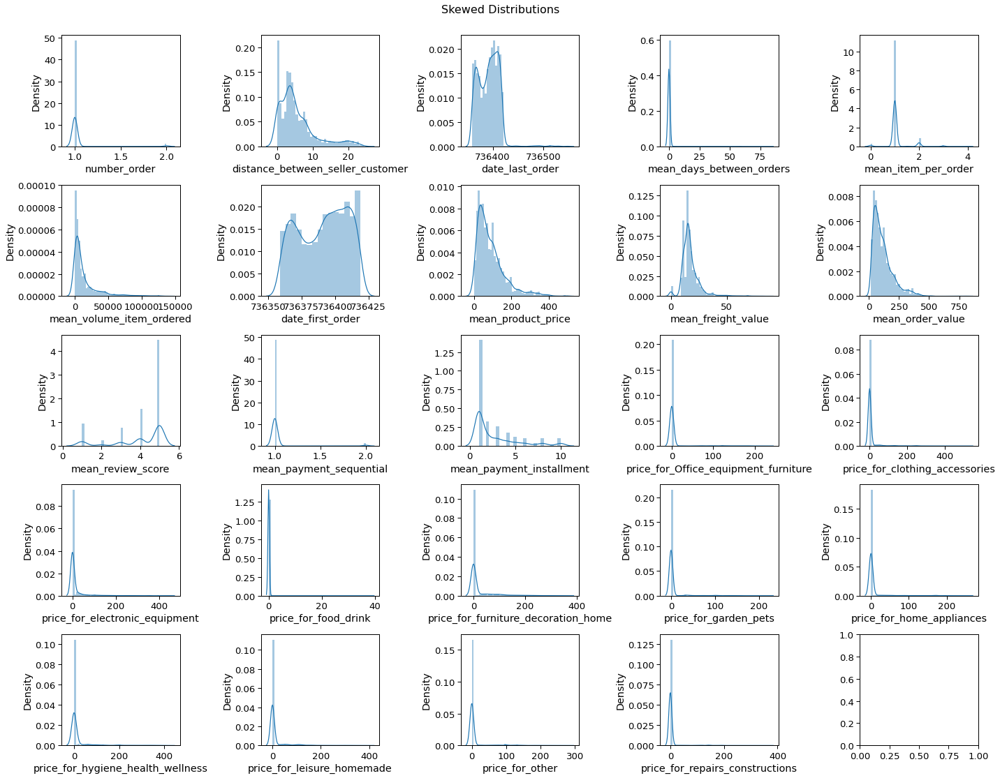


 

Statistical measures for the variable number_order
The mean of the variable number_order is : 0.0 
The standard deviation of the variable number_order is : 1.0 

 

Statistical measures for the variable distance_between_seller_customer
The mean of the variable distance_between_seller_customer is : 0.0 
The standard deviation of the variable distance_between_seller_customer is : 1.0 

 

Statistical measures for the variable date_last_order
The mean of the variable date_last_order is : 0.0 
The standard deviation of the variable date_last_order is : 1.0 

 

Statistical measures for the variable mean_days_between_orders
The mean of the variable mean_days_between_orders is : 0.0 
The standard deviation of the variable mean_days_between_orders is : 1.0 

 

Statistical measures for the variable mean_item_per_order
The mean of the variable mean_item_per_order is : 0.0 
The standard deviation of the variable mean_item_per_order is : 1.0 

 

Statistical measures for the variable mean_vo

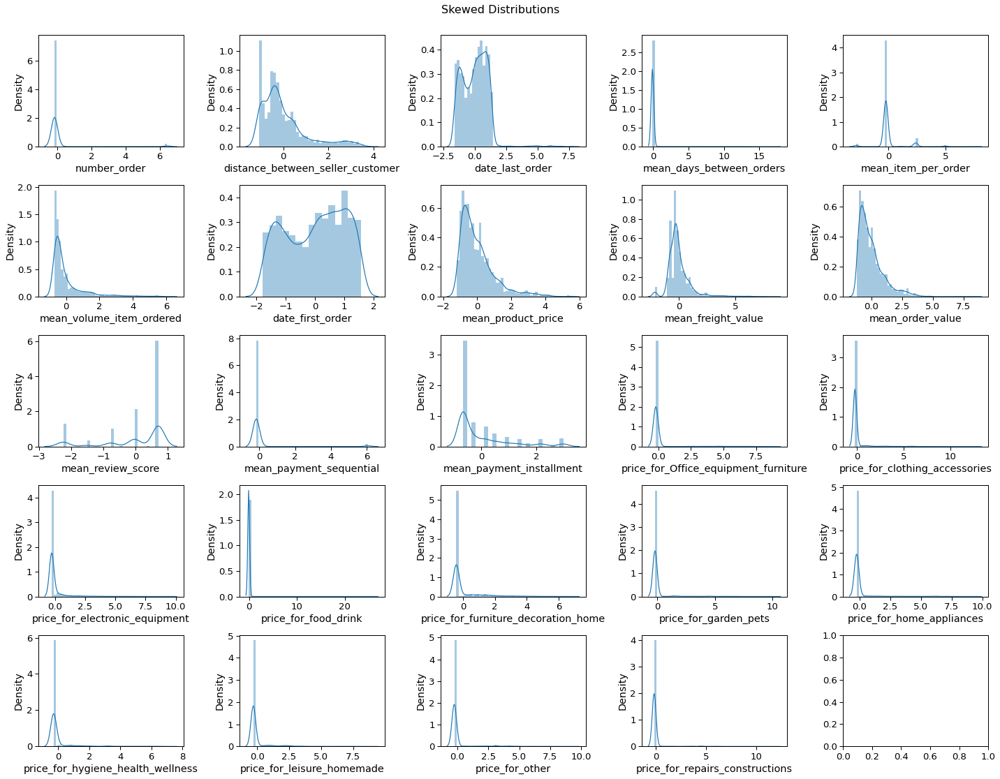


 
 Dummy variable : one-hot encoding by the method get_dummies
(3942, 3)
20 total features after one-hot encoding.

 Final Dataset
Le jeu de données a 3942 lignes et 44 colonnes.
There is no missing data 
 
 
 
 


In [ ]:
# %%flake8
sample_1strim = standartization_encodage(sample_1strim)

In [ ]:
sample_1strim

,number_order,distance_between_seller_customer,date_last_order,mean_days_between_orders,mean_item_per_order,mean_volume_item_ordered,date_first_order,mean_product_price,mean_freight_value,mean_order_value,mean_review_score,mean_payment_sequential,mean_payment_installment,price_for_Office_equipment_furniture,price_for_clothing_accessories,price_for_electronic_equipment,price_for_food_drink,price_for_furniture_decoration_home,price_for_garden_pets,price_for_home_appliances,price_for_hygiene_health_wellness,price_for_leisure_homemade,price_for_other,price_for_repairs_constructions,customer_region_Central,customer_region_North,customer_region_Northeast,customer_region_South,customer_region_Southeast,most_payment_used_boleto,most_payment_used_credit_card,most_payment_used_debit_card,most_payment_used_voucher,category_most_purchased_Office_equipment_furniture,category_most_purchased_clothing_accessories,category_most_purchased_electronic_equipment,category_most_purchased_food_drink,category_most_purchased_furniture_decoration_home,category_most_purchased_garden_pets,category_most_purchased_home_appliances,category_most_purchased_hygiene_health_wellness,category_most_purchased_leisure_homemade,category_most_purchased_other,category_most_purchased_repairs_constructions
0,-0.155442,-0.716212,0.952531,-0.098178,2.391131,0.280796,1.129480,-0.996911,-0.217004,-0.655288,-0.033154,-0.165424,0.543321,-0.191505,-0.209556,-0.279448,20.322316,-0.415259,-0.204358,-0.216707,-0.297083,-0.29524,-0.242027,-0.173732,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0
1,-0.155442,-1.025170,0.605344,-0.098178,-0.204804,-0.671319,0.736842,-0.943119,-1.040324,-1.055530,0.704180,-0.165424,-0.674055,-0.191505,-0.209556,0.138333,-0.055156,-0.415259,-0.204358,-0.216707,-0.297083,-0.29524,-0.242027,-0.173732,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0
2,-0.155442,2.830277,1.200522,-0.098178,-0.204804,-0.661883,1.409937,0.657341,0.974644,0.571691,-1.507821,-0.165424,-0.268263,-0.191505,-0.209556,-0.279448,-0.055156,-0.415259,-0.204358,-0.216707,2.159689,-0.29524,-0.242027,-0.173732,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0
3,-0.155442,-0.882448,-1.279386,-0.098178,-0.204804,-0.569242,-1.394626,2.015601,-0.611813,1.624381,0.704180,-0.165424,2.166488,-0.191505,5.657059,-0.279448,-0.055156,-0.415259,-0.204358,-0.216707,-0.297083,-0.29524,-0.242027,-0.173732,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0
4,-0.155442,-0.205022,-1.180189,-0.098178,-0.204804,1.623872,-1.282444,1.288058,-0.229041,1.014008,-2.245155,-0.165424,-0.674055,-0.191505,-0.209556,-0.279448,-0.055156,-0.415259,-0.204358,6.754121,-0.297083,-0.29524,-0.242027,-0.173732,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3937,-0.155442,0.448601,0.803737,-0.098178,-0.204804,2.062358,0.961207,0.280794,0.240396,0.162938,0.704180,-0.165424,-0.674055,-0.191505,-0.209556,-0.279448,-0.055156,-0.415259,-0.204358,-0.216707,1.661213,-0.29524,-0.242027,-0.173732,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0
3938,-0.155442,-1.038364,0.803737,-0.098178,-0.204804,0.065780,0.961207,-0.661919,-0.676812,-0.768684,0.704180,-0.165424,-0.674055,-0.191505,-0.209556,-0.279448,-0.055156,0.375854,-0.204358,-0.216707,-0.297083,-0.29524,-0.242027,-0.173732,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0
3939,-0.155442,-0.812249,1.150924,-0.098178,-0.204804,-0.500830,1.353845,-0.929671,-0.770699,-1.016693,-0.033154,-0.165424,-0.674055,-0.191505,-0.209556,-0.279448,-0.055156,-0.415259,0.733365,-0.216707,-0.297083,-0.29524,-0.242027,-0.173732,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0
3940,-0.155442,-0.777251,1.150924,-0.098178,-0.204804,-0.259815,1.353845,0.280794,0.419746,0.180798,-0.033154,-0.165424,-0.674055,-0.191505,-0.209556,-0.279448,-0.055156,1.765753,-0.204358,-0.216707,-0.297083,-0.29524,-0.242027,-0.173732,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0


Digital data standardization and One Hot Encoding of the dataset sample_2strim.

 Digital data standardization : 

Normalization is necessary for our data because the data are not of the same order.
We transform the distribution of the data in order to have the mean at 0 and the standard deviation at 1.
 

Figure(1440x1080)


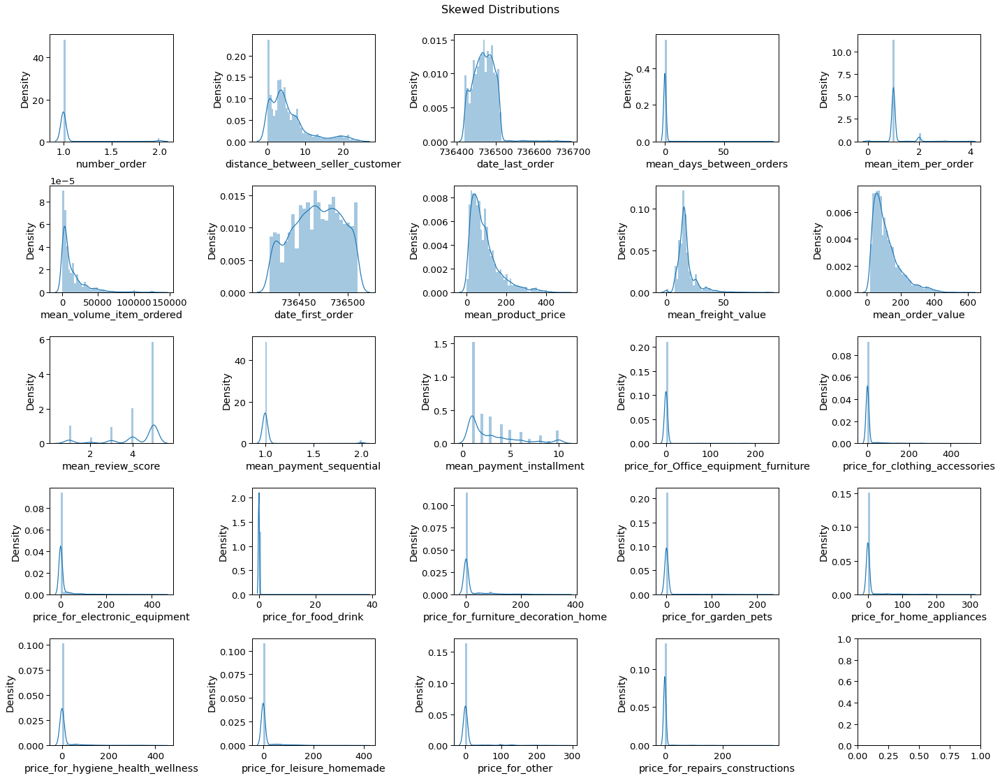


 

Statistical measures for the variable number_order
The mean of the variable number_order is : 0.0 
The standard deviation of the variable number_order is : 1.0 

 

Statistical measures for the variable distance_between_seller_customer
The mean of the variable distance_between_seller_customer is : 0.0 
The standard deviation of the variable distance_between_seller_customer is : 1.0 

 

Statistical measures for the variable date_last_order
The mean of the variable date_last_order is : 0.0 
The standard deviation of the variable date_last_order is : 1.0 

 

Statistical measures for the variable mean_days_between_orders
The mean of the variable mean_days_between_orders is : 0.0 
The standard deviation of the variable mean_days_between_orders is : 1.0 

 

Statistical measures for the variable mean_item_per_order
The mean of the variable mean_item_per_order is : 0.0 
The standard deviation of the variable mean_item_per_order is : 1.0 

 

Statistical measures for the variable mean_vo

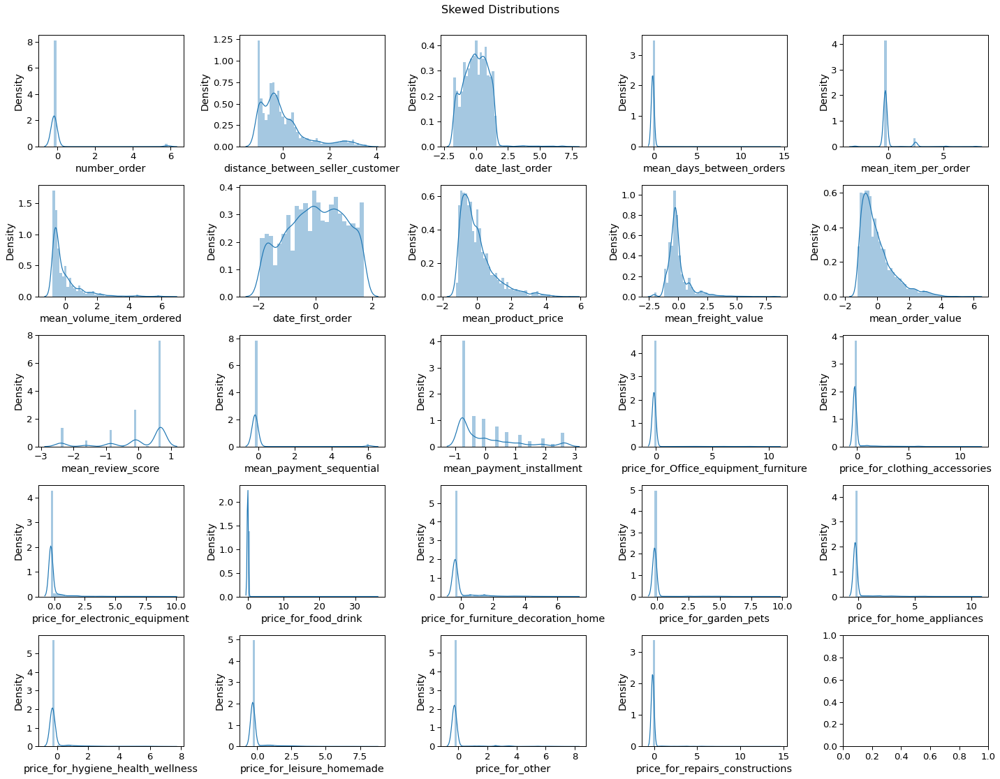


 
 Dummy variable : one-hot encoding by the method get_dummies
(8063, 3)
20 total features after one-hot encoding.

 Final Dataset
Le jeu de données a 8063 lignes et 44 colonnes.
There is no missing data 
 
 
 
 


In [ ]:
sample_2strim = standartization_encodage(sample_2strim)

Digital data standardization and One Hot Encoding of the dataset sample_3strim.

 Digital data standardization : 

Normalization is necessary for our data because the data are not of the same order.
We transform the distribution of the data in order to have the mean at 0 and the standard deviation at 1.
 

Figure(1440x1080)


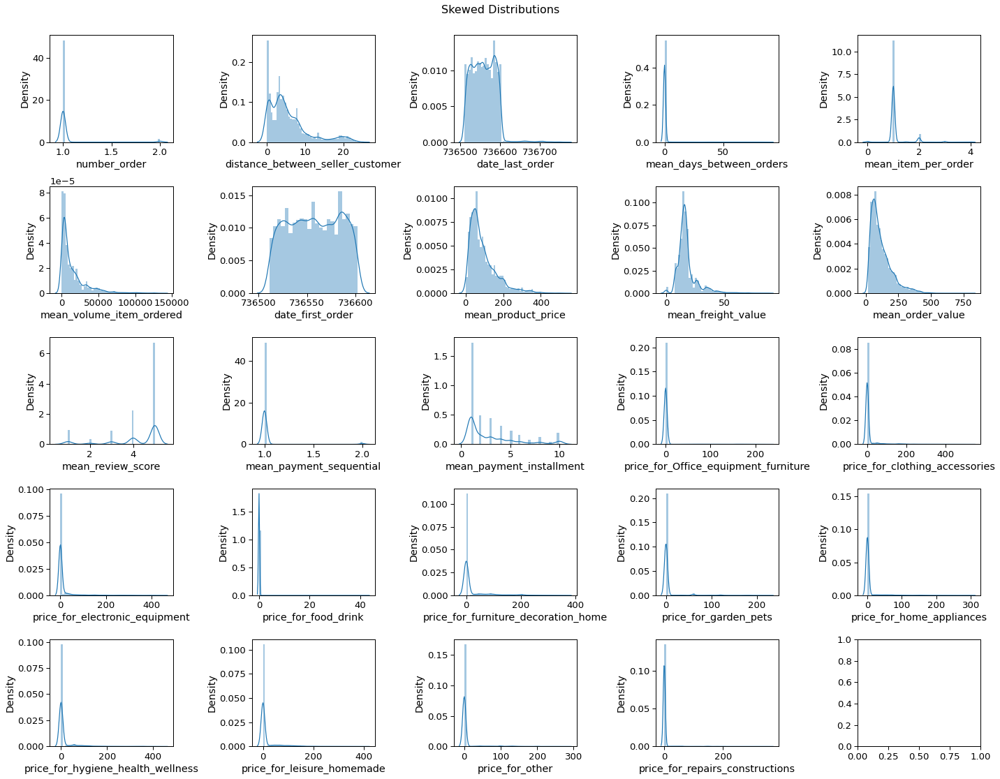


 

Statistical measures for the variable number_order
The mean of the variable number_order is : 0.0 
The standard deviation of the variable number_order is : 1.0 

 

Statistical measures for the variable distance_between_seller_customer
The mean of the variable distance_between_seller_customer is : 0.0 
The standard deviation of the variable distance_between_seller_customer is : 1.0 

 

Statistical measures for the variable date_last_order
The mean of the variable date_last_order is : 0.0 
The standard deviation of the variable date_last_order is : 1.0 

 

Statistical measures for the variable mean_days_between_orders
The mean of the variable mean_days_between_orders is : 0.0 
The standard deviation of the variable mean_days_between_orders is : 1.0 

 

Statistical measures for the variable mean_item_per_order
The mean of the variable mean_item_per_order is : 0.0 
The standard deviation of the variable mean_item_per_order is : 1.0 

 

Statistical measures for the variable mean_vo

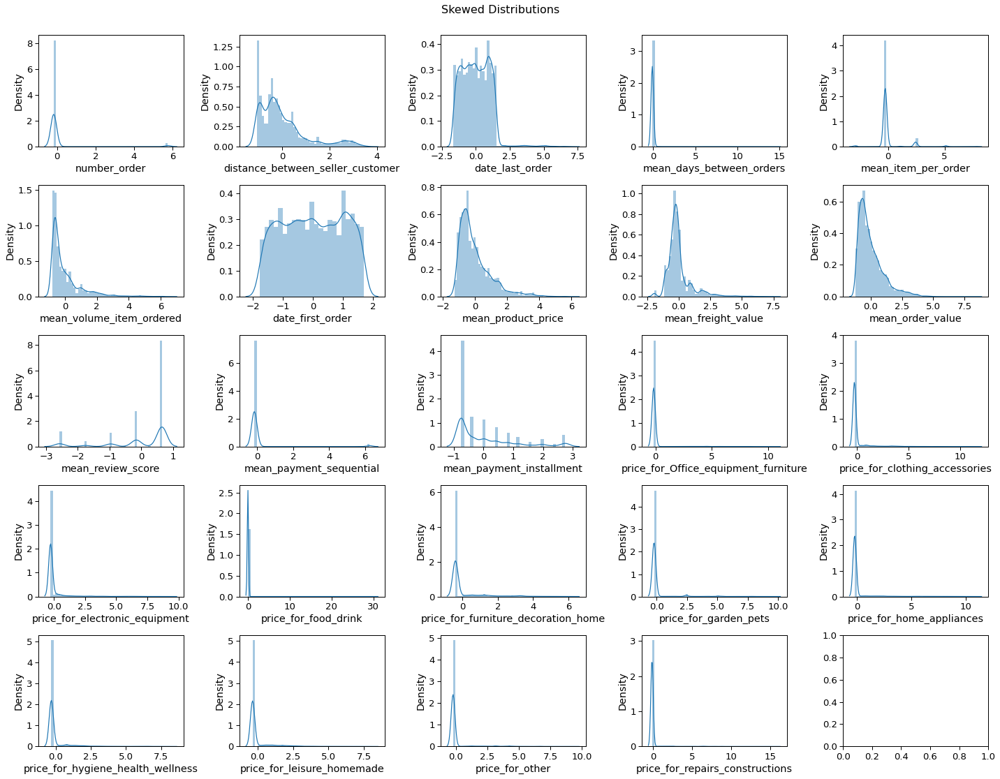


 
 Dummy variable : one-hot encoding by the method get_dummies
(11004, 3)
20 total features after one-hot encoding.

 Final Dataset
Le jeu de données a 11004 lignes et 44 colonnes.
There is no missing data 
 
 
 
 


In [ ]:
sample_3strim = standartization_encodage(sample_3strim)

Digital data standardization and One Hot Encoding of the dataset sample_4strim.

 Digital data standardization : 

Normalization is necessary for our data because the data are not of the same order.
We transform the distribution of the data in order to have the mean at 0 and the standard deviation at 1.
 

Figure(1440x1080)


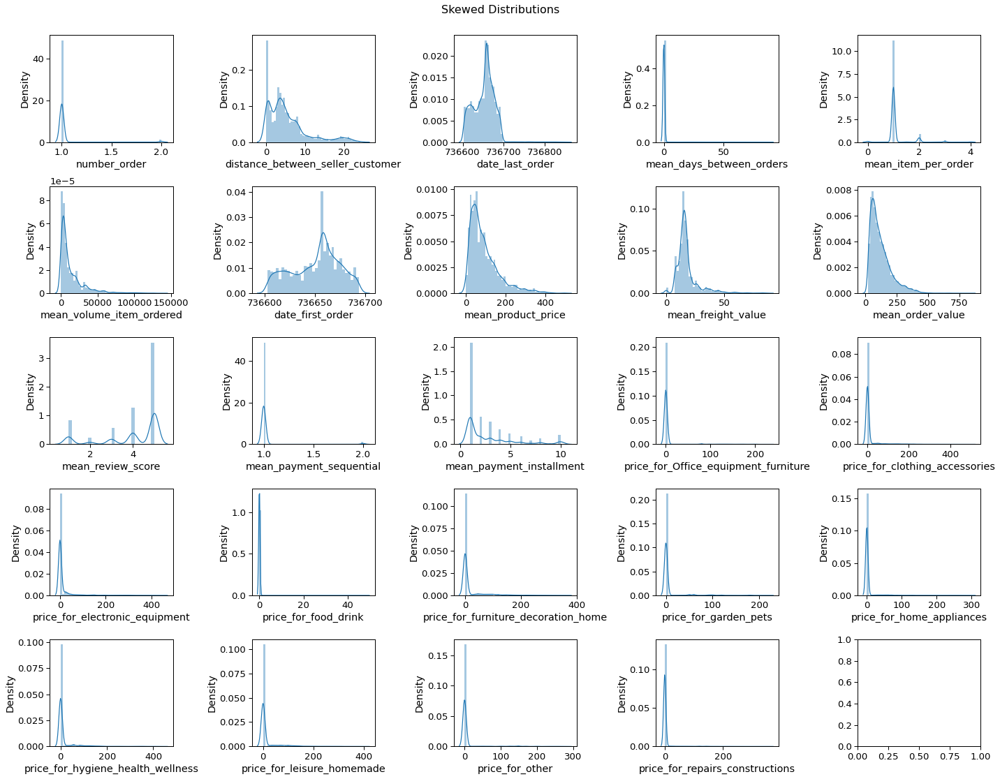


 

Statistical measures for the variable number_order
The mean of the variable number_order is : 0.0 
The standard deviation of the variable number_order is : 1.0 

 

Statistical measures for the variable distance_between_seller_customer
The mean of the variable distance_between_seller_customer is : 0.0 
The standard deviation of the variable distance_between_seller_customer is : 1.0 

 

Statistical measures for the variable date_last_order
The mean of the variable date_last_order is : 0.0 
The standard deviation of the variable date_last_order is : 1.0 

 

Statistical measures for the variable mean_days_between_orders
The mean of the variable mean_days_between_orders is : 0.0 
The standard deviation of the variable mean_days_between_orders is : 1.0 

 

Statistical measures for the variable mean_item_per_order
The mean of the variable mean_item_per_order is : 0.0 
The standard deviation of the variable mean_item_per_order is : 1.0 

 

Statistical measures for the variable mean_vo

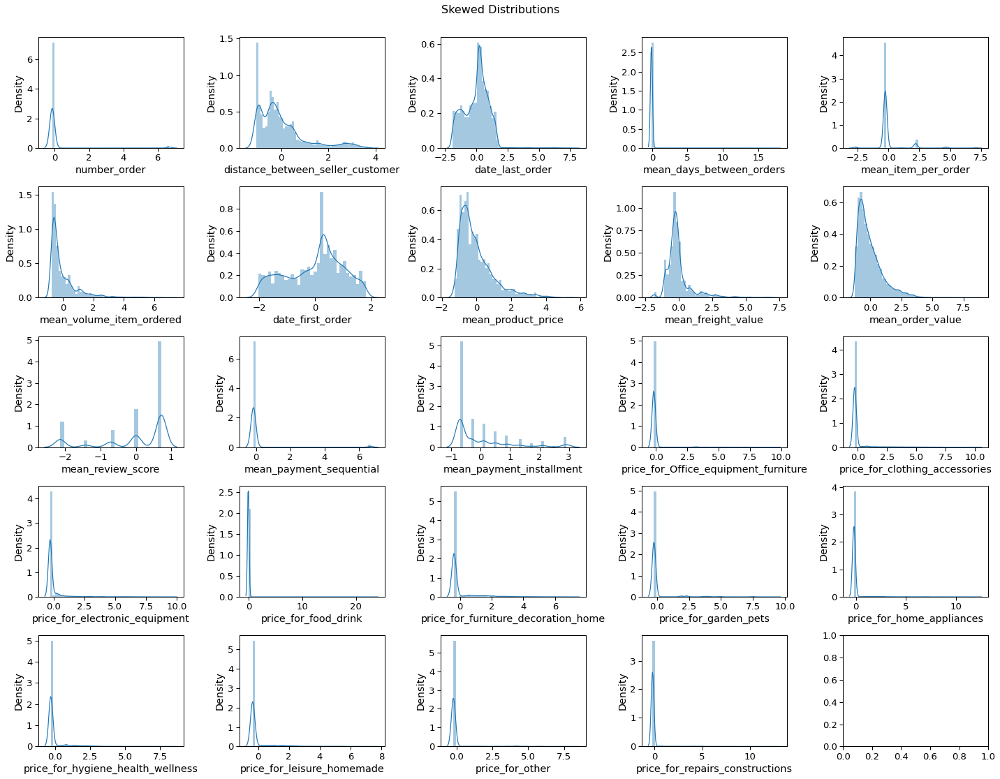


 
 Dummy variable : one-hot encoding by the method get_dummies
(15640, 3)
20 total features after one-hot encoding.

 Final Dataset
Le jeu de données a 15640 lignes et 44 colonnes.
There is no missing data 
 
 
 
 


In [ ]:
sample_4strim = standartization_encodage(sample_4strim)

Digital data standardization and One Hot Encoding of the dataset sample_5strim.

 Digital data standardization : 

Normalization is necessary for our data because the data are not of the same order.
We transform the distribution of the data in order to have the mean at 0 and the standard deviation at 1.
 

Figure(1440x1080)


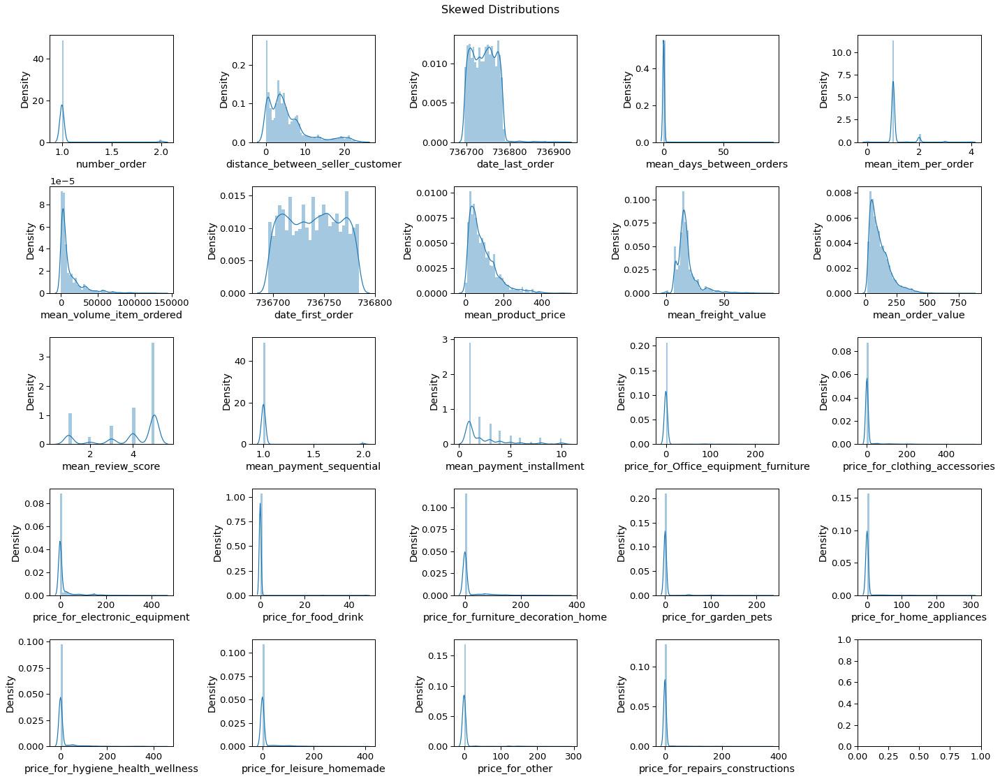


 

Statistical measures for the variable number_order
The mean of the variable number_order is : 0.0 
The standard deviation of the variable number_order is : 1.0 

 

Statistical measures for the variable distance_between_seller_customer
The mean of the variable distance_between_seller_customer is : 0.0 
The standard deviation of the variable distance_between_seller_customer is : 1.0 

 

Statistical measures for the variable date_last_order
The mean of the variable date_last_order is : 0.0 
The standard deviation of the variable date_last_order is : 1.0 

 

Statistical measures for the variable mean_days_between_orders
The mean of the variable mean_days_between_orders is : 0.0 
The standard deviation of the variable mean_days_between_orders is : 1.0 

 

Statistical measures for the variable mean_item_per_order
The mean of the variable mean_item_per_order is : 0.0 
The standard deviation of the variable mean_item_per_order is : 1.0 

 

Statistical measures for the variable mean_vo

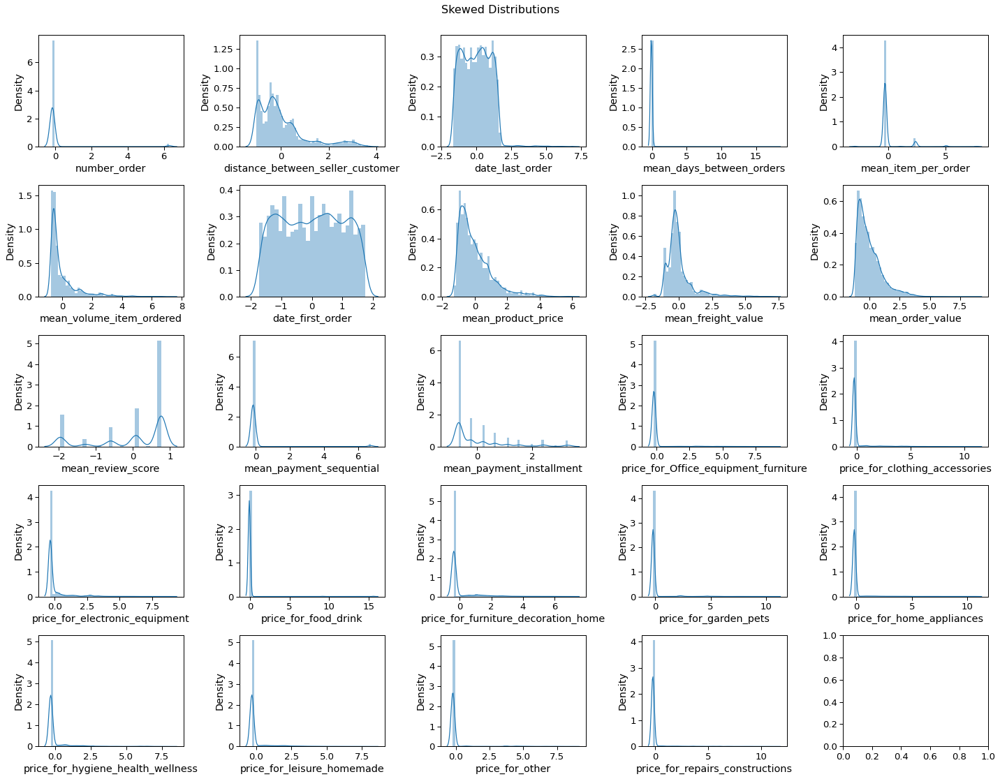


 
 Dummy variable : one-hot encoding by the method get_dummies
(18682, 3)
20 total features after one-hot encoding.

 Final Dataset
Le jeu de données a 18682 lignes et 44 colonnes.
There is no missing data 
 
 
 
 


In [ ]:
sample_5strim = standartization_encodage(sample_5strim)

Digital data standardization and One Hot Encoding of the dataset sample_6strim.

 Digital data standardization : 

Normalization is necessary for our data because the data are not of the same order.
We transform the distribution of the data in order to have the mean at 0 and the standard deviation at 1.
 

Figure(1440x1080)


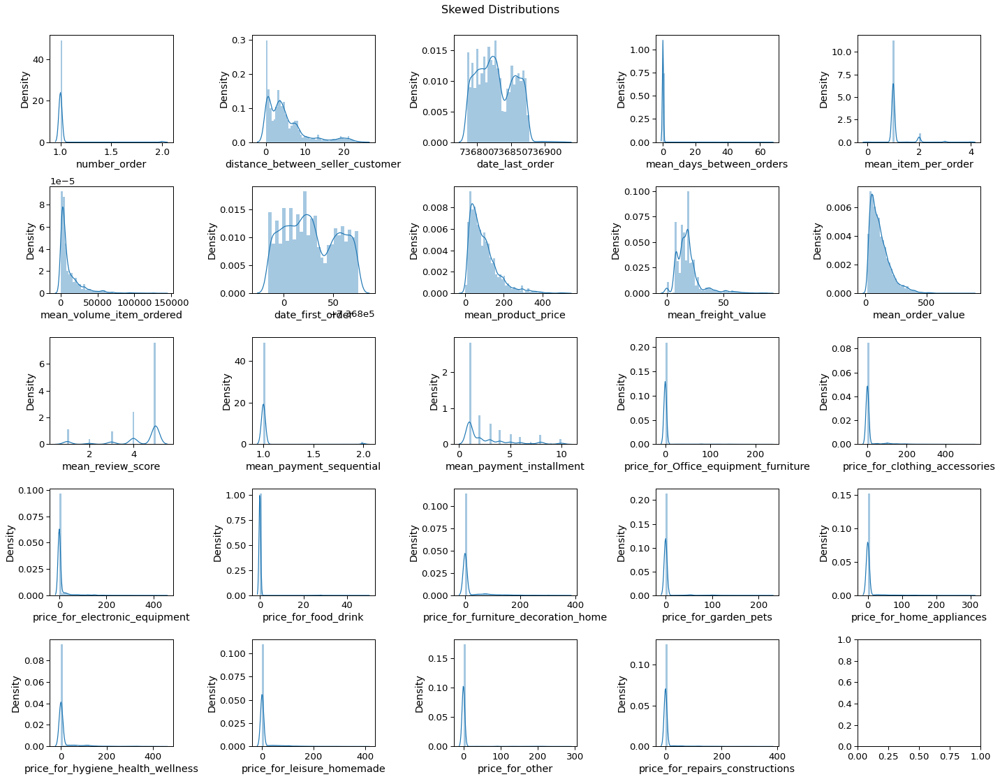


 

Statistical measures for the variable number_order
The mean of the variable number_order is : 0.0 
The standard deviation of the variable number_order is : 1.0 

 

Statistical measures for the variable distance_between_seller_customer
The mean of the variable distance_between_seller_customer is : 0.0 
The standard deviation of the variable distance_between_seller_customer is : 1.0 

 

Statistical measures for the variable date_last_order
The mean of the variable date_last_order is : 0.0 
The standard deviation of the variable date_last_order is : 1.0 

 

Statistical measures for the variable mean_days_between_orders
The mean of the variable mean_days_between_orders is : 0.0 
The standard deviation of the variable mean_days_between_orders is : 1.0 

 

Statistical measures for the variable mean_item_per_order
The mean of the variable mean_item_per_order is : 0.0 
The standard deviation of the variable mean_item_per_order is : 1.0 

 

Statistical measures for the variable mean_vo

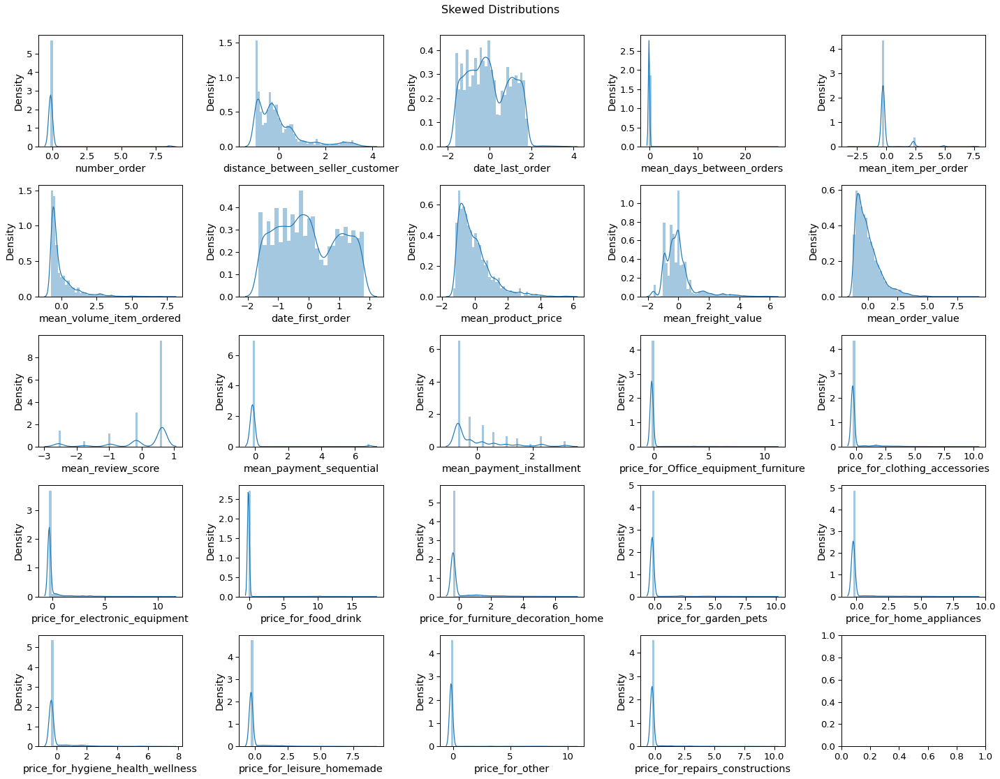


 
 Dummy variable : one-hot encoding by the method get_dummies
(17493, 3)
20 total features after one-hot encoding.

 Final Dataset
Le jeu de données a 17493 lignes et 44 colonnes.
There is no missing data 
 
 
 
 


In [ ]:
sample_6strim = standartization_encodage(sample_6strim)

Digital data standardization and One Hot Encoding of the dataset sample_7strim.

 Digital data standardization : 

Normalization is necessary for our data because the data are not of the same order.
We transform the distribution of the data in order to have the mean at 0 and the standard deviation at 1.
 

Figure(1440x1080)


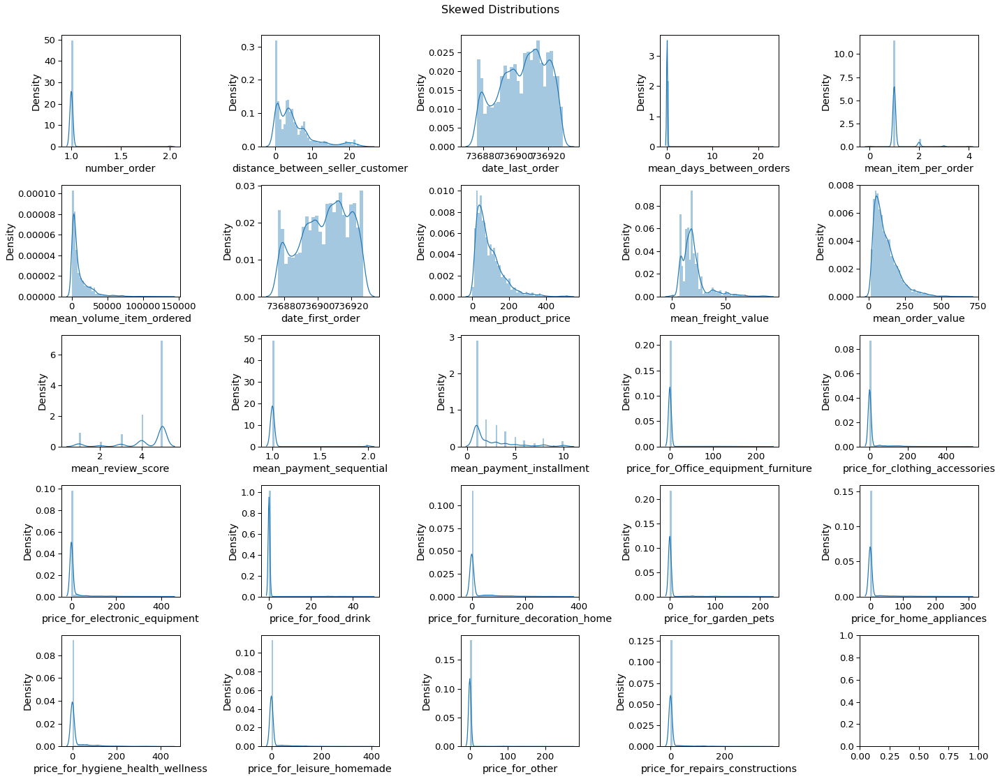


 

Statistical measures for the variable number_order
The mean of the variable number_order is : 0.0 
The standard deviation of the variable number_order is : 1.0 

 

Statistical measures for the variable distance_between_seller_customer
The mean of the variable distance_between_seller_customer is : 0.0 
The standard deviation of the variable distance_between_seller_customer is : 1.0 

 

Statistical measures for the variable date_last_order
The mean of the variable date_last_order is : 0.0 
The standard deviation of the variable date_last_order is : 1.0 

 

Statistical measures for the variable mean_days_between_orders
The mean of the variable mean_days_between_orders is : 0.0 
The standard deviation of the variable mean_days_between_orders is : 1.0 

 

Statistical measures for the variable mean_item_per_order
The mean of the variable mean_item_per_order is : 0.0 
The standard deviation of the variable mean_item_per_order is : 1.0 

 

Statistical measures for the variable mean_vo

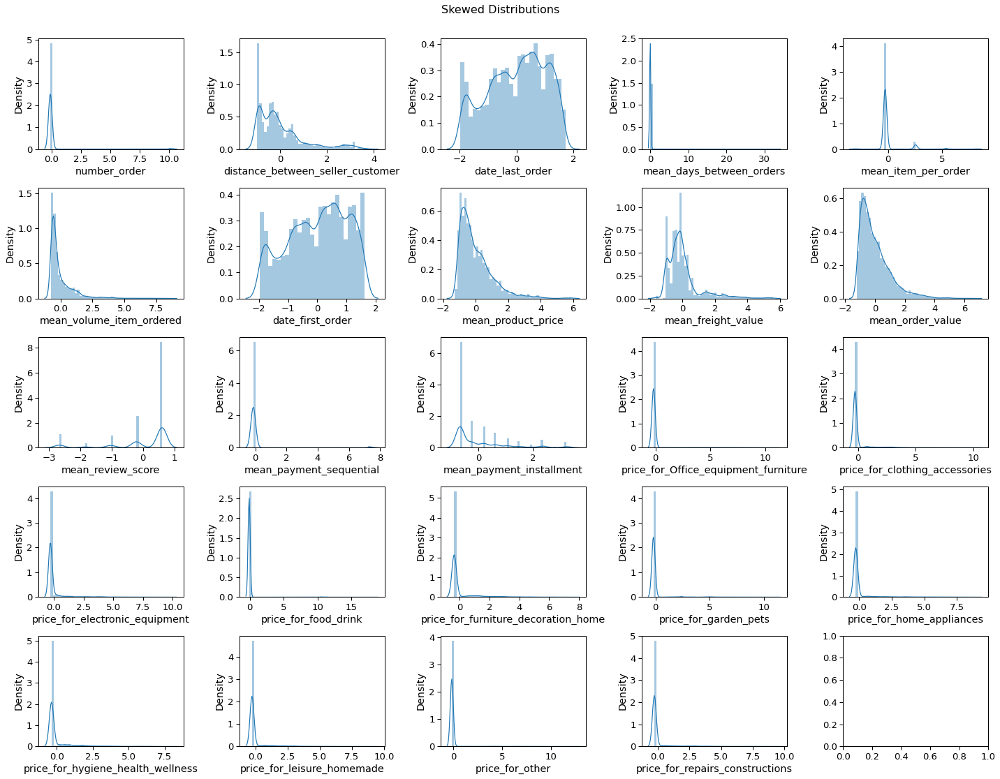


 
 Dummy variable : one-hot encoding by the method get_dummies
(10584, 3)
20 total features after one-hot encoding.

 Final Dataset
Le jeu de données a 10584 lignes et 44 colonnes.
There is no missing data 
 
 
 
 


In [ ]:
sample_7strim = standartization_encodage(sample_7strim)

# <font color='green'> Determination of the best adapted algorithm on a sample of data (the first 6 months)</font>

In [ ]:
frames = [sample_1strim, sample_2strim]
sample_6months = pd.concat(frames)

In [ ]:
sample_6months.shape

(12005, 44)

In [ ]:
sample_6months.head()

,number_order,distance_between_seller_customer,date_last_order,mean_days_between_orders,mean_item_per_order,mean_volume_item_ordered,date_first_order,mean_product_price,mean_freight_value,mean_order_value,mean_review_score,mean_payment_sequential,mean_payment_installment,price_for_Office_equipment_furniture,price_for_clothing_accessories,price_for_electronic_equipment,price_for_food_drink,price_for_furniture_decoration_home,price_for_garden_pets,price_for_home_appliances,price_for_hygiene_health_wellness,price_for_leisure_homemade,price_for_other,price_for_repairs_constructions,customer_region_Central,customer_region_North,customer_region_Northeast,customer_region_South,customer_region_Southeast,most_payment_used_boleto,most_payment_used_credit_card,most_payment_used_debit_card,most_payment_used_voucher,category_most_purchased_Office_equipment_furniture,category_most_purchased_clothing_accessories,category_most_purchased_electronic_equipment,category_most_purchased_food_drink,category_most_purchased_furniture_decoration_home,category_most_purchased_garden_pets,category_most_purchased_home_appliances,category_most_purchased_hygiene_health_wellness,category_most_purchased_leisure_homemade,category_most_purchased_other,category_most_purchased_repairs_constructions
0,-0.155442,-0.716212,0.952531,-0.098178,2.391131,0.280796,1.129480,-0.996911,-0.217004,-0.655288,-0.033154,-0.165424,0.543321,-0.191505,-0.209556,-0.279448,20.322316,-0.415259,-0.204358,-0.216707,-0.297083,-0.29524,-0.242027,-0.173732,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0
1,-0.155442,-1.025170,0.605344,-0.098178,-0.204804,-0.671319,0.736842,-0.943119,-1.040324,-1.055530,0.704180,-0.165424,-0.674055,-0.191505,-0.209556,0.138333,-0.055156,-0.415259,-0.204358,-0.216707,-0.297083,-0.29524,-0.242027,-0.173732,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0
2,-0.155442,2.830277,1.200522,-0.098178,-0.204804,-0.661883,1.409937,0.657341,0.974644,0.571691,-1.507821,-0.165424,-0.268263,-0.191505,-0.209556,-0.279448,-0.055156,-0.415259,-0.204358,-0.216707,2.159689,-0.29524,-0.242027,-0.173732,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0
3,-0.155442,-0.882448,-1.279386,-0.098178,-0.204804,-0.569242,-1.394626,2.015601,-0.611813,1.624381,0.704180,-0.165424,2.166488,-0.191505,5.657059,-0.279448,-0.055156,-0.415259,-0.204358,-0.216707,-0.297083,-0.29524,-0.242027,-0.173732,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0
4,-0.155442,-0.205022,-1.180189,-0.098178,-0.204804,1.623872,-1.282444,1.288058,-0.229041,1.014008,-2.245155,-0.165424,-0.674055,-0.191505,-0.209556,-0.279448,-0.055156,-0.415259,-0.204358,6.754121,-0.297083,-0.29524,-0.242027,-0.173732,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0


## <font color='blue'> PCA Transformation : Reduce Dimensionality</font>

Identification of descriptor combinations to reduce the number of dataset dimensions. In this step, we will find the optimal number of components which capture the greatest amount of variance in the data.

In [ ]:
sample_6months.columns

Index(['number_order', 'distance_between_seller_customer', 'date_last_order',
       'mean_days_between_orders', 'mean_item_per_order',
       'mean_volume_item_ordered', 'date_first_order', 'mean_product_price',
       'mean_freight_value', 'mean_order_value', 'mean_review_score',
       'mean_payment_sequential', 'mean_payment_installment',
       'price_for_Office_equipment_furniture',
       'price_for_clothing_accessories', 'price_for_electronic_equipment',
       'price_for_food_drink', 'price_for_furniture_decoration_home',
       'price_for_garden_pets', 'price_for_home_appliances',
       'price_for_hygiene_health_wellness', 'price_for_leisure_homemade',
       'price_for_other', 'price_for_repairs_constructions',
       'customer_region_Central', 'customer_region_North',
       'customer_region_Northeast', 'customer_region_South',
       'customer_region_Southeast', 'most_payment_used_boleto',
       'most_payment_used_credit_card', 'most_payment_used_debit_card',
       'mos

In [ ]:
# %%flake8
pca = PCA(n_components=sample_6months.shape[1], random_state=40)

In [ ]:
# %%flake8
pca.fit_transform(sample_6months)

array([[-1.65489499e+00,  1.13124220e+00,  4.96663259e-01, ...,
         6.59522404e-14,  2.84098999e-16,  1.23054651e-15],
       [-2.22646726e+00,  7.09249008e-01, -5.68479656e-01, ...,
        -7.02107128e-15,  3.25420310e-15, -1.96169659e-15],
       [ 1.43548361e+00,  1.02821375e+00, -4.52229133e-01, ...,
         1.04862238e-16,  8.36386966e-16, -4.02741083e-16],
       ...,
       [-1.54845850e+00, -1.72631476e+00, -4.32394688e-01, ...,
        -1.28849547e-17, -1.33525403e-16, -9.69893691e-17],
       [-6.63828147e-01, -3.66326547e-01,  2.35108139e-01, ...,
         1.23447052e-16, -1.14748112e-18, -4.85583534e-17],
       [-6.67883669e-01,  1.02935446e-01,  2.07827989e-01, ...,
        -3.78313553e-16, -1.84032907e-16, -7.95221499e-17]])

In [ ]:
# pca.explained_variance_ratio_

In [ ]:
# pca.singular_values_

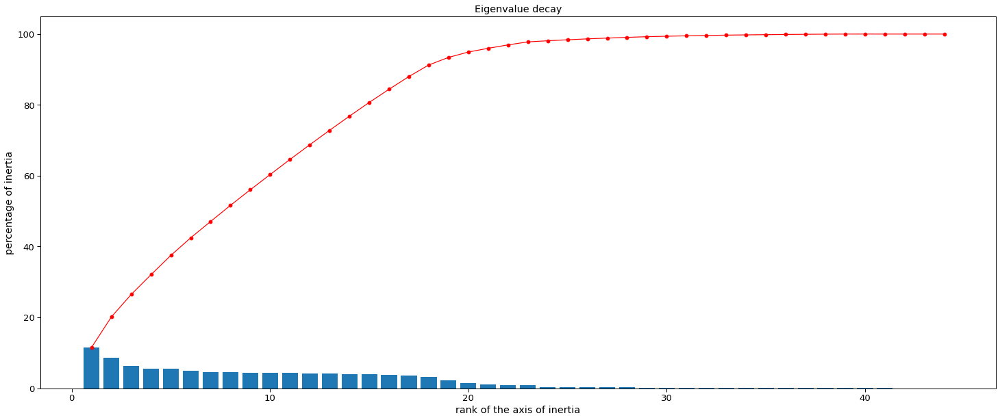

In [ ]:
plt.figure(figsize=(25, 10))
display_scree_plot(pca)

In [ ]:
np.cumsum(pca.explained_variance_ratio_)[18]

0.9340856949923801

With 19 features we have 93 % of the total variance.

In [ ]:
composantes = pca.components_

In [ ]:
nbre_composantes = pca.n_components
nbre_composantes

44

Assuming that only the two most explanatory components are retained, we obtain the following factorial design:

In [ ]:
colonnes_pca = sample_6months.columns

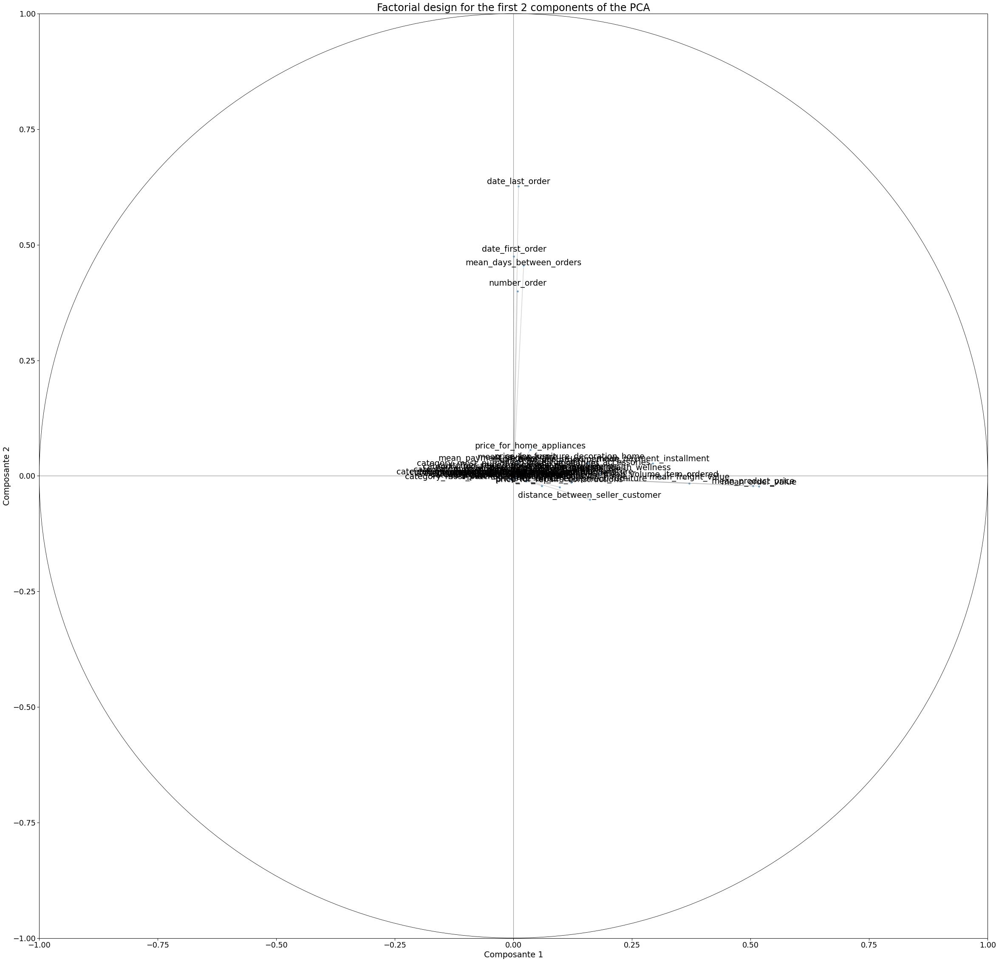

In [ ]:
# %%flake8
# from matplotlib.patches import Circle
sns.set_context("paper", font_scale=2)
plt.figure(figsize=(40, 40))
chaine = "Factorial design for the first 2 components of the PCA"
plt.title(chaine, fontsize=24)
plt.xlabel("Composante 1")
plt.ylabel("Composante 2")
ax = plt.gca()
ax.add_patch(
    Circle([0, 0], radius=1, color="black",
           fill=False, linestyle="-", clip_on=False)
)
ax.set_xlim(-1, 1)
ax.set_ylim(-1, 1)
x_pca = pca.components_[0, :]
y_pca = pca.components_[1, :]

sns.scatterplot(x=x_pca, y=y_pca, alpha=0.7)
plt.plot([-1, 1], [0, 0], color="grey", alpha=0.8)
plt.plot([0, 0], [-1, 1], color="grey", alpha=0.8)

i = 0
for x, y, colonne in zip(x_pca, y_pca, colonnes_pca):

    plt.annotate(
        colonne,
        (x, y),
        textcoords="offset points",
        xytext=(0, 5 + np.random.randint(-10, 10)),
        ha="center",
    )
    ax.arrow(0, 0, x, y, head_width=0, head_length=0,
             fc="grey", ec="grey", alpha=0.2)


sns.set_context("paper", font_scale=1)

The variables most correlated with F1 are:
* mean_order_value
* mean_product_price
* mean_payment_installment
* mean_freight_value
* distance_between_seller_customer

They are positively correlated to F1. We can therefore interpret F1 as the expenditure on an order.



The variables most correlated to F2 are:
* date_first_order
* date_last_order
* mean_days_between_orders
* number_order

They are positively correlated to F2. We can therefore interpret F2 as the frequency of purchase.

In [ ]:
# %%flake8
a_show = pca.transform(sample_6months)[:, 0]  # Component 1

b_show = pca.transform(sample_6months)[:, 1]  # Component 2

c_show = pca.transform(sample_6months)[:, 2]  # Component 3

d_show = pca.transform(sample_6months)[:, 3]  # Component 4

e_show = pca.transform(sample_6months)[:, 4]  # Component 5

f_show = pca.transform(sample_6months)[:, 5]  # Component 6

g_show = pca.transform(sample_6months)[:, 6]  # Component 7

h_show = pca.transform(sample_6months)[:, 7]  # Component 8

i_show = pca.transform(sample_6months)[:, 8]  # Component 9

j_show = pca.transform(sample_6months)[:, 9]  # Component 10

In [ ]:
# %%flake8
X_pca = pca.transform(sample_6months)[:, :18]

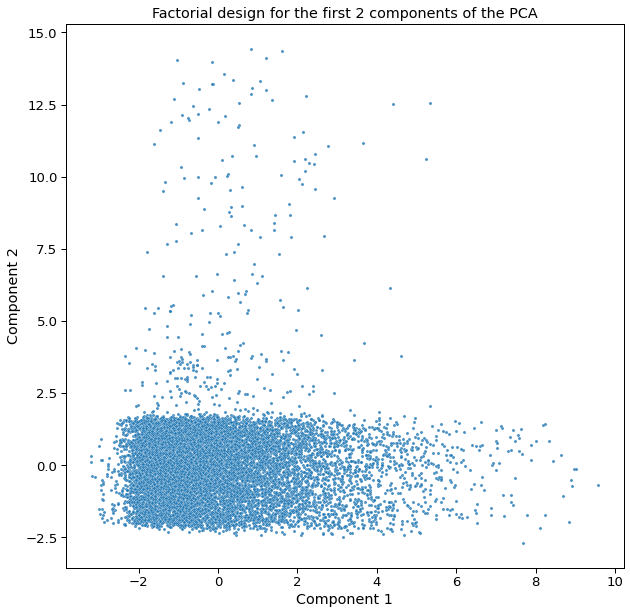

In [ ]:
#%%flake8
sns.set_context("paper", font_scale=1.5)
plt.figure(figsize=(10, 10))
chaine = "Factorial design for the first 2 components of the PCA"
plt.title(chaine)
plt.xlabel("Component 1")
plt.ylabel("Component 2")
ax = plt.gca()

sns.scatterplot(x=a_show, y=b_show, alpha=0.8, s=10)

sns.set_context("paper", font_scale=1)

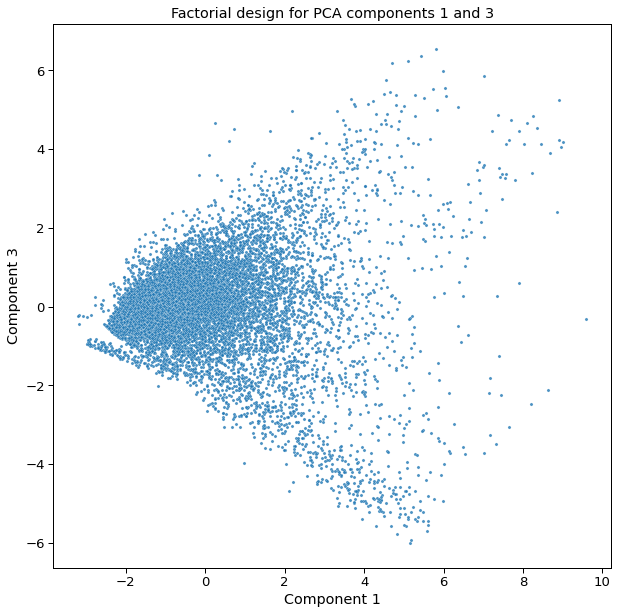

In [ ]:
sns.set_context("paper", font_scale=1.5)
plt.figure(figsize=(10, 10))
chaine = "Factorial design for PCA components 1 and 3"
plt.title(chaine)
plt.xlabel("Component 1")
plt.ylabel("Component 3")
ax = plt.gca()

sns.scatterplot(
    x=a_show,
    y=c_show,
    # hue = hue_show,
    alpha=0.8,
    s=10,
)
sns.set_context("paper", font_scale=1)

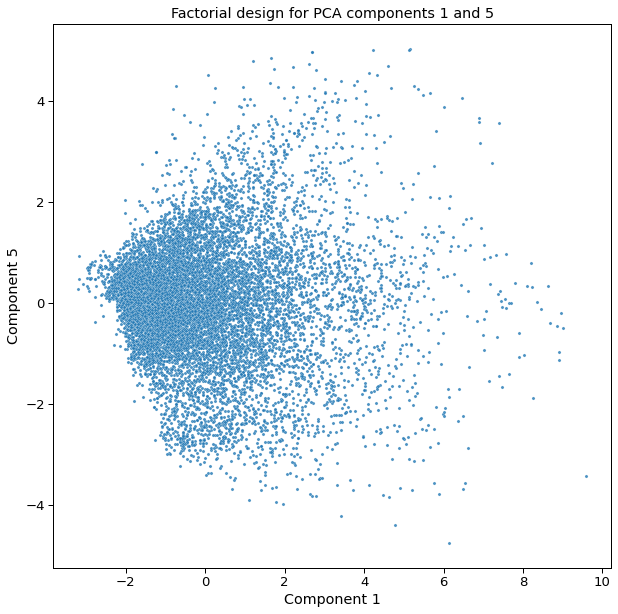

In [ ]:
sns.set_context("paper", font_scale=1.5)
plt.figure(figsize=(10, 10))
chaine = "Factorial design for PCA components 1 and 5"
plt.title(chaine)
plt.xlabel("Component 1")
plt.ylabel("Component 5")
ax = plt.gca()

sns.scatterplot(
    x=a_show,
    y=e_show,
    # hue = hue_show,
    alpha=0.8,
    s=10,
)
sns.set_context("paper", font_scale=1)

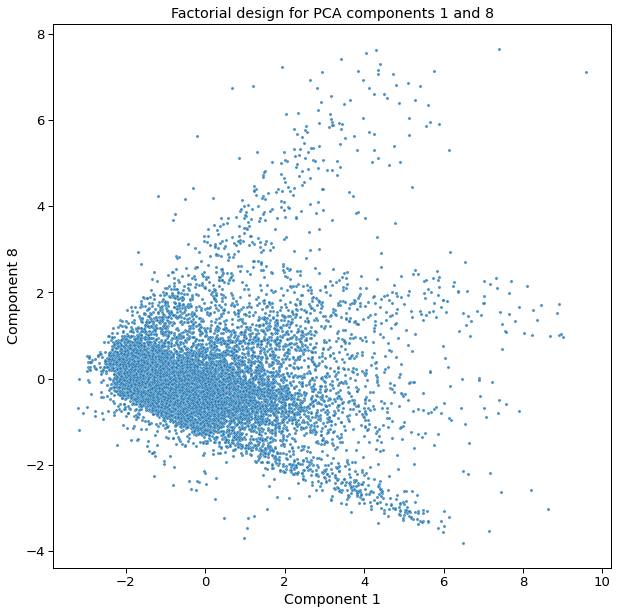

In [ ]:
sns.set_context("paper", font_scale=1.5)
plt.figure(figsize=(10, 10))
chaine = "Factorial design for PCA components 1 and 8"
plt.title(chaine)
plt.xlabel("Component 1")
plt.ylabel("Component 8")
ax = plt.gca()

sns.scatterplot(
    x=a_show,
    y=h_show,
    # hue = hue_show,
    alpha=0.8,
    s=10,
)
sns.set_context("paper", font_scale=1)

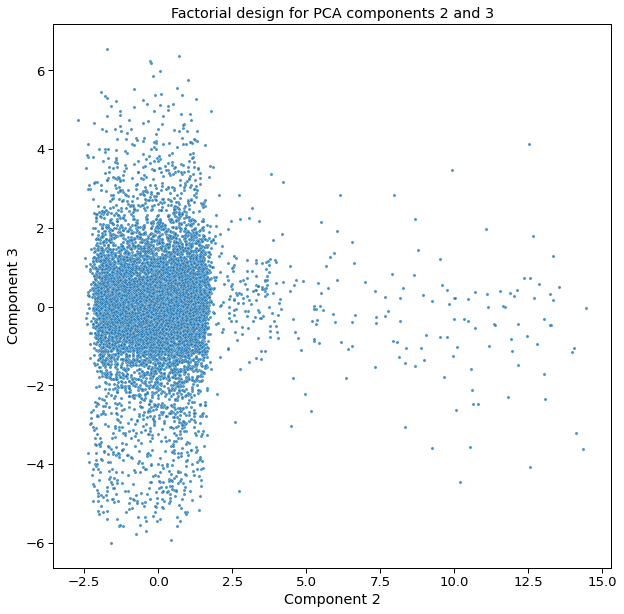

In [ ]:
sns.set_context("paper", font_scale=1.5)
plt.figure(figsize=(10, 10))
chaine = "Factorial design for PCA components 2 and 3"
plt.title(chaine)
plt.xlabel("Component 2")
plt.ylabel("Component 3")
ax = plt.gca()

sns.scatterplot(
    x=b_show,
    y=c_show,
    # hue = hue_show,
    alpha=0.8,
    s=10,
)

sns.set_context("paper", font_scale=1)

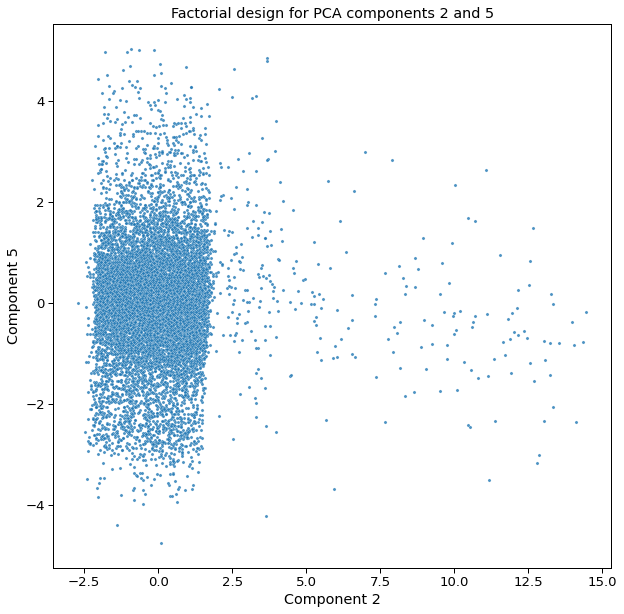

In [ ]:
sns.set_context("paper", font_scale=1.5)
plt.figure(figsize=(10, 10))
chaine = "Factorial design for PCA components 2 and 5"
plt.title(chaine)
plt.xlabel("Component 2")
plt.ylabel("Component 5")
ax = plt.gca()

sns.scatterplot(
    x=b_show,
    y=e_show,
    # hue = hue_show,
    alpha=0.8,
    s=10,
)

sns.set_context("paper", font_scale=1)

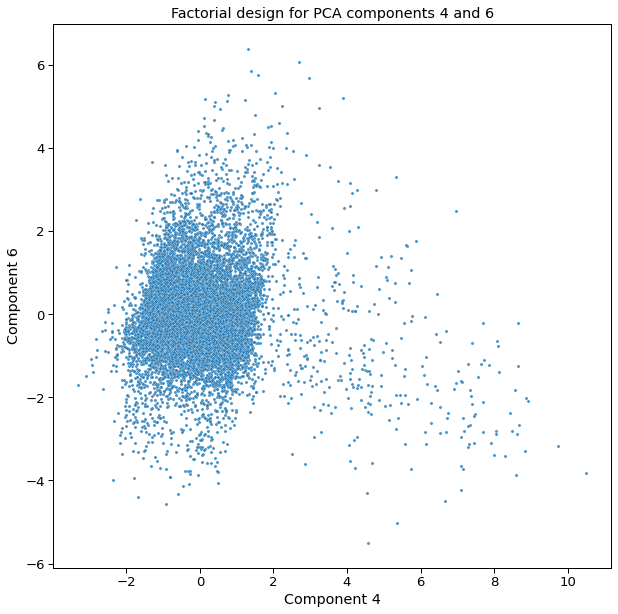

In [ ]:
sns.set_context("paper", font_scale=1.5)
plt.figure(figsize=(10, 10))
chaine = "Factorial design for PCA components 4 and 6"
plt.title(chaine)
plt.xlabel("Component 4")
plt.ylabel("Component 6")
ax = plt.gca()

sns.scatterplot(
    x=d_show,
    y=f_show,
    # hue = hue_show,
    alpha=0.8,
    s=10,
)

sns.set_context("paper", font_scale=1)

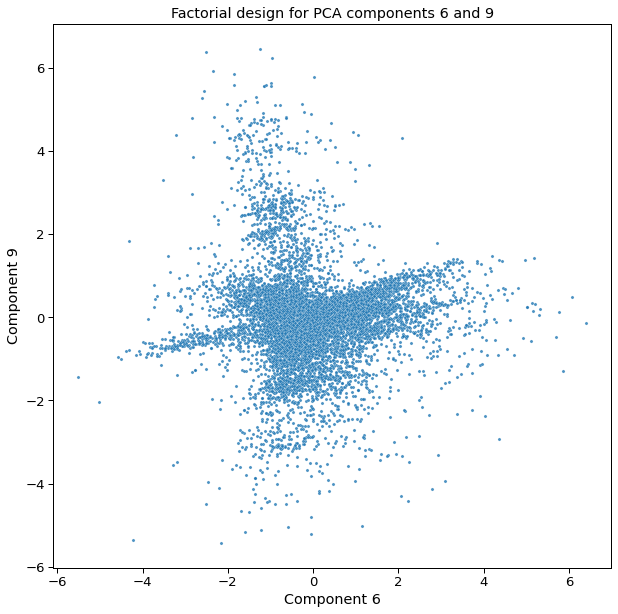

In [ ]:
sns.set_context("paper", font_scale=1.5)
plt.figure(figsize=(10, 10))
chaine = "Factorial design for PCA components 6 and 9"
plt.title(chaine)
plt.xlabel("Component 6")
plt.ylabel("Component 9")
ax = plt.gca()

sns.scatterplot(
    x=f_show,
    y=i_show,
    # hue = hue_show,
    alpha=0.8,
    s=10,
)

sns.set_context("paper", font_scale=1)

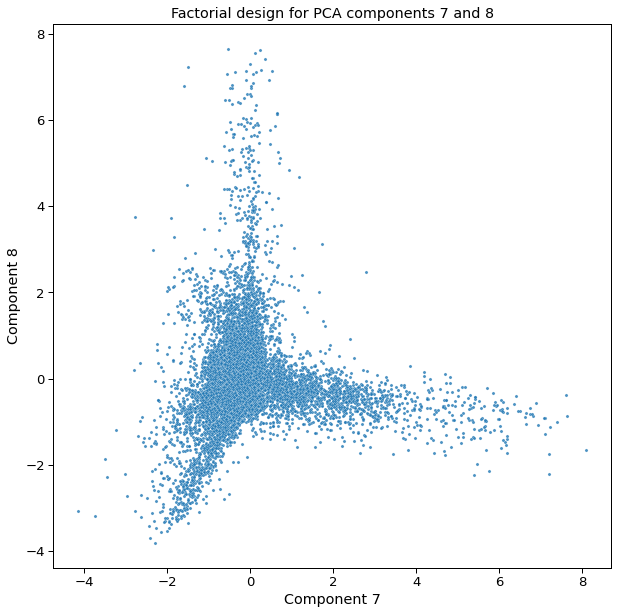

In [ ]:
sns.set_context("paper", font_scale=1.5)
plt.figure(figsize=(10, 10))
chaine = "Factorial design for PCA components 7 and 8"
plt.title(chaine)
plt.xlabel("Component 7")
plt.ylabel("Component 8")
ax = plt.gca()

sns.scatterplot(
    x=g_show,
    y=h_show,
    # hue = hue_show,
    alpha=0.8,
    s=10,
)

sns.set_context("paper", font_scale=1)

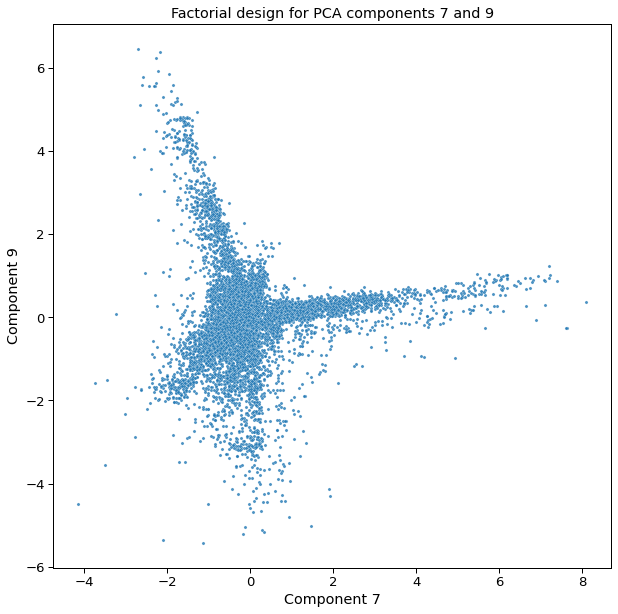

In [ ]:
sns.set_context("paper", font_scale=1.5)
plt.figure(figsize=(10, 10))
chaine = "Factorial design for PCA components 7 and 9"
plt.title(chaine)
plt.xlabel("Component 7")
plt.ylabel("Component 9")
ax = plt.gca()

sns.scatterplot(
    x=g_show,
    y=i_show,
    # hue = hue_show,
    alpha=0.8,
    s=10,
)

sns.set_context("paper", font_scale=1)

## <font color='blue'> First visualization : T-SNE  </font>

Let's use the T-SNE algorithm to visualize and get an idea of the number of homogeneous groups.

In [ ]:
# %%flake8
tsne = TSNE(n_components=2, init="pca")
X_trans = tsne.fit_transform(X_pca.copy())

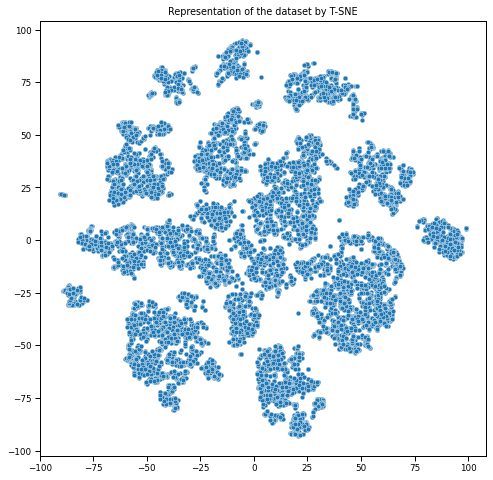

In [ ]:
# %%flake8
plt.figure(figsize=(8, 8))
plt.title("Representation of the dataset by T-SNE")
sns.scatterplot(X_trans[:, 0], X_trans[:, 1])

## <font color='blue'> Clustering with kmeans </font>

K-means clustering is a simple unsupervised learning algorithm that is used to solve clustering problems. It follows a simple procedure of classifying a given data set into a number of clusters, defined by the letter "k," which is fixed beforehand. The clusters are then positioned as points and all observations or data points are associated with the nearest cluster, computed, adjusted and then the process starts over using the new adjustments until a desired result is reached.

K-means clustering has uses in search engines, market segmentation, statistics and even astronomy.



### <font color='violet'> Find the Clusters : The Elbow method </font>

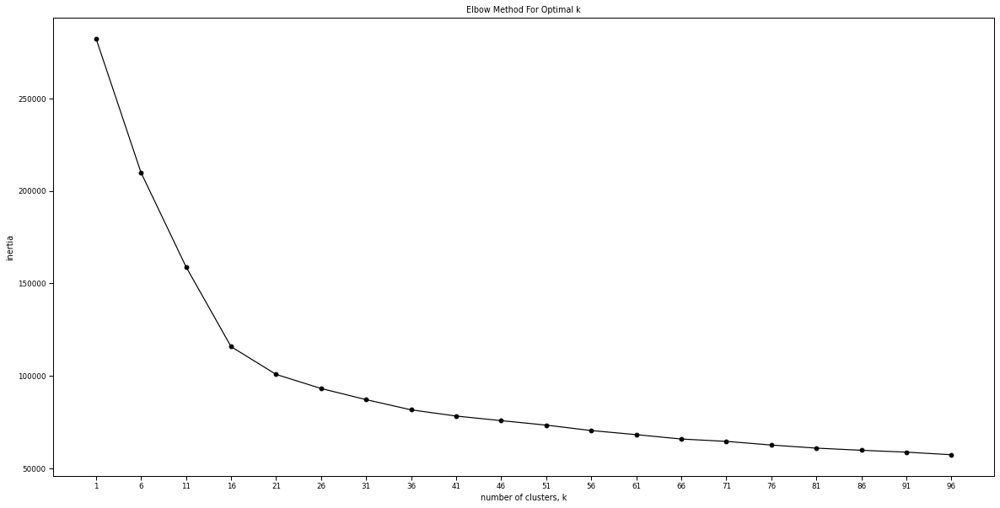

In [ ]:
# %%flake8
ks = range(1, 101, 5)
inertia = {}
dict_kmeans_1 = {}
for k in ks:
    # Create a KMeans instance with k clusters: model
    model = KMeans(n_clusters=k, random_state=10, init='k-means++')

    # Fit model to samples
    kmeans = model.fit(X_pca)

    # Append the inertia to the list of inertias
    # inertias.append(kmeans.inertia_)
    inertia[k] = kmeans.inertia_
    dict_kmeans_1[k] = kmeans

plt.figure(figsize=(20, 10))
# plt.plot(ks, inertias, '-o', color='black')
plt.plot(list(inertia.keys()), list(inertia.values()), "-o", color="black")
plt.xlabel("number of clusters, k")
plt.ylabel("inertia")
plt.title('Elbow Method For Optimal k')
plt.xticks(ks)
plt.show()

We can see here that there is no visible bend, which means that we need a large number of clusters for our data. However, our study is intended for the marketing team, so we must limit the number of clusters to 2 and 10.

In [ ]:
# %%flake8
inertia = {}
dbouldin_kmeans_sample1 = {}
silhouettes_kmeans_sample1 = {}
dict_kmeans_sample1 = {}
for k in range(2, 11):
    # seed of 10 for reproducibility.
    kmeans = KMeans(n_clusters=k, random_state=10, init='k-means++').fit(X_pca.copy())
    clusters = kmeans.labels_
    inertia[k] = (kmeans.inertia_)  # Inertia: Sum of distances of samples to their closest cluster center
    dict_kmeans_sample1[k] = kmeans
    dbouldin_kmeans_sample1[k] = davies_bouldin_score(X_pca.copy(), clusters)    #. DaviesBouldin
    silhouettes_kmeans_sample1[k] = silhouette_score(X_pca.copy(), clusters)

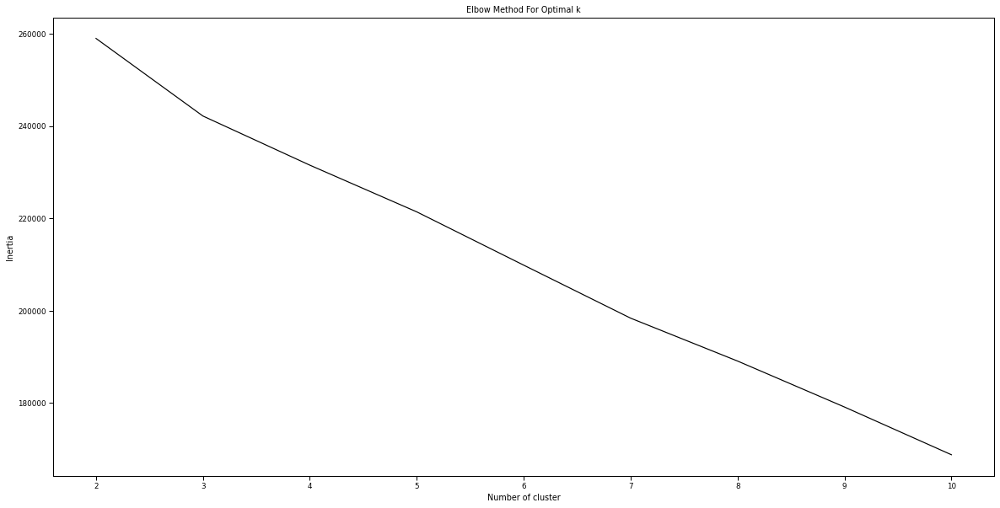

In [ ]:
# %%flake8
plt.figure(figsize=(20, 10))
plt.plot(list(inertia.keys()), list(inertia.values()), color="black")  # , '-o'
plt.xlabel("Number of cluster")
plt.ylabel("Inertia")
plt.title('Elbow Method For Optimal k')
plt.show()

With the Elbow method, we can see a slight bend at 3 clusters. We can say that for this method, the optimal number of clusters is 3.

### <font color='violet'> Find and quality of Clusters : Davies-Bouldin Index </font>

The Davies-Bouldin index = comparing intra-cluster distances (homogeneity), which we want to be small, to inter-cluster distances (separation), which we want to be large.  It is an index to minimiser.

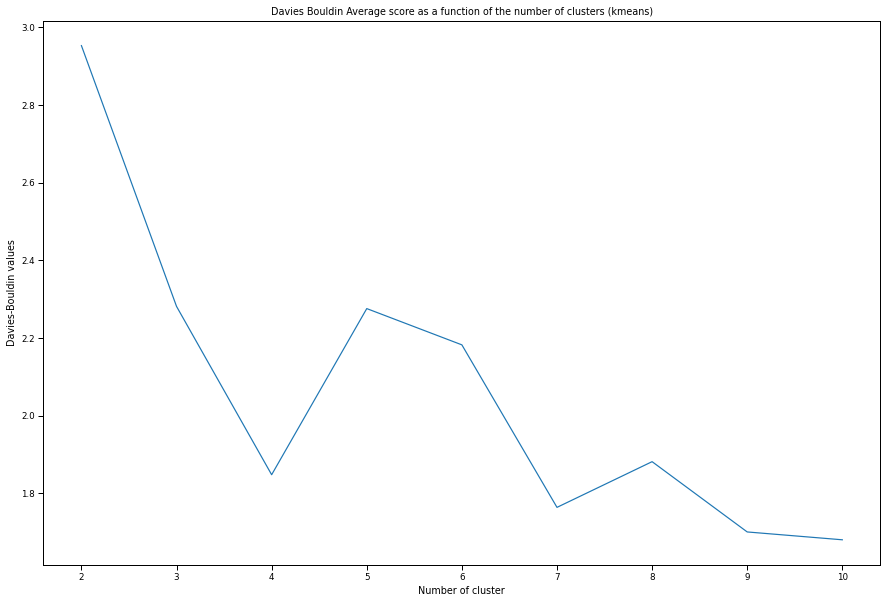

In [ ]:
# %%flake8
plt.figure(figsize=(15, 10))
plt.plot(
    list(dbouldin_kmeans_sample1.keys()), list(
        dbouldin_kmeans_sample1.values())
)  # ,linestyle='-', marker='o
plt.title(
    "Davies Bouldin Average score as a function of the "
    "number of clusters (kmeans)"
)
plt.xlabel("Number of cluster")
plt.ylabel("Davies-Bouldin values")
plt.show()

In [ ]:
# %%flake8
for key, value in dbouldin_kmeans_sample1.items():
    if value == min(dbouldin_kmeans_sample1.values()):
        print(
            "The Davies Bouldin score is minimal for {} clusters "
            "(score = {:0.3f})".format(
                key, value
            )
        )
        davies_bouldin_kmean_sample1 = value

The Davies Bouldin score is minimal for 10 clusters (score = 1.680)


The index is minimal after 10 clusters but there are local minima at 4 and 7 clusters.

### <font color='violet'> Find and quality of Clusters : Silhouette coefficient </font>

The silhouette coefficient is the difference between the average distance to the points of the same group (cohesion) and the average distance to the points of the other neighboring groups (separation). If this difference is negative, the point is on average closer to the neighboring group than to its own: it is thus badly classified. On the contrary, if this difference is positive, the point is on average closer to its group than to the neighboring group: it is therefore well classified. It is a score to maximize.

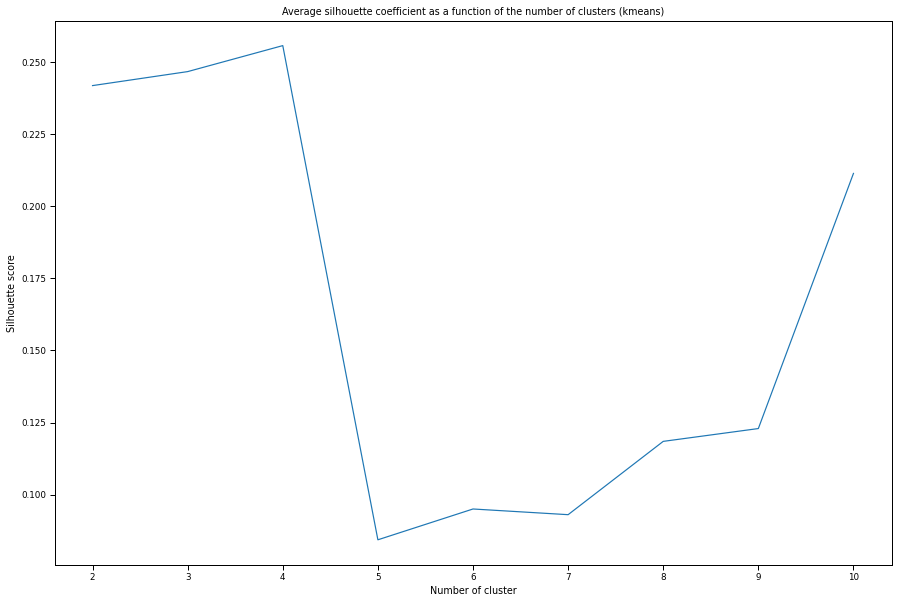

In [ ]:
# %%flake8
plt.figure(figsize=(15, 10))
plt.plot(
    list(silhouettes_kmeans_sample1.keys()), list(
        silhouettes_kmeans_sample1.values())
)  # ,linestyle='-', marker='o'
plt.title(
    "Average silhouette coefficient as a function of the number "
    "of clusters (kmeans)"
)
plt.xlabel("Number of cluster")
plt.ylabel("Silhouette score")
plt.show()

In [ ]:
# %%flake8
for key, value in silhouettes_kmeans_sample1.items():
    if value == max(silhouettes_kmeans_sample1.values()):
        print(
            "The silhouette coefficient is maximal for {} clusters "
            "(score = {:0.3f})".format(
                key, value
            )
        )
        silou_kmean_sample1 = value
        nb_clusters = key

The silhouette coefficient is maximal for 4 clusters (score = 0.256)


The silhouette coefficient is maximal for a number of 4 clusters and 3 for the elbow method. The silhouette coefficient method being more reliable and robust, the optimal number of clusters retained for the k-means method is 4.

### <font color='violet'> Summary table of the method </font>

In [ ]:
# %%flake8
comparison_sample1 = pd.DataFrame({})

comparison_sample1 = comparison_sample1.append(
    pd.DataFrame(
        {
            "Modele": "Kmeans",
            "nb_cluster": nb_clusters,
            "min_Davies_Bouldin": davies_bouldin_kmean_sample1,
            "max_silhouette": silou_kmean_sample1
        },
        index=[0],
    )
)

In [ ]:
comparison_sample1

,Modele,nb_cluster,min_Davies_Bouldin,max_silhouette
0,Kmeans,4,1.679764,0.255669


### <font color='violet'> Representation </font>

In [ ]:
# %%flake8
tsne = TSNE(n_components=2, init="pca")
X_trans = tsne.fit_transform(X_pca)

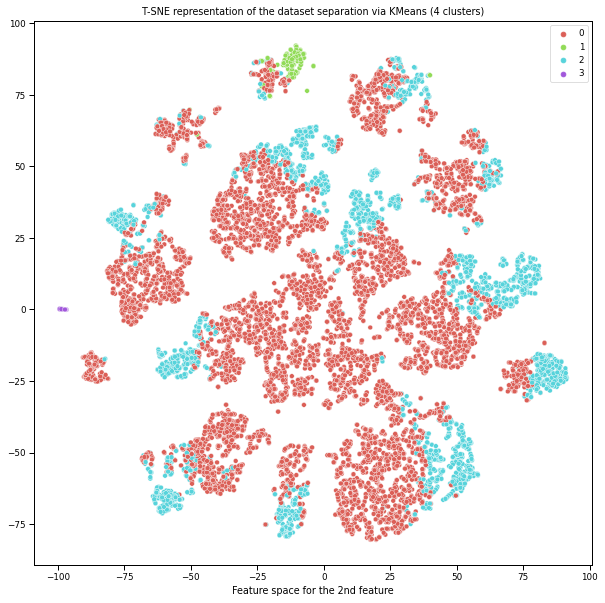

In [ ]:
# %%flake8
plt.figure(figsize=(10, 10))  # augmenter nombre composante
plt.title("T-SNE representation of the dataset separation via "
          "KMeans (4 clusters)")
sns.scatterplot(
    X_trans[:, 0],
    X_trans[:, 1],
    hue=dict_kmeans_sample1[4].labels_,
    legend="full",
    palette=sns.color_palette("hls", 4),
)
plt.xlabel("Feature space for the 1st feature")
plt.xlabel("Feature space for the 2nd feature")
plt.show()

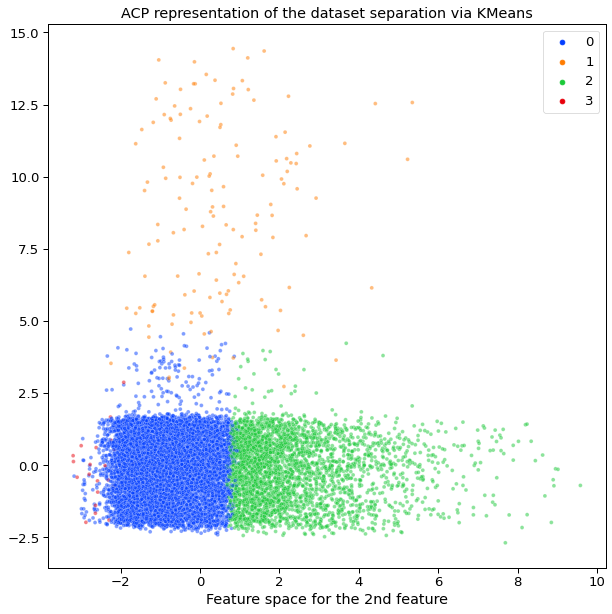

In [ ]:
# %%flake8
from matplotlib.patches import Circle

sns.set_context("paper", font_scale=1.5)
plt.figure(figsize=(10, 10))
plt.title("ACP representation of the dataset separation via KMeans")
plt.xlabel("Feature space for the 1st feature")
plt.xlabel("Feature space for the 2nd feature")
ax = plt.gca()

sns.scatterplot(
    x=a_show,  # composante 1 ACP
    y=b_show,  # composante 2 ACP
    hue=dict_kmeans_sample1[4].labels_,
    alpha=0.5,
    s=15,
    legend="full",
    palette="bright",
)

## <font color='blue'> Hierarchical Clustering </font>

Agglomerative clustering works in a “bottom-up” manner. That is, each object is initially considered as a single-element cluster. At each step of the algorithm, the two clusters that are the most similar are combined into a new bigger cluster. This procedure is iterated until all points are member of just one single big cluster.

In [ ]:
# %%flake8
dbouldin_hierarchic_sample1 = {}
silhouettes_hierarchic_sample1 = {}
dict_hierarchic_sample1 = {}
for k in range(2, 11):
    # seed of 10 for reproducibility.
    hierarchic = AgglomerativeClustering(n_clusters=k).fit(X_pca.copy())
    clusters = hierarchic.labels_
    dict_hierarchic_sample1[k] = hierarchic
    dbouldin_hierarchic_sample1[k] = davies_bouldin_score(
        X_pca.copy(), clusters)
    silhouettes_hierarchic_sample1[k] = silhouette_score(
        X_pca.copy(), clusters)

### <font color='violet'> Find and quality of Clusters : Davies-Bouldin Index </font>

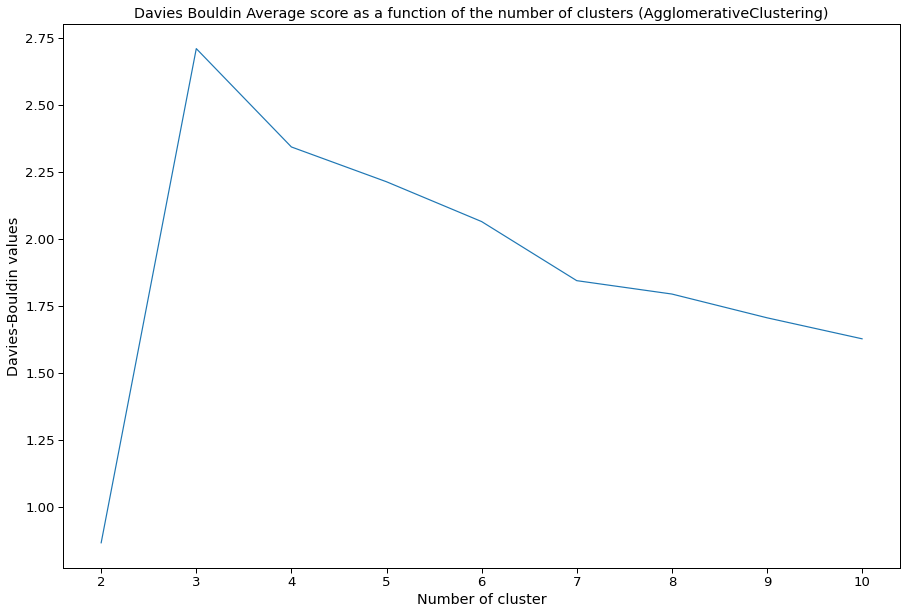

In [ ]:
# %%flake8
plt.figure(figsize=(15, 10))
plt.plot(
    list(dbouldin_hierarchic_sample1.keys()), list(
        dbouldin_hierarchic_sample1.values())
)  # ,linestyle='-', marker='o
plt.title(
    "Davies Bouldin Average score as a function of the number "
    "of clusters (AgglomerativeClustering)"
)
plt.xlabel("Number of cluster")
plt.ylabel("Davies-Bouldin values")
plt.show()

In [ ]:
# %%flake8
for key, value in dbouldin_hierarchic_sample1.items():
    if value == min(dbouldin_hierarchic_sample1.values()):
      print(
            "The Davies Bouldin score is minimal for {} clusters "
            "(score = {:0.3f})".format(
                key, value
            )
        )

The Davies Bouldin score is minimal for 2 clusters (score = 0.866)


### <font color='violet'> Find and quality of Clusters : Silhouette coefficient </font>

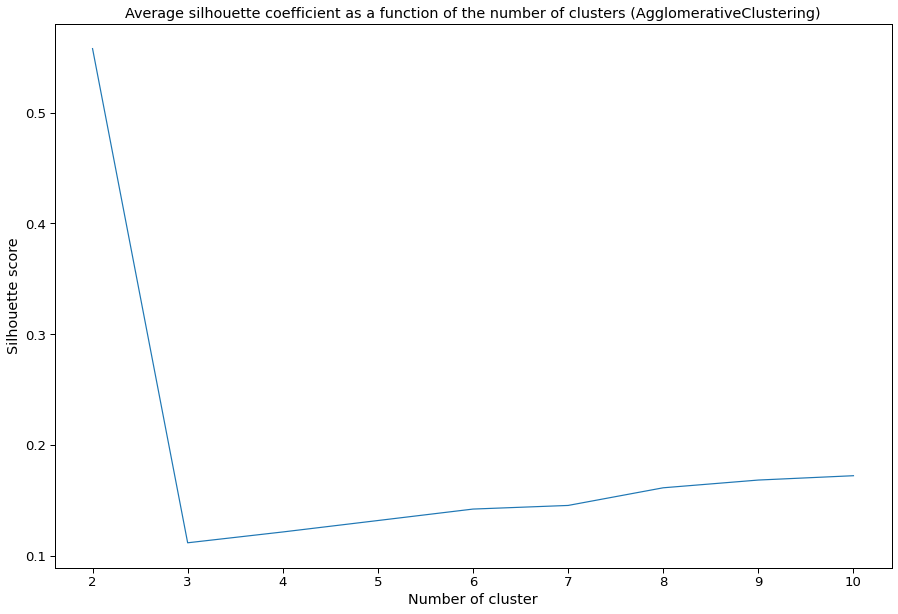

In [ ]:
# %%flake8
plt.figure(figsize=(15, 10))
plt.plot(
    list(silhouettes_hierarchic_sample1.keys()),
    list(silhouettes_hierarchic_sample1.values()),
)  # ,linestyle='-', marker='o'
plt.title(
    "Average silhouette coefficient as a function of the number "
    "of clusters (AgglomerativeClustering)"
)
plt.xlabel("Number of cluster")
plt.ylabel("Silhouette score")
plt.show()

In [ ]:
# %%flake8
for key, value in silhouettes_hierarchic_sample1.items():
  if value == max(silhouettes_hierarchic_sample1.values()):
    print(
            "The silhouette coefficient is maximal for {} clusters "
            "(score = {:0.3f})".format(
                key, value
            )
        )

The silhouette coefficient is maximal for 2 clusters (score = 0.558)


The silhouette coefficient is maximal and the Davies Boulding index is minimal for 2 clusters. The optimal number of clusters retained for the AgglomerativeClustering method is 2. The number not allowing to make a relevant segmentation, I decide to compare this algorithm and the k-means algorithm on the basis of the Davies Bouldin index and the silouhette coefficient for the same number of clusters.

In [ ]:
# %%flake8
for key, value in dbouldin_hierarchic_sample1.items():
    if key == 4 :
    #if value == min(dbouldin_hierarchic_sample1.values()):
      print(
            "The Davies Bouldin score is for {} clusters "
            "(score = {:0.3f})".format(
                key, value
            )
        )
      davies_bouldin_hierarchic_sample1 = value

The Davies Bouldin score is for 4 clusters (score = 2.343)


In [ ]:
# %%flake8
for key, value in silhouettes_hierarchic_sample1.items():
  if key == 4 :
    #if value == max(silhouettes_hierarchic_sample1.values()):
    print(
            "The silhouette coefficient is for {} clusters "
            "(score = {:0.3f})".format(
                key, value
            )
        )
    silou_hierarchic_sample1 = value
    nb_clusters = key

The silhouette coefficient is for 4 clusters (score = 0.122)


### <font color='violet'> Summary table of the method </font>

In [ ]:
# %%flake8
comparison_sample1 = comparison_sample1.append(
    pd.DataFrame(
        {
            "Modele": "hierarchical clustering",
            "nb_cluster": nb_clusters,
            "min_Davies_Bouldin": davies_bouldin_hierarchic_sample1,
            "max_silhouette": silou_hierarchic_sample1
        },
        index=[1],
    )
)

In [ ]:
comparison_sample1

,Modele,nb_cluster,min_Davies_Bouldin,max_silhouette
0,Kmeans,4,1.679764,0.255669
1,hierarchical clustering,4,2.342708,0.121591


### <font color='violet'> Representation </font>

In [ ]:
# %%flake8
tsne = TSNE(n_components=2, init="pca")
X_trans = tsne.fit_transform(X_pca)

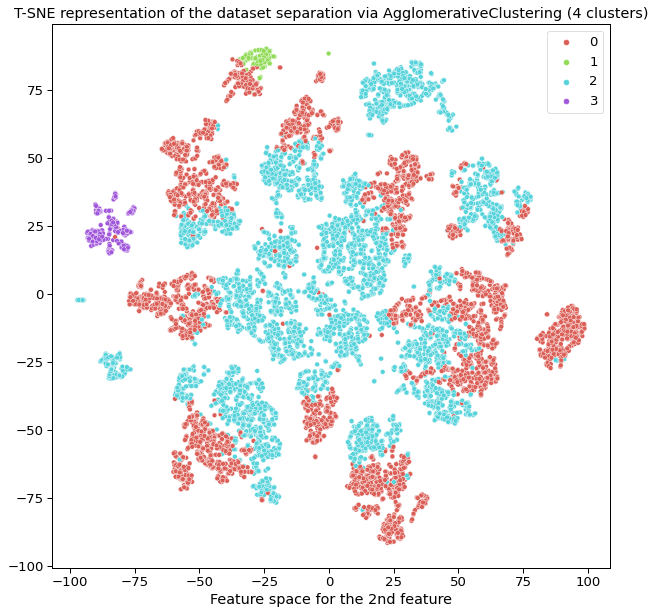

In [ ]:
# %%flake8
plt.figure(figsize=(10, 10))
plt.title(
    "T-SNE representation of the dataset separation via "
    "AgglomerativeClustering (4 clusters)"
)
sns.scatterplot(
    X_trans[:, 0],
    X_trans[:, 1],
    hue=dict_hierarchic_sample1[4].labels_,
    legend="full",
    palette=sns.color_palette("hls", 4),
)
plt.xlabel("Feature space for the 1st feature")
plt.xlabel("Feature space for the 2nd feature")
plt.show()

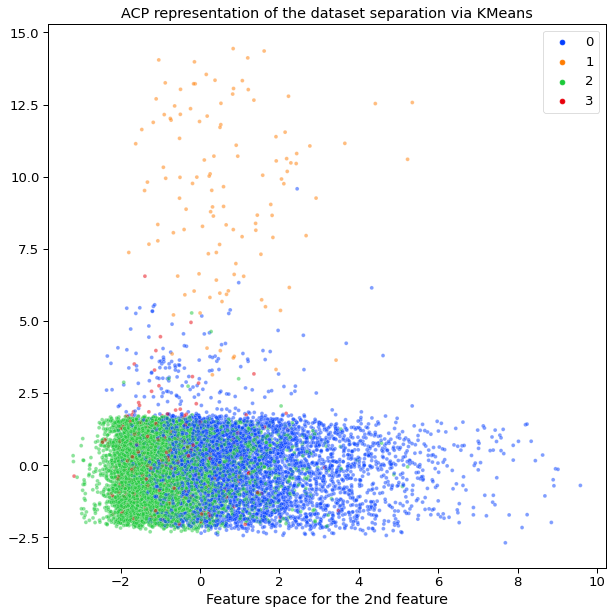

In [ ]:
# %%flake8

from matplotlib.patches import Circle

sns.set_context("paper", font_scale=1.5)
plt.figure(figsize=(10, 10))
plt.title("ACP representation of the dataset separation via KMeans")
plt.xlabel("Feature space for the 1st feature")
plt.xlabel("Feature space for the 2nd feature")
ax = plt.gca()

sns.scatterplot(
    x=a_show,  # composante 1 ACP
    y=b_show,  # composante 2 ACP
    hue=dict_hierarchic_sample1[4].labels_,
    alpha=0.5,
    s=15,
    legend="full",
    palette="bright",
)

In [ ]:
from sklearn.cluster import AgglomerativeClustering
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram

def get_distances(X,model,mode='l2'):
    distances = []
    weights = []
    children=model.children_
    dims = (X.shape[1],1)
    distCache = {}
    weightCache = {}
    for childs in children:
        c1 = X[childs[0]].reshape(dims)
        c2 = X[childs[1]].reshape(dims)
        c1Dist = 0
        c1W = 1
        c2Dist = 0
        c2W = 1
        if childs[0] in distCache.keys():
            c1Dist = distCache[childs[0]]
            c1W = weightCache[childs[0]]
        if childs[1] in distCache.keys():
            c2Dist = distCache[childs[1]]
            c2W = weightCache[childs[1]]
        d = np.linalg.norm(c1-c2)
        cc = ((c1W*c1)+(c2W*c2))/(c1W+c2W)

        X = np.vstack((X,cc.T))

        newChild_id = X.shape[0]-1

        # How to deal with a higher level cluster merge with lower distance:
        if mode=='l2':  # Increase the higher level cluster size suing an l2 norm
            added_dist = (c1Dist**2+c2Dist**2)**0.5 
            dNew = (d**2 + added_dist**2)**0.5
        elif mode == 'max':  # If the previrous clusters had higher distance, use that one
            dNew = max(d,c1Dist,c2Dist)
        elif mode == 'actual':  # Plot the actual distance.
            dNew = d


        wNew = (c1W + c2W)
        distCache[newChild_id] = dNew
        weightCache[newChild_id] = wNew

        distances.append(dNew)
        weights.append( wNew)
    return distances, weights

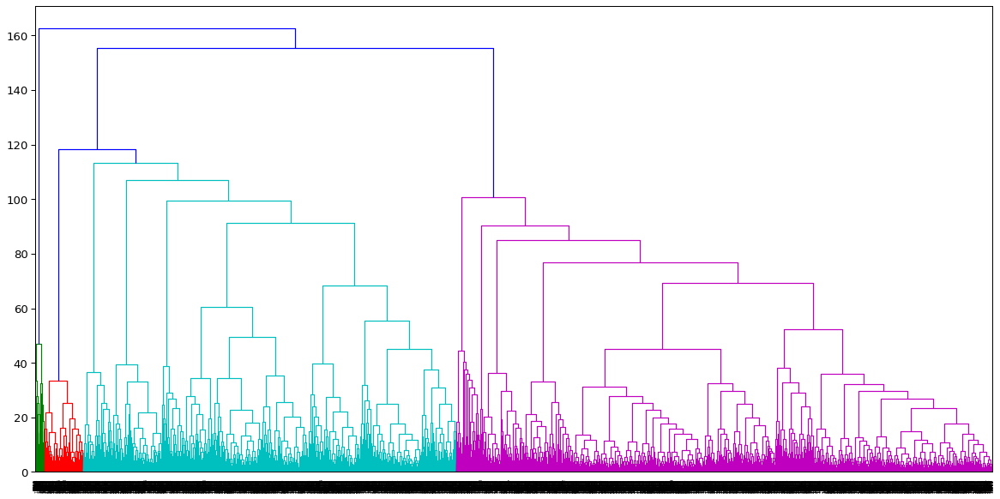

In [ ]:
model = AgglomerativeClustering(n_clusters=4,linkage="ward")
model.fit(X_pca.copy())
distance, weight = get_distances(X_pca.copy(),model)
linkage_matrix = np.column_stack([model.children_, distance, weight]).astype(float)
plt.figure(figsize=(20,10))
dendrogram(linkage_matrix)
plt.show()

## <font color='blue'> DBSCAN </font>

Based on a set of points, DBSCAN groups together points that are close to each other based on a distance measurement (usually Euclidean distance) and a minimum number of points. It also marks as outliers the points that are in low-density regions.

### <font color='violet'> Execution </font>

In [ ]:
dbs = DBSCAN(eps=0.5, min_samples=5).fit(X_pca.copy())

In [ ]:
# %%flake8
dbs_label = pd.DataFrame(dbs.labels_)
nb_cluster = list(set(dbs_label.nunique()))[0]
comparison_sample1 = comparison_sample1.append(
    pd.DataFrame(
        {
            "Modele": ["DBscan"],
            "nb_cluster": [nb_cluster],
            "min_Davies_Bouldin": [davies_bouldin_score(X_pca,
                                                    dbs.labels_)],
            "max_silhouette": [silhouette_score(X_pca,
                                            list(dbs.labels_))]
        }
    ),
    ignore_index=True,
)

In [ ]:
comparison_sample1

,Modele,nb_cluster,min_Davies_Bouldin,max_silhouette
0,Kmeans,4,1.679764,0.255669
1,hierarchical clustering,4,2.342708,0.121591
2,DBscan,68,1.885589,-0.441045


### <font color='violet'> Representation </font>

In [ ]:
tsne = TSNE(n_components=2, init="pca")
X_trans = tsne.fit_transform(X_pca)

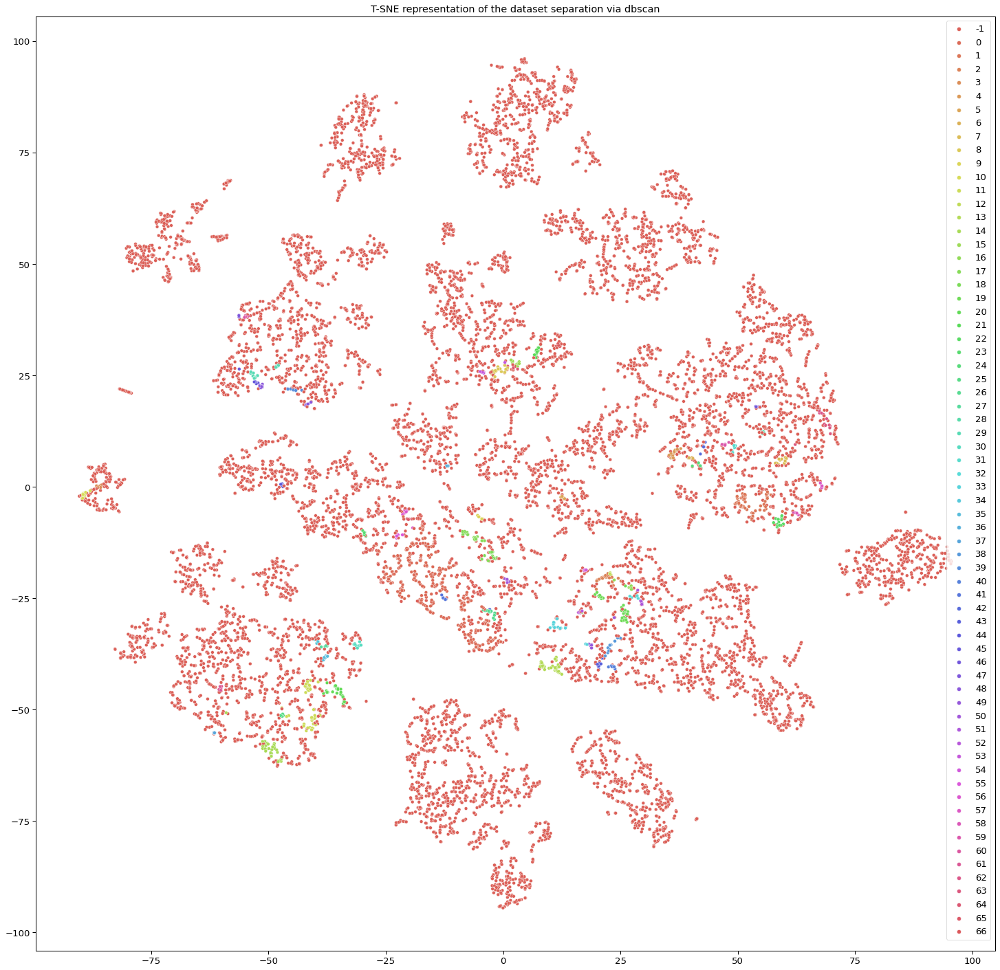

In [ ]:
# %%flake8
plt.figure(figsize=(25, 25))
plt.title("T-SNE representation of the dataset separation via dbscan")
sns.scatterplot(
    X_trans[:, 0],
    X_trans[:, 1],
    hue=dbs.labels_,
    legend="full",
    palette=sns.color_palette("hls", nb_cluster),
)
plt.show()

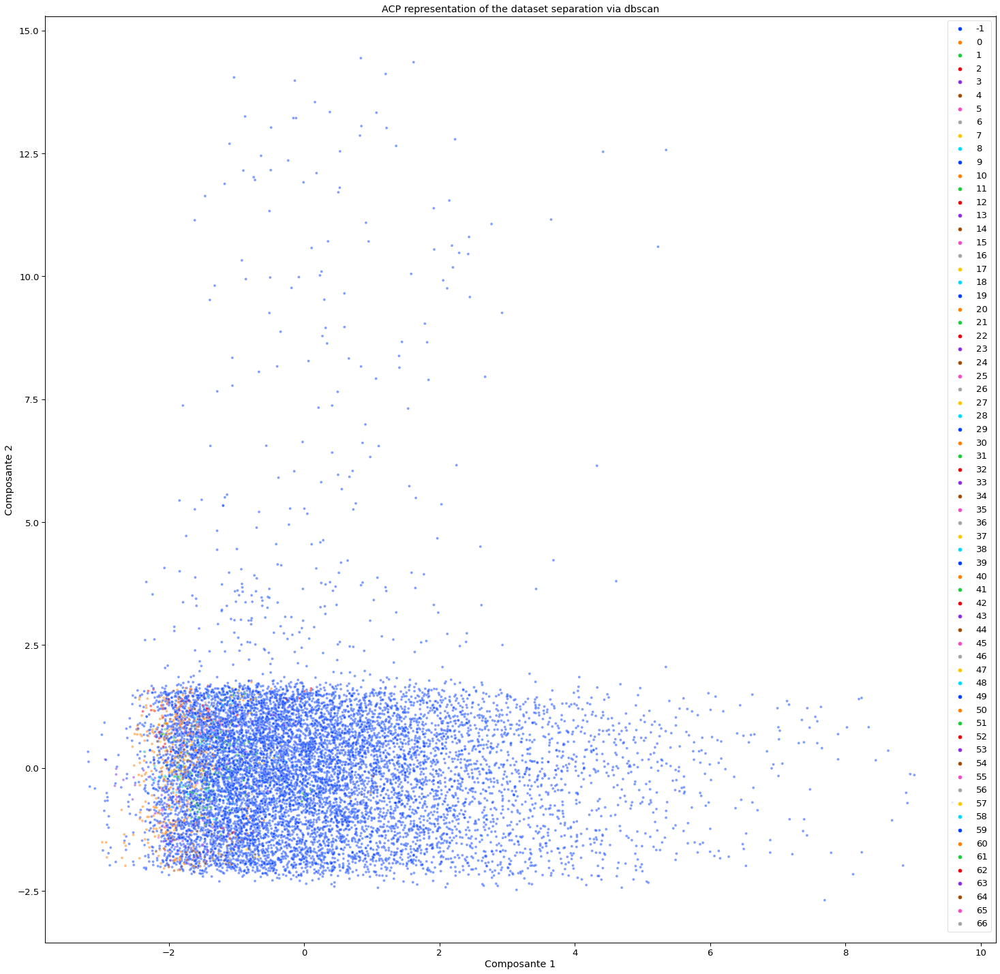

In [ ]:
# %%flake8

from matplotlib.patches import Circle

sns.set_context("paper", font_scale=1.5)
plt.figure(figsize=(25, 25))
plt.title("ACP representation of the dataset separation via dbscan")
plt.xlabel("Composante 1")
plt.ylabel("Composante 2")
ax = plt.gca()

sns.scatterplot(
    x=a_show,  # composante 1 ACP
    y=b_show,  # composante 2 ACP
    hue=dbs.labels_,
    alpha=0.5,
    s=15,
    legend="full",
    palette="bright",
)

# <font color='green'> Choice of the best clustering algorithm and of the number of clusters </font>

In [ ]:
comparison_sample1

,Modele,nb_cluster,min_Davies_Bouldin,max_silhouette
0,Kmeans,4,1.679764,0.255669
1,hierarchical clustering,4,2.342708,0.121591
2,DBscan,68,1.885589,-0.441045


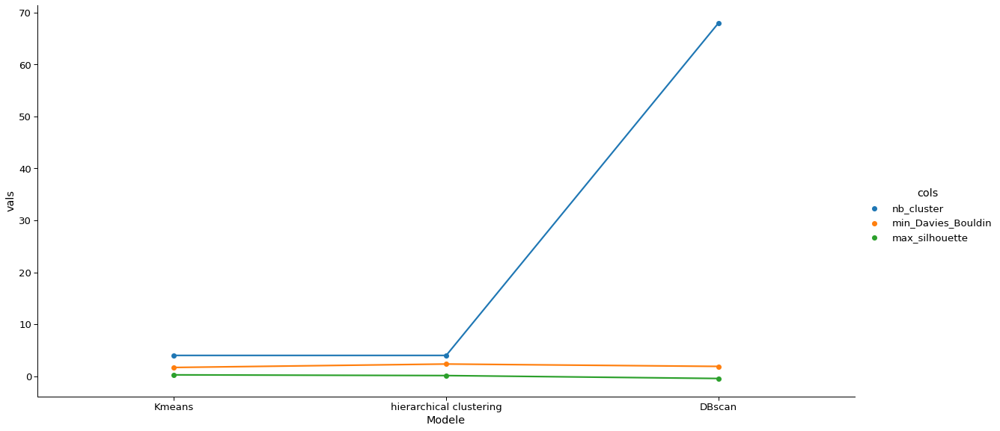

In [ ]:
df = comparison_sample1.melt('Modele', var_name='cols',  value_name='vals')
g = sns.factorplot(x="Modele", y="vals", hue='cols', data=df, height=8, aspect=2, kind='point') 

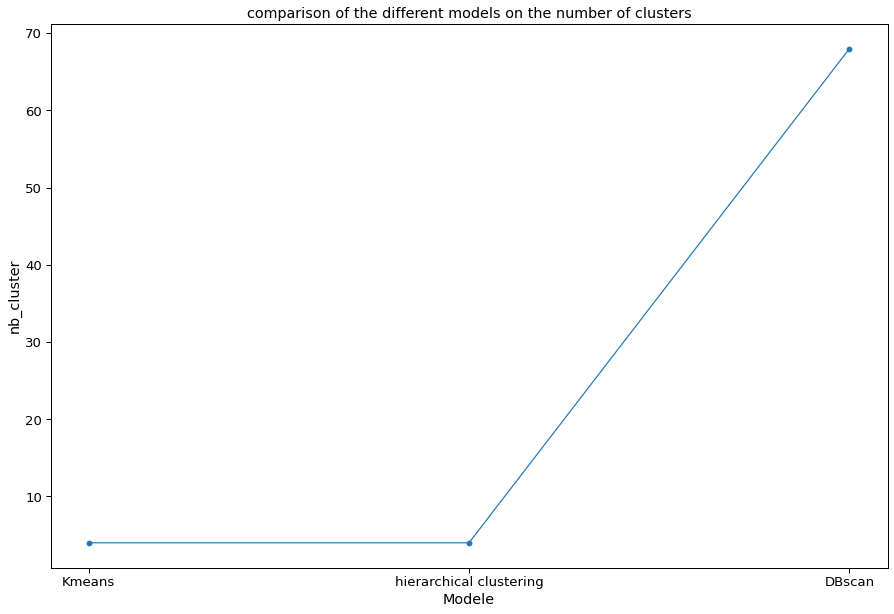

In [ ]:
plt.figure(figsize=(15, 10))
plt.plot(comparison_sample1['Modele'],
         comparison_sample1['nb_cluster'], linestyle='-', marker='o')
plt.title(
    "comparison of the different models on the number of clusters")
plt.xlabel("Modele")
plt.ylabel("nb_cluster")
plt.show()

Thanks to the comparative table of the different clustering methods, we can initially exclude the DBscan method from our choice of optimal algorithm for two reasons. First of all, with this algorithm, the number of clusters is 68, which is too high for marketing teams who want less than 10 clusters. Second, this algorithm gives us too many unit clusters.


The AgglomerativeClustering algorithm gives us 2 as the optimal number of clusters which is very small for segmentation.
I therefore decide to keep as the optimal algorithm for the rest of my analyses, the Kmeans algorithm which has an acceptable number of clusters (4): K-MEANS with 4 CLUSTERS.

# <font color='green'> Temporal Study (test but not retained for the continuation) </font>

In [ ]:
"""#Creation of new clusters after iterative addition of data over 3 months

frames = [sample_1strim, sample_2strim]
sample_6months = pd.concat(frames)

files = [
    sample_2strim,
    sample_3strim,
    sample_4strim,
    sample_5strim,
    sample_6strim,
    sample_7strim,
]

final_name = [
    "sample_6months",
    "sample_9months",
    "sample_12months",
    "sample_15months",
    "sample_18months",
    "sample_21months",
]

def calculation_new_clusters(basefile, files, final_name):
  This function does a clustering step for each addition of data. 
  At each addition of data, the clusters are recalculated, 
  there is a calculation of the silhouette coefficient and the Davies Bouldin
  index for each addition of data for future analysis.
  basefile : data for the first clustering
  files : list of dataframe add and calcul new clutering
  final_name : name of the summary table line 
  
  cluster_add_data = pd.DataFrame({})
  begin_file = basefile.copy()

  for i, df in enumerate(files):
      # dfs = []
      print("Concatenation with file in position {} in "
            "the list.".format(i))
      print(begin_file.shape)
      print(files[i].shape)
      a = files[i].copy()
      # if isinstance(a, pd.DataFrame):
      frames = [begin_file, a]
      study_file = pd.concat(frames)
      # dfs.append(a)
      # first = pd.concat(dfs,keys=files)   #.reset_index(level=1, drop=True)
      print(study_file.shape)
      # final_name[i]=first.copy()

      print(colored("\n PCA Transformation : Reduce "
                    "Dimensionality \n", 'green'))
      pca = PCA(n_components=study_file.shape[1], random_state=40)
      pca.fit_transform(study_file)

      X_study_file = pca.transform(study_file)[:, :18]
      a_show = pca.transform(study_file)[:, 0]  # Component 1
      b_show = pca.transform(study_file)[:, 1]  # Component 2
        
      #X_study_file = study_file
      print(colored("\n Model in progress ... \n", 'green'))

      nb_clusters = 3
      model = KMeans(n_clusters=nb_clusters, random_state=10, init='k-means++')
      X_study = model.fit(X_study_file.copy())  # fitting the base sample

      centroids =  model.cluster_centers_
      labels = model.labels_
      
      silou_kmean = silhouette_score(X_study_file.copy(), labels)
      #davies_bouldin_kmean = DaviesBouldin(X_study_file.copy(), labels)

      print(colored("\n Summary table in progress ... \n", 'green'))
      cluster_add_data = cluster_add_data.append(pd.DataFrame({
                        'Months_K-means': final_name[i],
                        'silhouette_clust_cal': silou_kmean},
                             index=[0]))

      print(colored("\n Representation \n", 'green'))
      f, (ax1, ax2) = plt.subplots(1, 2, sharey=True, figsize=(15, 10))
      ax1.scatter(sample_train.iloc[:, 0], sample_train.iloc[:, 1] c=labels_train["labels"]) #, s=10, edgecolors='none'
      ax1.scatter(centroids[:, 0], centroids[:, 1], c=cmap_model,
                  marker="x") #, s=150, linewidths=5, zorder=10
      ax2.set_title('Adding Data')
      ax2.scatter(study_file.iloc[:, 0], study_file.iloc[:, 1], c=labels["labels"]) #, s=10, edgecolors='none'
      ax2.scatter(centroids[:, 0], centroids[:, 1], c=cmap_model,
                  marker="x") #, s=150, linewidths=5, zorder=10
        
      plt.show()
      print("\n \n \n")

      begin_file = study_file


  return cluster_add_data

calculation_of_new_clusters = calculation_new_clusters(sample_1strim, files, final_name)
create_new_clustering = calculation_of_new_clusters.reset_index()
del create_new_clustering["index"]
create_new_clustering

plt.figure(figsize=(15, 10))
plt.plot(calculation_of_new_clusters_avecACP['Months_K-means'],
         calculation_of_new_clusters_avecACP['silhouette_clust_cal'], linestyle='-', marker='o')
plt.title(
    "Evolution of the silhouette coefficient for each cluster creation")
plt.xlabel("Months_K-means")
plt.ylabel("silhouette coefficient")
plt.show()






#Predict data's position in existed clusters
# %%flake8
def prediction_cluster_position(origin_data_cluster, name_data_model, files, final_name):
    
    This function computes a k-means clustering model from basic data. 
    The silhouette coefficient and the Davies Bouldin index is computed for
    this model. From this model and a list of datafraset to add to our basic
    model, a loop computes the silhouette coefficient and the Davies Bouldin
    index for each loop turn and thus for each data addition.
    origin_data_cluster : data to make the base model
    name_data_model : name to give to the created model
    files : list of dataframe containing the different data to be added at each loop
    final_name : name given in the summary table after adding each dataframe 
        
    print(colored("\n Model in progress ... \n", 'blue'))
    predict_new_data = pd.DataFrame({})

    pca = PCA(n_components=origin_data_cluster.shape[1], random_state=40)
    pca.fit_transform(origin_data_cluster)
    sample_train = pd.DataFrame(pca.transform(origin_data_cluster)[:, :18])

    #sample_train = origin_data_cluster
    nb_clusters = 3 
    model = KMeans(n_clusters=nb_clusters, random_state=10, init='k-means++') ## Kmeans model
    model.fit(sample_train) ## Fitting the training data     train = model.fit(sample_train) ## Fitting the training data

    labels_train = pd.DataFrame(model.labels_, columns=['labels'])
    centroids =  model.cluster_centers_

    silou_kmean = silhouette_score(sample_train.copy(), model.labels_)
    #davies_bouldin_kmean = davies_bouldin_score(sample_train.copy(), model.labels_)

    sample_train.reset_index(drop=True, inplace=True)
    labels_train.reset_index(drop=True, inplace=True)
    sample_train = pd.concat([sample_train, labels_train], axis=1)


    print(colored("\n Summary mode table in progress ... \n", 'green'))
    predict_new_data = predict_new_data.append(pd.DataFrame({
          'Months_K-means_predict': "model_6months",
          'nb_cluster': nb_clusters,
          'silhouette_clust_predict': silou_kmean},
          index=[0]))

    # Add months
    for i, df in enumerate(files):
      print(colored("\n Adding Data of the file in position {} in "
            "the list.\n ".format(i), 'blue'))
      model = load(name_data_model)# open the base model

      labels_train = pd.DataFrame(sample_train[sample_train.columns[-1]], columns=['labels'])
      del sample_train["labels"]
      print(sample_train.shape)

      print(colored("\n PCA adding data \n", 'green'))
      pca = PCA(n_components=files[i].shape[1], random_state=40)
      pca.fit_transform(files[i])
      sample_test = pd.DataFrame(pca.transform(files[i])[:, :18])

      #sample_test = files[i]
      print(sample_test.shape)

      print(colored("\n Prediction of new data\n", 'green'))

      labels_test = pd.DataFrame(model.predict(sample_test), columns=['labels']) # Predicting the test data
      study_file = pd.concat([sample_train, sample_test], axis=0)
      labels = pd.concat([labels_train, labels_test], axis=0)

      silou_kmean = silhouette_score(study_file.copy(), labels) #ou model_loaded.predict(sample) ou model avec train
      davies_bouldin_kmean = davies_bouldin_score(study_file.copy(), labels)

      print(colored("\n Summary table in progress ... \n", 'green'))
      predict_new_data = predict_new_data.append(pd.DataFrame({
          'Months_K-means_predict': final_name[i],
          'nb_cluster': nb_clusters,
          'silhouette_clust_predict': silou_kmean},
          index=[0]))
      
      sample_train = pd.concat([study_file, labels], axis=1)
      print(sample_train.shape)


      print(colored("\n Représentation \n", 'green'))
      cmap_model = np.array(['red', 'navy','purple'])

      f, (ax1, ax2) = plt.subplots(1, 2, sharey=True, figsize=(15, 10))
      ax1.scatter(sample_train.iloc[:, 0], sample_train.iloc[:, 1] c=labels_train["labels"]) #, s=10, edgecolors='none'
      ax1.scatter(centroids[:, 0], centroids[:, 1], c=cmap_model,
                  marker="x") #, s=150, linewidths=5, zorder=10
      ax2.set_title('Adding Data')
      ax2.scatter(study_file.iloc[:, 0], study_file.iloc[:, 1], c=labels["labels"]) #, s=10, edgecolors='none'
      ax2.scatter(centroids[:, 0], centroids[:, 1], c=cmap_model,
                  marker="x") #, s=150, linewidths=5, zorder=10
      plt.show()

      ERROR : (slice(None, None, None), 0)' is an invalid key
      
      
    return predict_new_data

comparison_adding_data_prediction = prediction_cluster_position(sample_6months, "model_sample_6months", files, final_name)

data_prediction = comparison_adding_data_prediction.reset_index()
del data_prediction["index"]
data_prediction

plt.figure(figsize=(15, 10))
plt.plot(comparison_adding_data_prediction_avecACP['Months_K-means_predict'],
         comparison_adding_data_prediction_avecACP['silhouette_clust_predict'], linestyle='-', marker='o')
plt.title(
    "Evolution of the silhouette coefficient for each cluster creation")
plt.xlabel("Months_K-means")
plt.ylabel("silhouette coefficient")
plt.show()

Now that we have the silouhette coefficient after recalculation of the different clusters and after prediction of the position of new data, we can compare them and determine after how long it is necessary to make an update.

silhouette_clust_predict = pd.DataFrame(data_prediction["silhouette_clust_predict"], columns=['silhouette_clust_predict'])
silhouette_clust_predict

#Comparison between calculate the clustering at each data addition and the prediction of the clustering of the added data
comparison_clustering_create_predict = pd.concat([create_new_clustering, silhouette_clust_predict], axis=1)
comparison_clustering_create_predict

del comparison_clustering_create_predict_avecACP['nb_cluster']
df = comparison_clustering_create_predict_avecACP.melt('Months_K-means', var_name='cols',  value_name='vals')
g = sns.factorplot(x="Months_K-means", y="vals", hue='cols', data=df, height=8, aspect=2, kind='point')  
#kind : {point, bar, count, box, violin, strip}

comparison_clustering_create_predict_avecACP["Diff_between_cal_pred"] = comparison_clustering_create_predict_avecACP["silhouette_clust_cal"] - comparison_clustering_create_predict_avecACP["silhouette_clust_predict"]
comparison_clustering_create_predict_avecACP"""

'#Creation of new clusters after iterative addition of data over 3 months\n\nframes = [sample_1strim, sample_2strim]\nsample_6months = pd.concat(frames)\n\nfiles = [\n    sample_2strim,\n    sample_3strim,\n    sample_4strim,\n    sample_5strim,\n    sample_6strim,\n    sample_7strim,\n]\n\nfinal_name = [\n    "sample_6months",\n    "sample_9months",\n    "sample_12months",\n    "sample_15months",\n    "sample_18months",\n    "sample_21months",\n]\n\ndef calculation_new_clusters(basefile, files, final_name):\n  This function does a clustering step for each addition of data. \n  At each addition of data, the clusters are recalculated, \n  there is a calculation of the silhouette coefficient and the Davies Bouldin\n  index for each addition of data for future analysis.\n  basefile : data for the first clustering\n  files : list of dataframe add and calcul new clutering\n  final_name : name of the summary table line \n  \n  cluster_add_data = pd.DataFrame({})\n  begin_file = basefile.copy

# <font color='green'> Temporal Study : Division of the dataset every three months</font>

In [ ]:
frames = [sample_1strim, sample_2strim]
sample_6months = pd.concat(frames)

In [ ]:
sample_6months.shape

(12005, 44)

In [ ]:
samples_to_add = [
    sample_3strim,
    sample_4strim,
    sample_5strim,
    sample_6strim,
    sample_7strim
]

months_name = [
    "sample_6months",
    "sample_9months",
    "sample_12months",
    "sample_15months",
    "sample_18months",
    "sample_21months",
]

In [ ]:
def cluster_prediction_update(cluster_v1, data_to_add, kmeans):
    new_data = data_to_add.copy()
    new_data["cluster"] = kmeans.predict(new_data)
    return pd.concat([cluster_v1,new_data])

def cluster_calculation_update(cluster_v2, data_to_add, nb_clusters):
    kmeans = KMeans(n_clusters=nb_clusters, random_state=10, init='k-means++')
    cluster_v2 = pd.concat([cluster_v2.iloc[:,:-1], data_to_add])
    kmeans.fit(cluster_v2)
    cluster_v2["cluster"] = kmeans.labels_
    return cluster_v2

In [ ]:
def temporal_study(baseline_data, nb_clusters, samples_to_add, months_name):
  #v1 sera la version ou on garde les clusters précalculés, v2 on les recalcule
  # deux dataframe avec les mêmes données sauf que 1 détermination clusters par calcul et l'autre par prédiction
  """at the beginning the dataframes are the same for the calculation of the
  basic model then we will add the added data as well as their labels which
  are predicted on one side and calculated on the other."""

  print(baseline_data.shape)
  print(colored("\n PCA Transformation : Reduce "
                "Dimensionality ... \n", 'green'))
  pca = PCA(n_components=baseline_data.shape[1], random_state=40)
  pca.fit_transform(baseline_data)
  X_baseline_data = pd.DataFrame(pca.transform(baseline_data)[:, :18])


  determination_cluster_prediction = X_baseline_data.copy()  #cluster_v1
  determination_cluster_calculation = X_baseline_data.copy()  #cluster_v2

  print(colored("\n Model in progress ... \n", 'green'))
  model = KMeans(n_clusters=nb_clusters, random_state=10, init='k-means++')
  model.fit(X_baseline_data)
  determination_cluster_prediction["cluster"] = model.labels_



  determination_cluster_calculation["cluster"] = model.labels_
  silhouette_cluster_prediction = []
  silhouette_cluster_calculation = []


  print(colored("\n Calculation of silouhette coefficients ... \n", 'green'))
  silhouette_cluster_prediction.append(silhouette_score(determination_cluster_prediction.iloc[:,:-1], determination_cluster_prediction["cluster"]))
  silhouette_cluster_calculation.append(silhouette_score(determination_cluster_calculation.iloc[:,:-1], determination_cluster_calculation["cluster"]))


  for i, dataset in enumerate(samples_to_add):
      print(colored("\n Adding Data of the file in position {} in "
                    "the list.\n ".format(i), 'blue'))
      
      print(colored("\n PCA Transformation : Reduce "
                    "Dimensionality ... \n", 'green'))
      pca = PCA(n_components=dataset.shape[1], random_state=40)
      pca.fit_transform(dataset)
      dataset = pd.DataFrame(pca.transform(dataset)[:, :18])
      print(len(determination_cluster_prediction))

      print(colored("\n Prediction of clusters for new data\n", 'red'))
      determination_cluster_prediction = cluster_prediction_update(determination_cluster_prediction, dataset, model)
      print(len(determination_cluster_prediction))



      silhouette_cluster_prediction.append(silhouette_score(determination_cluster_prediction.iloc[:,:-1], determination_cluster_prediction["cluster"]))

      print(len(determination_cluster_calculation))
      print(colored("\n Calculation of clusters for new data\n", 'red'))
      determination_cluster_calculation = cluster_calculation_update(determination_cluster_calculation, dataset, nb_clusters)
      print(len(determination_cluster_calculation))
      silhouette_cluster_calculation.append(silhouette_score(determination_cluster_calculation.iloc[:,:-1], determination_cluster_calculation["cluster"]))
      # Cluster v1 et v2 s'agrandisse au fur et à mesure avec les nouveaux mois et avec leurs valeurs de clustering


  print(colored("\n Summary table in progress ... \n", 'blue'))
  dataframe = pd.DataFrame({
      'Months_K-means':months_name,
      'silhouette_cluster_prediction':silhouette_cluster_prediction,
      'silhouette_cluster_calculation':silhouette_cluster_calculation})

  return dataframe

In [ ]:
temporal_study_prediction_calculation = temporal_study(sample_6months, 4, samples_to_add, months_name)

(12005, 44)

 PCA Transformation : Reduce Dimensionality ... 


 Model in progress ... 


 Calculation of silouhette coefficients ... 


 Adding Data of the file in position 0 in the list.
 

 PCA Transformation : Reduce Dimensionality ... 

12005

 Prediction of clusters for new data

23009
12005

 Calculation of clusters for new data

23009

 Adding Data of the file in position 1 in the list.
 

 PCA Transformation : Reduce Dimensionality ... 

23009

 Prediction of clusters for new data

38649
23009

 Calculation of clusters for new data

38649

 Adding Data of the file in position 2 in the list.
 

 PCA Transformation : Reduce Dimensionality ... 

38649

 Prediction of clusters for new data

57331
38649

 Calculation of clusters for new data

57331

 Adding Data of the file in position 3 in the list.
 

 PCA Transformation : Reduce Dimensionality ... 

57331

 Prediction of clusters for new data

74824
57331

 Calculation of clusters for new data

74824

 Adding Data of the file in

In [ ]:
temporal_study_prediction_calculation

,Months_K-means,silhouette_cluster_prediction,silhouette_cluster_calculation
0,sample_6months,0.255669,0.255669
1,sample_9months,0.249140,0.242479
2,sample_12months,0.248577,0.238868
3,sample_15months,0.247453,0.238630
4,sample_18months,0.243383,0.057971
5,sample_21months,0.242259,0.057819


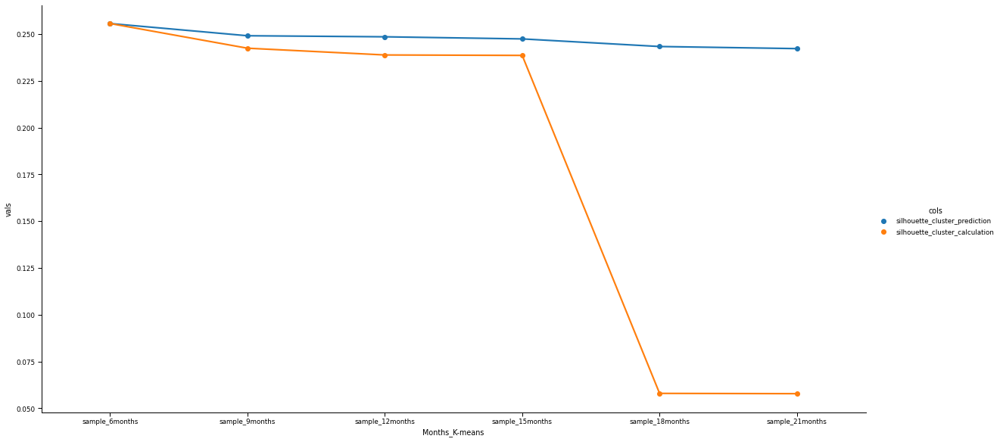

In [ ]:
df = temporal_study_prediction_calculation.melt('Months_K-means', var_name='cols',  value_name='vals')
g = sns.factorplot(x="Months_K-means", y="vals", hue='cols', data=df, height=8, aspect=2, kind='point')  
#kind : {point, bar, count, box, violin, strip}

With this graph, we can see that from month 18, there is a very big difference between the calculated and the predicted silouhette coefficient. This result allows us to hypothesize that an update of the number of clusters should be done every 12 months so every year.

# <font color='green'> K-means on the whole file</font>


## <font color='blue'> Preparation of complete dataset </font>

In [ ]:
# %%flake8
from google.colab import drive
drive.mount('/content/drive')

%cd /content/drive/My\ Drive/Data_projet_OC
!ls

data = pd.read_csv('/content/drive/MyDrive/Data_projet_OC/'
                   'bd_olist_finale.csv')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive/Data_projet_OC
bd_olist_finale.csv  tot_data_label.csv


In [ ]:
"""# %%flake8
data = pd.read_csv(
    "/Users/amandinelecerfdefer/Desktop/"
    "Formation_Data_Scientist_OC/WORK-projet5/csv_produits/"
    "bd_olist_finale.csv"
)"""

'# %%flake8\ndata = pd.read_csv(\n    "/Users/amandinelecerfdefer/Desktop/"\n    "Formation_Data_Scientist_OC/WORK-projet5/csv_produits/"\n    "bd_olist_finale.csv"\n)'

In [ ]:
del data["customer_unique_id"]
data

,customer_region,number_order,distance_between_seller_customer,date_last_order,mean_days_between_orders,mean_item_per_order,mean_volume_item_ordered,date_first_order,mean_product_price,mean_freight_value,mean_order_value,mean_review_score,mean_payment_sequential,mean_payment_installment,most_payment_used,category_most_purchased,price_for_Office_equipment_furniture,price_for_clothing_accessories,price_for_electronic_equipment,price_for_food_drink,price_for_furniture_decoration_home,price_for_garden_pets,price_for_home_appliances,price_for_hygiene_health_wellness,price_for_leisure_homemade,price_for_other,price_for_repairs_constructions
0,Southeast,1.0,3.160256,736465.0,0.0,1.0,107136.0,736465.0,124.99,21.88,146.87,4.0,1.0,2.0,credit_card,Office_equipment_furniture,124.99,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0
1,Southeast,1.0,3.831877,736706.0,0.0,1.0,53400.0,736706.0,289.00,46.48,335.48,5.0,1.0,8.0,credit_card,home_appliances,0.00,0.0,0.0,0.0,0.0,0.0,289.0,0.00,0.0,0.0,0.0
2,Southeast,1.0,0.293126,736833.0,0.0,1.0,45968.0,736833.0,139.94,17.79,157.73,5.0,1.0,7.0,credit_card,Office_equipment_furniture,139.94,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0
3,Southeast,1.0,0.181996,736766.0,0.0,1.0,79968.0,736766.0,149.94,23.36,173.30,5.0,1.0,1.0,credit_card,Office_equipment_furniture,149.94,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0
4,Southeast,1.0,2.080467,736904.0,0.0,1.0,23625.0,736904.0,230.00,22.25,252.25,5.0,1.0,8.0,credit_card,furniture_decoration_home,0.00,0.0,0.0,0.0,230.0,0.0,0.0,0.00,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85403,Southeast,1.0,3.984376,736680.0,0.0,1.0,26496.0,736680.0,55.00,20.88,75.88,1.0,1.0,1.0,credit_card,home_appliances,0.00,0.0,0.0,0.0,0.0,0.0,55.0,0.00,0.0,0.0,0.0
85404,Southeast,1.0,3.445074,736791.0,0.0,1.0,11132.0,736791.0,74.90,13.88,88.78,4.0,1.0,6.0,credit_card,leisure_homemade,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,74.9,0.0,0.0
85405,Southeast,1.0,2.322013,736788.0,0.0,1.0,13200.0,736788.0,114.90,14.16,129.06,5.0,1.0,3.0,credit_card,leisure_homemade,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,114.9,0.0,0.0
85406,Northeast,1.0,21.390305,736792.0,0.0,1.0,9000.0,736792.0,37.00,19.04,56.04,1.0,1.0,5.0,credit_card,hygiene_health_wellness,0.00,0.0,0.0,0.0,0.0,0.0,0.0,37.00,0.0,0.0,0.0


Digital data standardization and One Hot Encoding of the dataset _.

 Digital data standardization : 

Normalization is necessary for our data because the data are not of the same order.
We transform the distribution of the data in order to have the mean at 0 and the standard deviation at 1.
 

Figure(1440x1080)


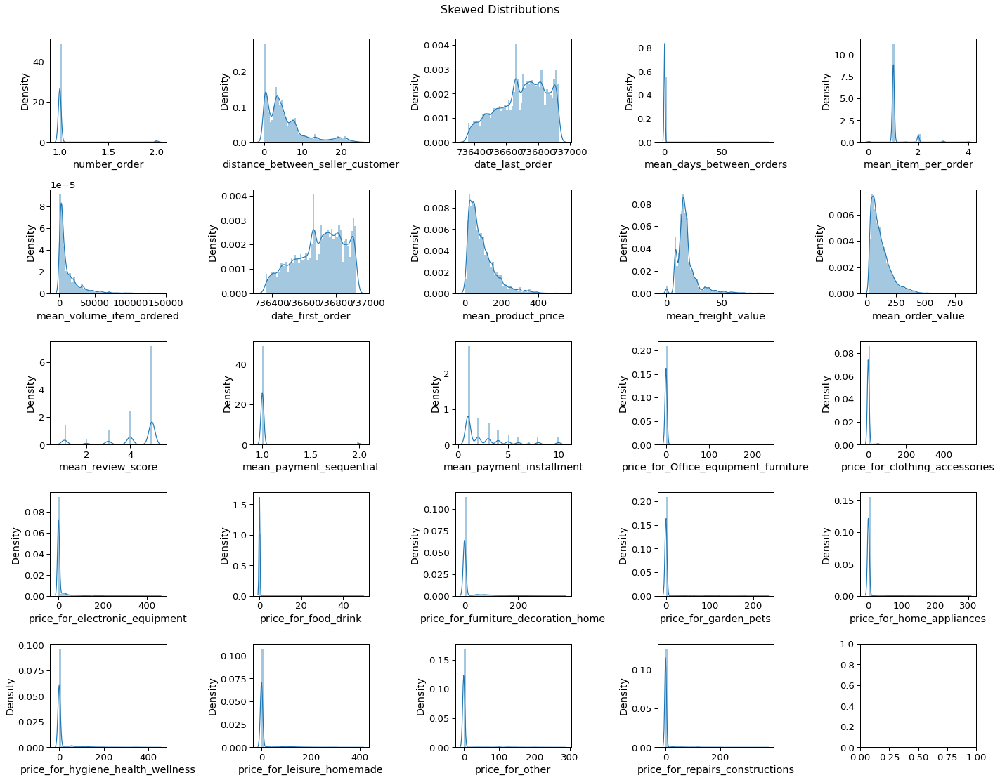


 

Statistical measures for the variable number_order
The mean of the variable number_order is : 0.0 
The standard deviation of the variable number_order is : 1.0 

 

Statistical measures for the variable distance_between_seller_customer
The mean of the variable distance_between_seller_customer is : 0.0 
The standard deviation of the variable distance_between_seller_customer is : 1.0 

 

Statistical measures for the variable date_last_order
The mean of the variable date_last_order is : 0.0 
The standard deviation of the variable date_last_order is : 1.0 

 

Statistical measures for the variable mean_days_between_orders
The mean of the variable mean_days_between_orders is : 0.0 
The standard deviation of the variable mean_days_between_orders is : 1.0 

 

Statistical measures for the variable mean_item_per_order
The mean of the variable mean_item_per_order is : 0.0 
The standard deviation of the variable mean_item_per_order is : 1.0 

 

Statistical measures for the variable mean_vo

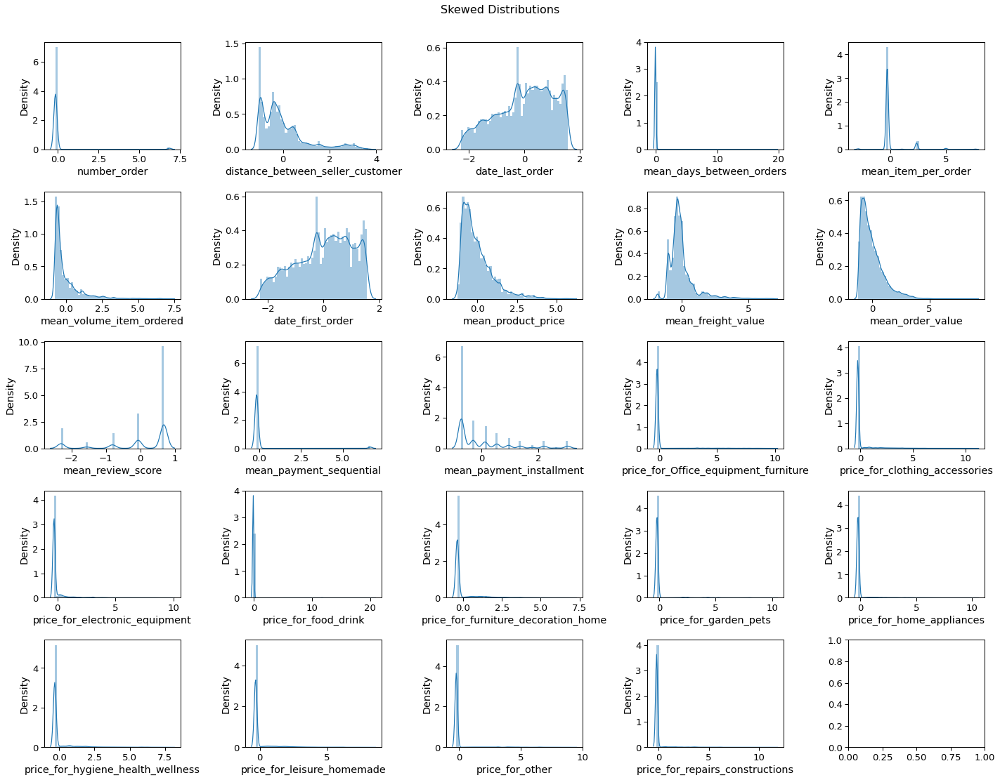


 
 Dummy variable : one-hot encoding by the method get_dummies
(85408, 3)
20 total features after one-hot encoding.

 Final Dataset
Le jeu de données a 85408 lignes et 44 colonnes.
There is no missing data 
 
 
 
 


In [ ]:
# %%flake8
X_tot = standartization_encodage(data)

In [ ]:
X_tot

,number_order,distance_between_seller_customer,date_last_order,mean_days_between_orders,mean_item_per_order,mean_volume_item_ordered,date_first_order,mean_product_price,mean_freight_value,mean_order_value,mean_review_score,mean_payment_sequential,mean_payment_installment,price_for_Office_equipment_furniture,price_for_clothing_accessories,price_for_electronic_equipment,price_for_food_drink,price_for_furniture_decoration_home,price_for_garden_pets,price_for_home_appliances,price_for_hygiene_health_wellness,price_for_leisure_homemade,price_for_other,price_for_repairs_constructions,customer_region_Central,customer_region_North,customer_region_Northeast,customer_region_South,customer_region_Southeast,most_payment_used_boleto,most_payment_used_credit_card,most_payment_used_debit_card,most_payment_used_voucher,category_most_purchased_Office_equipment_furniture,category_most_purchased_clothing_accessories,category_most_purchased_electronic_equipment,category_most_purchased_food_drink,category_most_purchased_furniture_decoration_home,category_most_purchased_garden_pets,category_most_purchased_home_appliances,category_most_purchased_hygiene_health_wellness,category_most_purchased_leisure_homemade,category_most_purchased_other,category_most_purchased_repairs_constructions
0,-0.146186,-0.427934,-1.568969,-0.089402,-0.259014,5.433433,-1.562744,0.443478,0.349839,0.334990,-0.061936,-0.150432,-0.287272,5.314911,-0.252053,-0.295207,-0.068521,-0.374256,-0.202958,-0.224915,-0.321278,-0.315386,-0.204202,-0.200112,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0
1,-0.146186,-0.297857,0.057709,-0.089402,-0.259014,2.331023,0.063181,2.693058,2.748104,2.614334,0.683450,-0.150432,2.194302,-0.178915,-0.252053,-0.295207,-0.068521,-0.374256,-0.202958,9.904428,-0.321278,-0.315386,-0.204202,-0.200112,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
2,-0.146186,-0.983229,0.914921,-0.089402,-0.259014,1.901942,0.919996,0.648534,-0.048897,0.466233,0.683450,-0.150432,1.780707,5.972026,-0.252053,-0.295207,-0.068521,-0.374256,-0.202958,-0.224915,-0.321278,-0.315386,-0.204202,-0.200112,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0
3,-0.146186,-1.004752,0.462691,-0.089402,-0.259014,3.864908,0.467976,0.785695,0.494125,0.654396,0.683450,-0.150432,-0.700868,6.411567,-0.252053,-0.295207,-0.068521,-0.374256,-0.202958,-0.224915,-0.321278,-0.315386,-0.204202,-0.200112,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0
4,-0.146186,-0.637064,1.394150,-0.089402,-0.259014,0.611985,1.399003,1.883807,0.385910,1.608503,0.683450,-0.150432,2.194302,-0.178915,-0.252053,-0.295207,-0.068521,4.288525,-0.202958,-0.224915,-0.321278,-0.315386,-0.204202,-0.200112,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85403,-0.146186,-0.268322,-0.117783,-0.089402,-0.259014,0.777740,-0.112230,-0.516512,0.252348,-0.522921,-2.298095,-0.150432,-0.700868,-0.178915,-0.252053,-0.295207,-0.068521,-0.374256,-0.202958,1.702815,-0.321278,-0.315386,-0.204202,-0.200112,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
85404,-0.146186,-0.372772,0.631434,-0.089402,-0.259014,-0.109290,0.636640,-0.243562,-0.430085,-0.367025,-0.061936,-0.150432,1.367111,-0.178915,-0.252053,-0.295207,-0.068521,-0.374256,-0.202958,-0.224915,-0.321278,1.296066,-0.204202,-0.200112,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
85405,-0.146186,-0.590282,0.611185,-0.089402,-0.259014,0.010105,0.616400,0.305083,-0.402787,0.119757,0.683450,-0.150432,0.126324,-0.178915,-0.252053,-0.295207,-0.068521,-0.374256,-0.202958,-0.224915,-0.321278,2.156655,-0.204202,-0.200112,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
85406,-0.146186,3.102792,0.638183,-0.089402,-0.259014,-0.232380,0.643387,-0.763402,0.072966,-0.762686,-2.298095,-0.150432,0.953515,-0.178915,-0.252053,-0.295207,-0.068521,-0.374256,-0.202958,-0.224915,0.368545,-0.315386,-0.204202,-0.200112,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0


In [ ]:
pca_tot = PCA(n_components=X_tot.shape[1], random_state=40)

In [ ]:
pca_tot.fit(X_tot)

PCA(n_components=44, random_state=40)

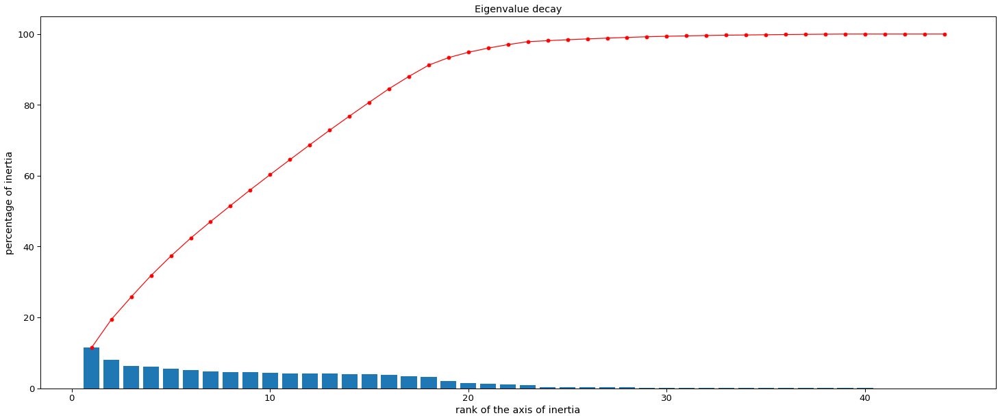

In [ ]:
plt.figure(figsize=(25, 10))
display_scree_plot(pca_tot)

In [ ]:
np.cumsum(pca_tot.explained_variance_ratio_)[18]

0.9334109915008151

With 19 features we have 94 % of the total variance.

In [ ]:
X_pca_tot = pca_tot.transform(X_tot)[:,:18]

In [ ]:
colonnes_pca = X_tot.columns

## <font color='blue'> Representation of data </font>

In [ ]:
x_show = pca_tot.transform(X_tot)[:,0]
y_show = pca_tot.transform(X_tot)[:,1]

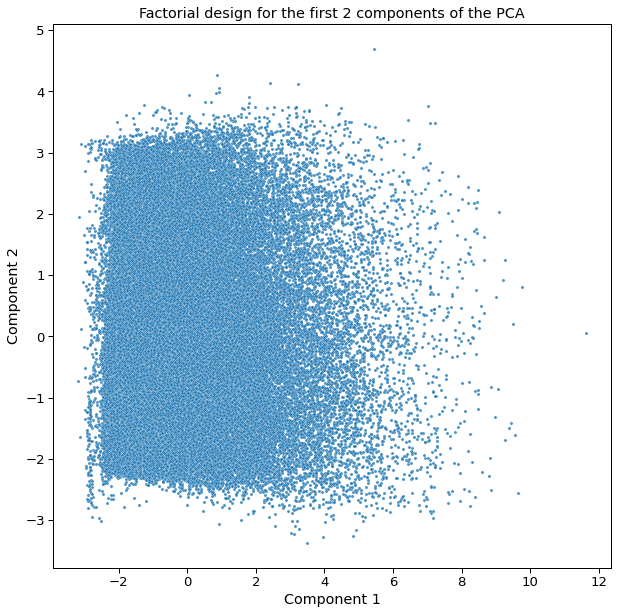

In [ ]:
#%%flake8
sns.set_context("paper", font_scale=1.5)
plt.figure(figsize=(10, 10))
chaine = "Factorial design for the first 2 components of the PCA"
plt.title(chaine)
plt.xlabel("Component 1")
plt.ylabel("Component 2")
ax = plt.gca()

sns.scatterplot(x=x_show, y=y_show, alpha=0.8, s=10)

sns.set_context("paper", font_scale=1)

In [ ]:
x_show

array([ 2.19196125,  5.40353443,  1.75194587, ..., -0.01519266,
        0.02132244, -2.36215498])

In [ ]:
# %%flake8
tsne = TSNE(n_components=2, init="pca")
X_trans = tsne.fit_transform(X_pca_tot.copy())

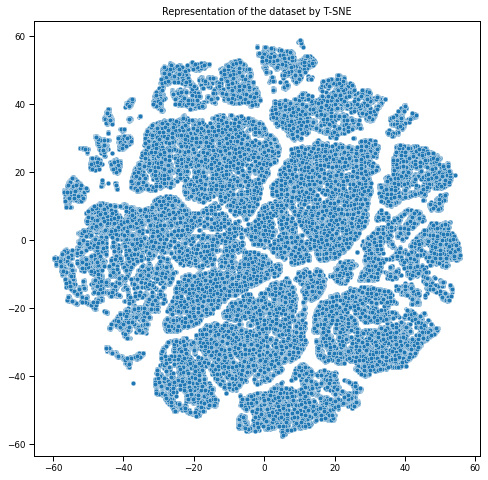

In [ ]:
# %%flake8
plt.figure(figsize=(8, 8))
plt.title("Representation of the dataset by T-SNE")
sns.scatterplot(X_trans[:, 0], X_trans[:, 1])

## <font color='blue'> K-means </font>

KMeans model with the optimal number of clusters identified on the reduced data set

In [ ]:
model = KMeans(n_clusters=4, random_state=10, init='k-means++').fit(X_pca_tot)

In [ ]:
model.labels_.shape

(85408,)

In [ ]:
mylist = model.labels_
mylist = list(set(mylist))
mylist

[0, 1, 2, 3]

In [ ]:
silhouette_score(X = X_pca_tot, labels= model.labels_)

0.21429469963208184

In [ ]:
labels = pd.DataFrame(model.labels_, columns=['label'])

In [ ]:
labels["label"].unique()

array([2, 1, 3, 0], dtype=int32)

Creation of a new dataframe composed of the dataframe with all the data associated to their clusters determined by Kmeans (4 clusters).

In [ ]:
tot_data_label = pd.concat([labels, data], axis=1)

In [ ]:
tot_data_label

,label,customer_region,number_order,distance_between_seller_customer,date_last_order,mean_days_between_orders,mean_item_per_order,mean_volume_item_ordered,date_first_order,mean_product_price,mean_freight_value,mean_order_value,mean_review_score,mean_payment_sequential,mean_payment_installment,most_payment_used,category_most_purchased,price_for_Office_equipment_furniture,price_for_clothing_accessories,price_for_electronic_equipment,price_for_food_drink,price_for_furniture_decoration_home,price_for_garden_pets,price_for_home_appliances,price_for_hygiene_health_wellness,price_for_leisure_homemade,price_for_other,price_for_repairs_constructions
0,2,Southeast,1.0,3.160256,736465.0,0.0,1.0,107136.0,736465.0,124.99,21.88,146.87,4.0,1.0,2.0,credit_card,Office_equipment_furniture,124.99,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0
1,2,Southeast,1.0,3.831877,736706.0,0.0,1.0,53400.0,736706.0,289.00,46.48,335.48,5.0,1.0,8.0,credit_card,home_appliances,0.00,0.0,0.0,0.0,0.0,0.0,289.0,0.00,0.0,0.0,0.0
2,2,Southeast,1.0,0.293126,736833.0,0.0,1.0,45968.0,736833.0,139.94,17.79,157.73,5.0,1.0,7.0,credit_card,Office_equipment_furniture,139.94,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0
3,2,Southeast,1.0,0.181996,736766.0,0.0,1.0,79968.0,736766.0,149.94,23.36,173.30,5.0,1.0,1.0,credit_card,Office_equipment_furniture,149.94,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0
4,2,Southeast,1.0,2.080467,736904.0,0.0,1.0,23625.0,736904.0,230.00,22.25,252.25,5.0,1.0,8.0,credit_card,furniture_decoration_home,0.00,0.0,0.0,0.0,230.0,0.0,0.0,0.00,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85403,3,Southeast,1.0,3.984376,736680.0,0.0,1.0,26496.0,736680.0,55.00,20.88,75.88,1.0,1.0,1.0,credit_card,home_appliances,0.00,0.0,0.0,0.0,0.0,0.0,55.0,0.00,0.0,0.0,0.0
85404,3,Southeast,1.0,3.445074,736791.0,0.0,1.0,11132.0,736791.0,74.90,13.88,88.78,4.0,1.0,6.0,credit_card,leisure_homemade,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,74.9,0.0,0.0
85405,3,Southeast,1.0,2.322013,736788.0,0.0,1.0,13200.0,736788.0,114.90,14.16,129.06,5.0,1.0,3.0,credit_card,leisure_homemade,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,114.9,0.0,0.0
85406,3,Northeast,1.0,21.390305,736792.0,0.0,1.0,9000.0,736792.0,37.00,19.04,56.04,1.0,1.0,5.0,credit_card,hygiene_health_wellness,0.00,0.0,0.0,0.0,0.0,0.0,0.0,37.00,0.0,0.0,0.0


In [ ]:
# %%flake8
tsne = TSNE(n_components=2, init="pca")
X_trans = tsne.fit_transform(X_pca_tot)

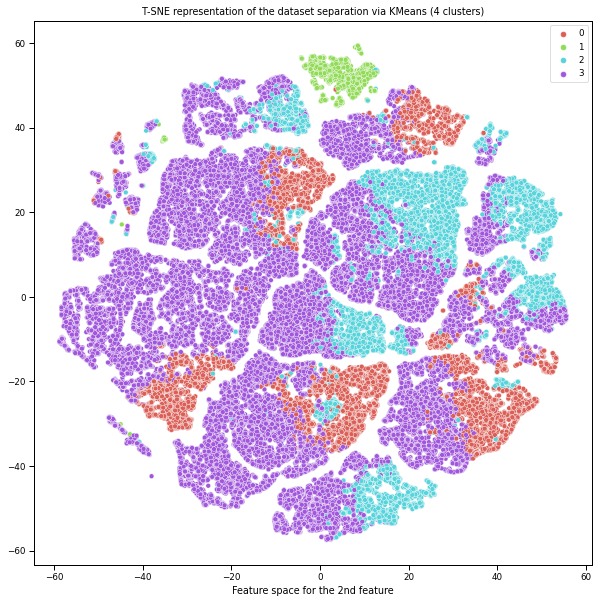

In [ ]:
# %%flake8
nb_clusters = 4

plt.figure(figsize=(10, 10)) 
plt.title("T-SNE representation of the dataset separation via "
          "KMeans (4 clusters)")
sns.scatterplot(
    X_trans[:, 0],
    X_trans[:, 1],
    hue=model.labels_,
    legend="full",
    palette=sns.color_palette("hls", 4),  #
    
)
plt.xlabel("Feature space for the 1st feature")
plt.xlabel("Feature space for the 2nd feature")
plt.show()

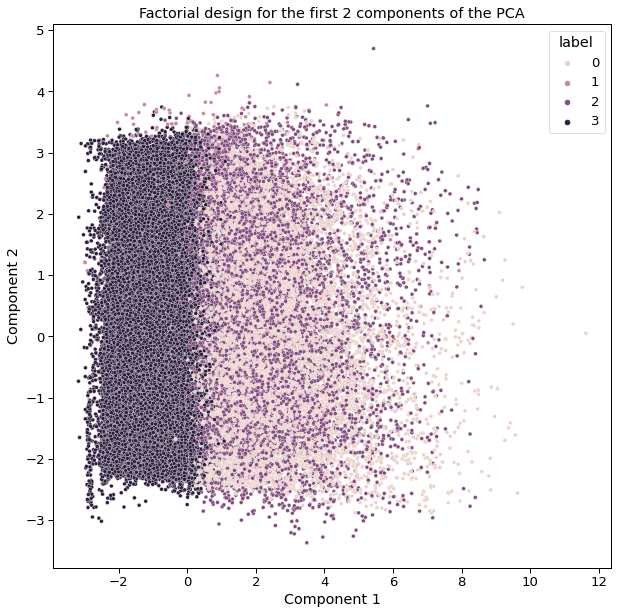

In [ ]:
sns.set_context("paper", font_scale=1.5) 
plt.figure(figsize=(10,10))
chaine = "Factorial design for the first 2 components of the PCA"
plt.title(chaine)
plt.xlabel('Component 1')
plt.ylabel('Component 2')
ax = plt.gca()

sns.scatterplot(x = x_show, 
                y = y_show, 
                hue = tot_data_label["label"],
                alpha=1, s=15, legend='full')

sns.set_context("paper", font_scale=1)

In [ ]:
# %%flake8
# sur google colab
from google.colab import drive
drive.mount('/content/drive/')
tot_data_label.to_csv('tot_data_label.csv', index=False)
!cp tot_data_label.csv /content/drive/My\ Drive/

"""# %%flake8
tot_data_label.to_csv(
    "csv_produits/tot_data_label.csv", index=False
)"""

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


'# %%flake8\ntot_data_label.to_csv(\n    "csv_produits/tot_data_label.csv", index=False\n)'

# <font color='green'> Analysis of clusters created on the whole file</font>


## <font color='blue'> General Observation</font>


In [ ]:
# %%flake8
from google.colab import drive
drive.mount('/content/drive')

%cd /content/drive/My\ Drive/Data_projet_OC
!ls

tot_data_label = pd.read_csv('/content/drive/MyDrive/Data_projet_OC/'
                   'tot_data_label.csv')

"""# %%flake8
tot_data_label = pd.read_csv(
    "/Users/amandinelecerfdefer/Desktop/"
    "Formation_Data_Scientist_OC/WORK-projet5/csv_produits/"
    "tot_data_label.csv"
)"""

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive/Data_projet_OC
bd_olist_finale.csv  tot_data_label.csv


'# %%flake8\ntot_data_label = pd.read_csv(\n    "/Users/amandinelecerfdefer/Desktop/"\n    "Formation_Data_Scientist_OC/WORK-projet5/csv_produits/"\n    "tot_data_label.csv"\n)'

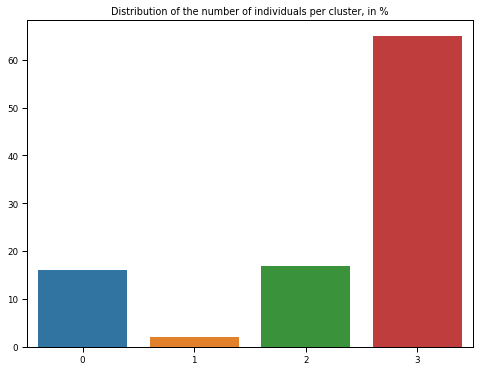

In [ ]:
# %%flake8
df = tot_data_label
plt.figure(figsize=(8, 6))
plt.title('Distribution of the number of individuals per cluster, in %')
sns.barplot(x=df['label'].value_counts().index,
            y=(df['label'].value_counts().values)/len(df)*100)

In [ ]:
# %%flake8
list_clust = tot_data_label['label'].value_counts().index
lst_nb = tot_data_label['label'].value_counts().values
dict_clust = dict(zip(list_clust, lst_nb))
# Iterate over key/value pairs in dict and print them
for key, value in dict_clust.items():
    print('cluster {} : {} clients'.format(key, value))
print('Sur un total de {} clients'.format(len(tot_data_label)))

cluster 3 : 55530 clients
cluster 2 : 14417 clients
cluster 0 : 13691 clients
cluster 1 : 1770 clients
Sur un total de 85408 clients


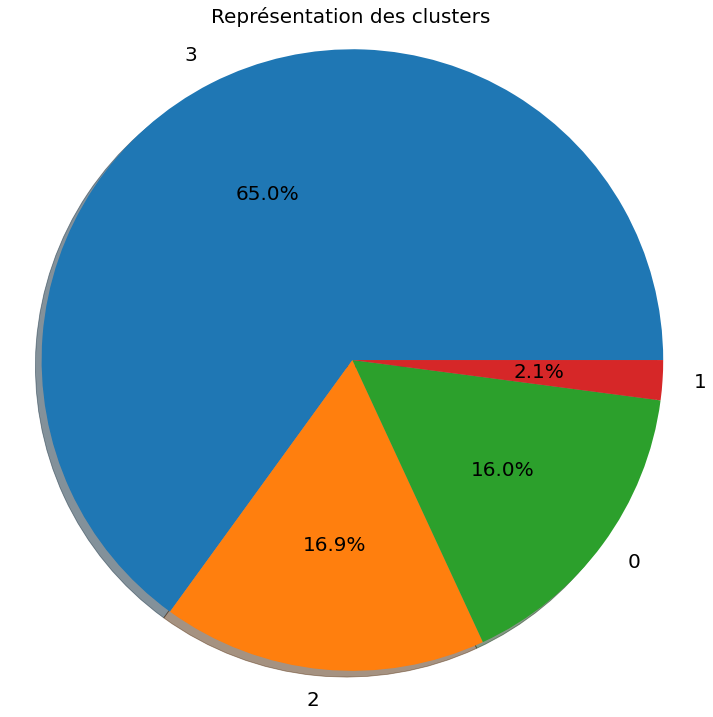

In [ ]:
# %%flake8
values = (tot_data_label['label'].value_counts()/len(tot_data_label)*100)
labels = tot_data_label['label'].value_counts().index
# Plot
plt.figure(figsize=(10,10))
plt.title("Representation des clusters", fontsize=20)
plt.pie(values, labels=labels,
        autopct='%.1f%%', shadow=True, textprops={'fontsize': 20})
plt.axis('equal')
plt.tight_layout()
plt.show()

Cluster 0 groups 16% of individuals, Cluster 1 groups 2.1% of individuals, Cluster 2 groups 16.9% of individuals and Cluster 3 groups 65% of individuals.

## <font color='blue'> Price Data Analysis : Radar plot</font>


In [ ]:
# %%flake8
tot_data_label_mean = tot_data_label.groupby('label').mean()
del tot_data_label_mean['date_last_order']
del tot_data_label_mean['date_first_order']
del tot_data_label_mean['mean_review_score']
del tot_data_label_mean['mean_payment_sequential']
del tot_data_label_mean['mean_item_per_order']
tot_data_label_mean = tot_data_label_mean.reset_index()

In [ ]:
tot_data_label_mean

,label,number_order,distance_between_seller_customer,mean_days_between_orders,mean_volume_item_ordered,mean_product_price,mean_freight_value,mean_order_value,mean_payment_installment,price_for_Office_equipment_furniture,price_for_clothing_accessories,price_for_electronic_equipment,price_for_food_drink,price_for_furniture_decoration_home,price_for_garden_pets,price_for_home_appliances,price_for_hygiene_health_wellness,price_for_leisure_homemade,price_for_other,price_for_repairs_constructions
0,0,1.000146,7.431493,0.000000,11348.057873,196.591506,22.220051,232.261561,4.074063,0.000000,46.110253,41.680722,0.000000,0.044176,0.033372,0.027590,59.139237,40.359928,22.525528,0.065407
1,1,2.000000,5.001194,19.664407,11885.517435,77.113874,17.314211,102.454394,2.977966,4.110605,18.123215,20.378271,0.147034,45.384525,6.671390,11.522915,26.623621,29.420141,6.746893,8.786791
2,2,1.001040,5.961461,0.000069,33946.191118,135.671363,27.430296,181.920225,4.106957,18.837905,2.348465,0.168174,0.001907,66.539725,11.839088,21.884733,3.080296,3.423587,1.447186,24.194373
3,3,1.000000,4.719611,0.000000,8043.072581,56.360131,14.981485,75.498206,1.978732,1.238803,5.738212,9.293832,0.244142,9.660797,3.555617,3.813800,10.275045,10.769028,3.203015,3.092941


In [ ]:
radar_plot_price = tot_data_label_mean.iloc[: , 9:20].copy()
radar_plot_price

,price_for_Office_equipment_furniture,price_for_clothing_accessories,price_for_electronic_equipment,price_for_food_drink,price_for_furniture_decoration_home,price_for_garden_pets,price_for_home_appliances,price_for_hygiene_health_wellness,price_for_leisure_homemade,price_for_other,price_for_repairs_constructions
0,0.000000,46.110253,41.680722,0.000000,0.044176,0.033372,0.027590,59.139237,40.359928,22.525528,0.065407
1,4.110605,18.123215,20.378271,0.147034,45.384525,6.671390,11.522915,26.623621,29.420141,6.746893,8.786791
2,18.837905,2.348465,0.168174,0.001907,66.539725,11.839088,21.884733,3.080296,3.423587,1.447186,24.194373
3,1.238803,5.738212,9.293832,0.244142,9.660797,3.555617,3.813800,10.275045,10.769028,3.203015,3.092941


In [ ]:
radar_plot_price.max()

price_for_Office_equipment_furniture    18.837905
price_for_clothing_accessories          46.110253
price_for_electronic_equipment          41.680722
price_for_food_drink                     0.244142
price_for_furniture_decoration_home     66.539725
price_for_garden_pets                   11.839088
price_for_home_appliances               21.884733
price_for_hygiene_health_wellness       59.139237
price_for_leisure_homemade              40.359928
price_for_other                         22.525528
price_for_repairs_constructions         24.194373
dtype: float64

In [ ]:
def divide_max(x):
    max = 66.539725
    return x / max

radar_plot_price = radar_plot_price.apply(divide_max)
radar_plot_price

,price_for_Office_equipment_furniture,price_for_clothing_accessories,price_for_electronic_equipment,price_for_food_drink,price_for_furniture_decoration_home,price_for_garden_pets,price_for_home_appliances,price_for_hygiene_health_wellness,price_for_leisure_homemade,price_for_other,price_for_repairs_constructions
0,0.000000,0.692973,0.626404,0.000000,0.000664,0.000502,0.000415,0.888781,0.606554,0.338528,0.000983
1,0.061777,0.272367,0.306257,0.002210,0.682067,0.100262,0.173173,0.400116,0.442144,0.101396,0.132053
2,0.283108,0.035294,0.002527,0.000029,1.000000,0.177925,0.328897,0.046293,0.051452,0.021749,0.363608
3,0.018617,0.086237,0.139673,0.003669,0.145188,0.053436,0.057316,0.154420,0.161844,0.048137,0.046483


In [ ]:
radar_plot_price['label'] = tot_data_label_mean['label']
radar_plot_price

,price_for_Office_equipment_furniture,price_for_clothing_accessories,price_for_electronic_equipment,price_for_food_drink,price_for_furniture_decoration_home,price_for_garden_pets,price_for_home_appliances,price_for_hygiene_health_wellness,price_for_leisure_homemade,price_for_other,price_for_repairs_constructions,label
0,0.000000,0.692973,0.626404,0.000000,0.000664,0.000502,0.000415,0.888781,0.606554,0.338528,0.000983,0
1,0.061777,0.272367,0.306257,0.002210,0.682067,0.100262,0.173173,0.400116,0.442144,0.101396,0.132053,1
2,0.283108,0.035294,0.002527,0.000029,1.000000,0.177925,0.328897,0.046293,0.051452,0.021749,0.363608,2
3,0.018617,0.086237,0.139673,0.003669,0.145188,0.053436,0.057316,0.154420,0.161844,0.048137,0.046483,3


In [ ]:
cols = radar_plot_price.columns.tolist()
cols = cols[-1:] + cols[:-1]
radar_plot_price = radar_plot_price[cols]
#change column 'label' position, put it at the beginig of the dataframe
#otherwise radar plot show label as variable.

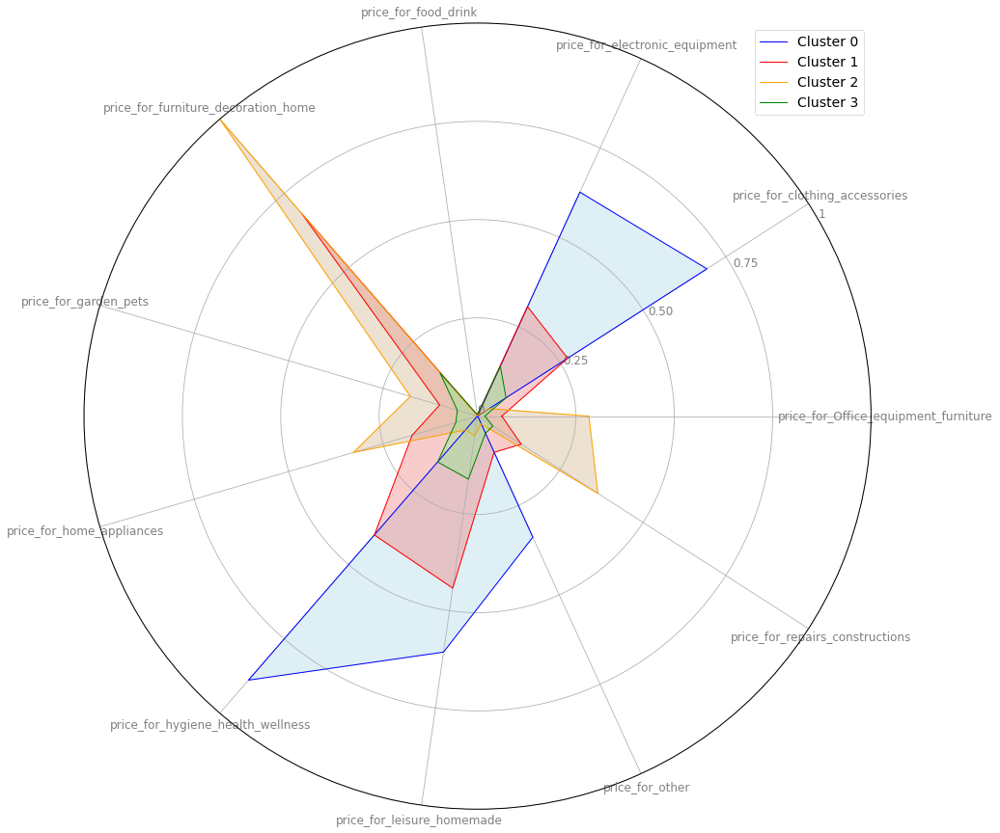

In [ ]:
# %%flake8
from math import pi

categories = list(radar_plot_price)[1:]
values = radar_plot_price.values.flatten().tolist()
values += values[:1]  # repeat the first value to close the circular graph
angles = [n / float(len(categories)) * 2 * pi for n in range(len(categories))]
angles += angles[:1]
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15, 15),
                       subplot_kw=dict(polar=True))
plt.xticks(angles[:-1], categories, color='grey', size=12)
plt.yticks(np.arange(0, 1.25, 0.25), ['0', '0.25', '0.50', '0.75', '1'], color='grey', size=12)
plt.ylim(0, 1)
ax.set_rlabel_position(30)

# Cluster 0
val_c1 = radar_plot_price.loc[0].drop('label').values.flatten().tolist()
val_c1 += val_c1[:1]
ax.plot(angles, val_c1, linewidth=1, linestyle='solid', label='Cluster 0', color='blue')
ax.fill(angles, val_c1, color='lightblue', alpha=0.4) #color the area indide polygon

# Cluster 1
val_c2 = radar_plot_price.loc[1].drop('label').values.flatten().tolist()
val_c2 += val_c2[:1]
ax.plot(angles, val_c2, linewidth=1, linestyle='solid', label='Cluster 1', color='red')
ax.fill(angles, val_c2, color='lightcoral', alpha=0.4) #color the area indide polygon

# Cluster 2
val_c3 = radar_plot_price.loc[2].drop('label').values.flatten().tolist()
val_c3 += val_c3[:1]
ax.plot(angles, val_c3, linewidth=1, linestyle='solid', label='Cluster 2', color='orange')
ax.fill(angles, val_c3, color='tan', alpha=0.4) #color the area indide polygon

# Cluster 3
val_c4 = radar_plot_price.loc[3].drop('label').values.flatten().tolist()
val_c4 += val_c4[:1]
ax.plot(angles, val_c4, linewidth=1, linestyle='solid', label='Cluster 3', color='green')
ax.fill(angles, val_c4, color='lightgreen', alpha=0.4) #color the area indide polygon

plt.legend(loc='upper right',
           fontsize=14)

#lightcyan_patch = mpatches.Patch(color='lightcyan', label='Cluster 0')
#lightpink_patch = mpatches.Patch(color='lightpink', label='Cluster 1')
#lightyellow_patch = mpatches.Patch(color='lightyellow', label='Cluster 2')
#lightgreen_patch = mpatches.Patch(color='lightgreen', label='Cluster 3')



#plt.legend(handles=[lightcyan_patch, lightpink_patch, lightyellow_patch, lightgreen_patch],
#           loc='upper right',
#           fontsize=16)


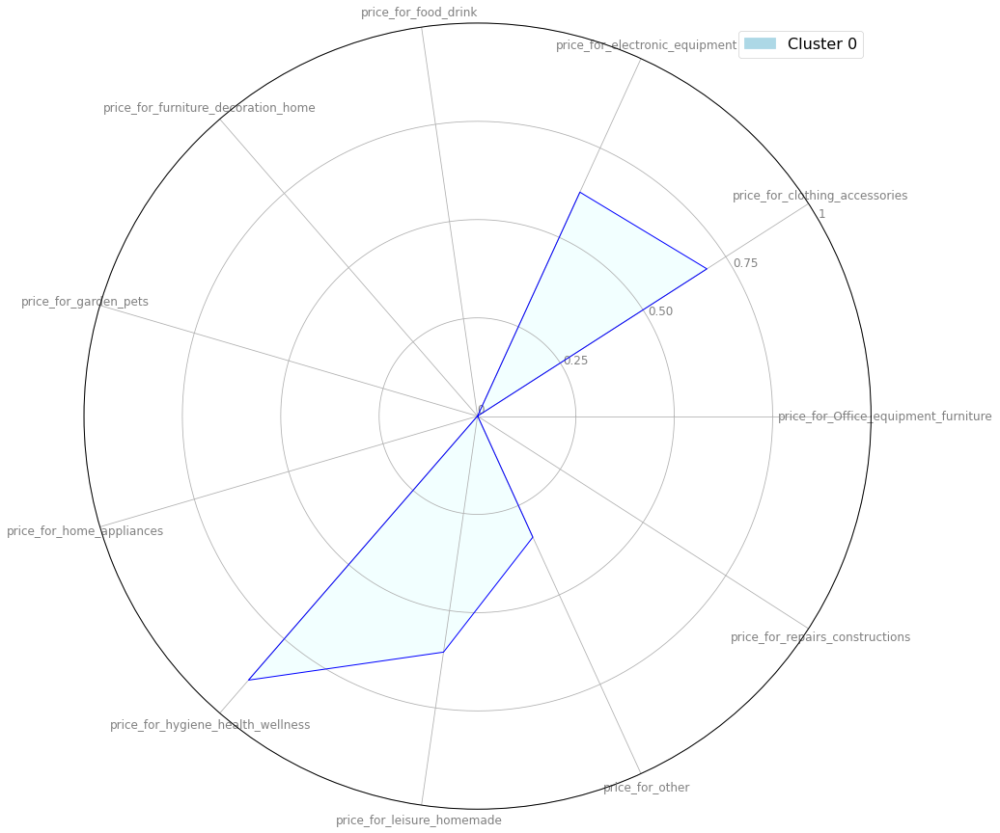

In [ ]:
# %%flake8
categories = list(radar_plot_price)[1:]
values = radar_plot_price.values.flatten().tolist()
values += values[:1]  # repeat the first value to close the circular graph
angles = [n / float(len(categories)) * 2 * pi for n in range(len(categories))]
angles += angles[:1]
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15, 15),
                       subplot_kw=dict(polar=True))
plt.xticks(angles[:-1], categories, color='grey', size=12)
plt.yticks(np.arange(0, 1.25, 0.25), ['0', '0.25', '0.50', '0.75', '1'], color='grey', size=12)
plt.ylim(0, 1)
ax.set_rlabel_position(30)

# Cluster 0
val_c1 = radar_plot_price.loc[0].drop('label').values.flatten().tolist()
val_c1 += val_c1[:1]
ax.plot(angles, val_c1, linewidth=1, linestyle='solid', label='Cluster 0', color='blue')
ax.fill(angles, val_c1, 'lightcyan', alpha=0.4)

lightcyan_patch = mpatches.Patch(color='lightblue', label='Cluster 0')

plt.legend(handles=[lightcyan_patch],
           loc='upper right',
           fontsize=16)

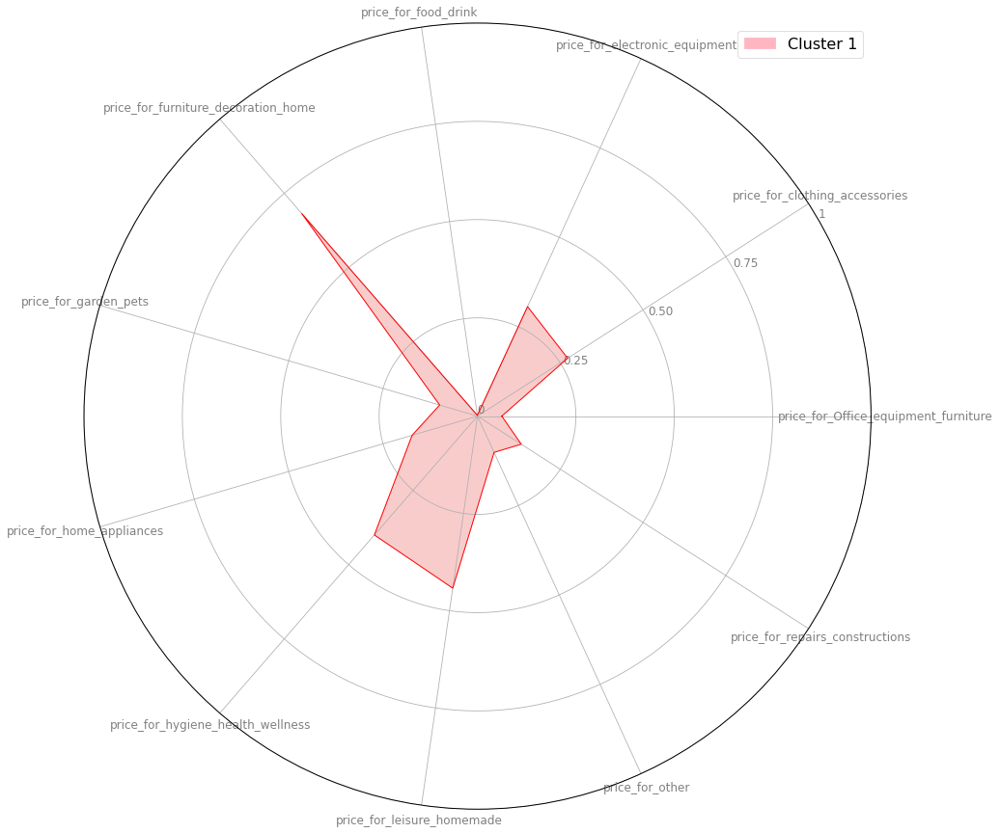

In [ ]:
# %%flake8
categories = list(radar_plot_price)[1:]
values = radar_plot_price.values.flatten().tolist()
values += values[:1]  # repeat the first value to close the circular graph
angles = [n / float(len(categories)) * 2 * pi for n in range(len(categories))]
angles += angles[:1]
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15, 15),
                       subplot_kw=dict(polar=True))
plt.xticks(angles[:-1], categories, color='grey', size=12)
plt.yticks(np.arange(0, 1.25, 0.25), ['0', '0.25', '0.50', '0.75', '1'], color='grey', size=12)
plt.ylim(0, 1)
ax.set_rlabel_position(30)
# Cluster 1
val_c1 = radar_plot_price.loc[1].drop('label').values.flatten().tolist()
val_c1 += val_c1[:1]
ax.plot(angles, val_c1, linewidth=1, linestyle='solid', label='Cluster 1', color='red')
ax.fill(angles, val_c1, 'lightcoral', alpha=0.4)

skyblue_patch = mpatches.Patch(color='lightpink', label='Cluster 1')

plt.legend(handles=[skyblue_patch],
           loc='upper right',
           fontsize=16)

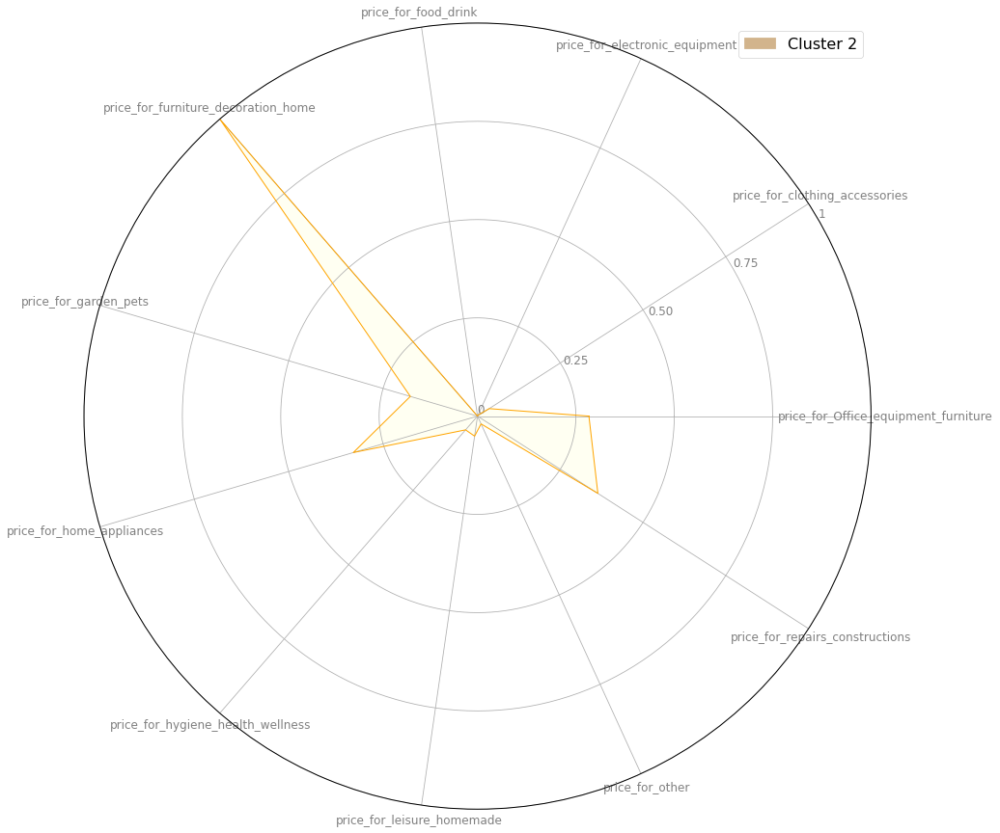

In [ ]:
# %%flake8
categories = list(radar_plot_price)[1:]
values = radar_plot_price.values.flatten().tolist()
values += values[:1]  # repeat the first value to close the circular graph
angles = [n / float(len(categories)) * 2 * pi for n in range(len(categories))]
angles += angles[:1]
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15, 15),
                       subplot_kw=dict(polar=True))
plt.xticks(angles[:-1], categories, color='grey', size=12)
plt.yticks(np.arange(0, 1.25, 0.25), ['0', '0.25', '0.50', '0.75', '1'], color='grey', size=12)
plt.ylim(0, 1)
ax.set_rlabel_position(30)
# Cluster 2
val_c1 = radar_plot_price.loc[2].drop('label').values.flatten().tolist()
val_c1 += val_c1[:1]
ax.plot(angles, val_c1, linewidth=1, linestyle='solid', label='Cluster 2', color='orange')
ax.fill(angles, val_c1, 'lightyellow', alpha=0.4)

lightyellow_patch = mpatches.Patch(color='tan', label='Cluster 2')

plt.legend(handles=[lightyellow_patch],
           loc='upper right',
           fontsize=16)

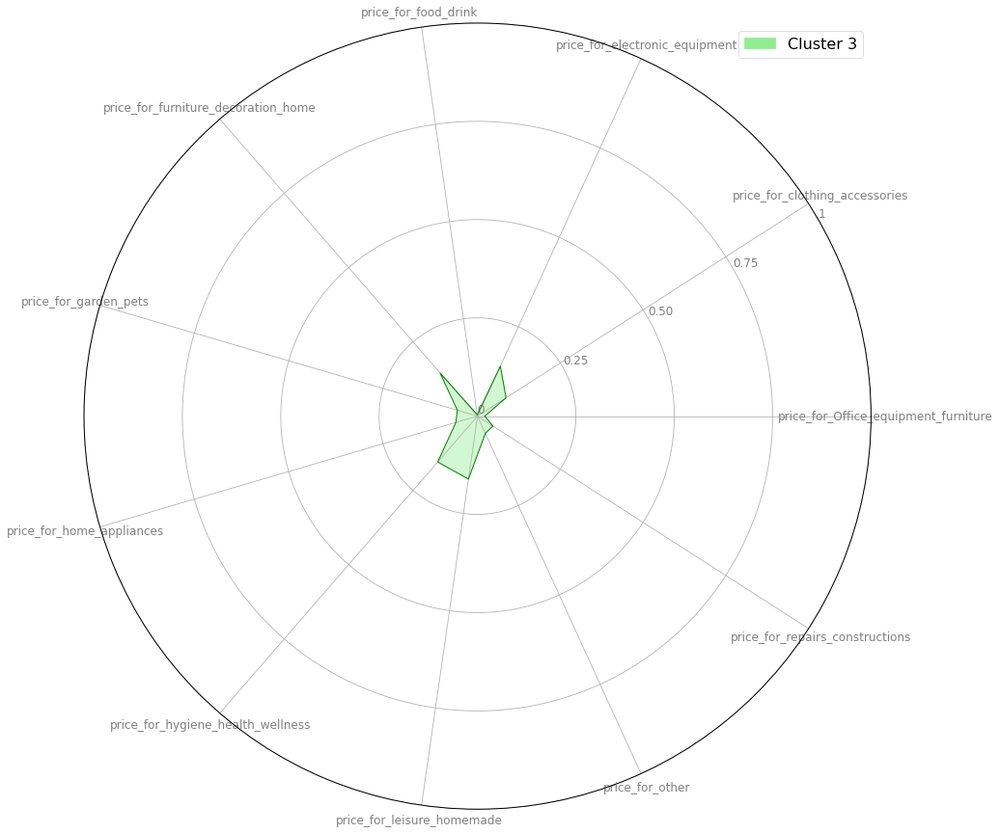

In [ ]:
# %%flake8
categories = list(radar_plot_price)[1:]
values = radar_plot_price.values.flatten().tolist()
values += values[:1]  # repeat the first value to close the circular graph
angles = [n / float(len(categories)) * 2 * pi for n in range(len(categories))]
angles += angles[:1]
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15, 15),
                       subplot_kw=dict(polar=True))
plt.xticks(angles[:-1], categories, color='grey', size=12)
plt.yticks(np.arange(0, 1.25, 0.25), ['0', '0.25', '0.50', '0.75', '1'], color='grey', size=12)
plt.ylim(0, 1)
ax.set_rlabel_position(30)
# Cluster 2
val_c1 = radar_plot_price.loc[3].drop('label').values.flatten().tolist()
val_c1 += val_c1[:1]
ax.plot(angles, val_c1, linewidth=1, linestyle='solid', label='Cluster 3', color='green')
ax.fill(angles, val_c1, 'lightgreen', alpha=0.4)

lightgreen_patch = mpatches.Patch(color='lightgreen', label='Cluster 3')

plt.legend(handles=[lightgreen_patch],
           loc='upper right',
           fontsize=16)

Using these graphs, we can determine in which product categories each cluster puts the most money.

- The price reserved for the food and beverage category (price_for_food_drink) does not define the separation between our four clusters.

- The price reserved for the electronic equipment category (price_for_electronic_equipment) allows a separation between clusters 0,1,3 and cluster 2.

- The price reserved for the clothing and accessory category (price_for_clothing_accessorie) allows a separation between clusters 0,1,3 and cluster 2.

- The price reserved for the office equipment category (price_for_office_equipment_furniture) allows a separation between cluster 1, 2, 3 and cluster 0.

- The price reserved for the repair and construction category (price_for_repairs_construction) allows a separation between cluster 1, 2, 3 and cluster 0.

- The price reserved for the category other (price_for_other) allows a separation between cluster 0,1,3 and cluster 2.

- The price reserved for the homemade category (price_for_homemade) allows a separation between clusters 0, 1, 2, 3.

- The price reserved for the hygiene category (price_for_hygiene_health_wellness) allows a separation between the clusters 0, 1, 2, 3.

- The price reserved for the home appliances category (price_for_home_appliance) allows a separation between clusters 1, 2, 3 and cluster 0.

- The price reserved for the pet garden category (price_for_garden_pets) allows a separation between cluster 1, 2, 3 and cluster 0.

- The price reserved for the home decoration category (price_for_furniture_home_decoration) allows a separation between cluster 1, 2, 3 and cluster 0.

- Cluster 0 puts the most money in the categories: electronics_equipment, clothing_accessories, other, leisure_homemade, hygiene_health_wellness

- Cluster 1 is quite uniform in the price (average price) given to each product category, without favoring any of them. 

- Cluster 2 invests the most money in the following categories: office_equipment_furniture, repairs_construction, home_appliance, furniture_home_decoation

- Cluster 3 is fairly uniform in the price (low price) given to each product category, without favoring any of them.  macos/deepLFree.translatedWithDeepL.text

## <font color='blue'> Numerical Data Analysis </font>

In [ ]:
tot_data_label.shape

(85408, 28)

In [ ]:
tot_data_label_boxplot = tot_data_label.select_dtypes(include='number')
tot_data_label_boxplot = tot_data_label_boxplot.iloc[: , 0:14].copy()
tot_data_label_boxplot

,label,number_order,distance_between_seller_customer,date_last_order,mean_days_between_orders,mean_item_per_order,mean_volume_item_ordered,date_first_order,mean_product_price,mean_freight_value,mean_order_value,mean_review_score,mean_payment_sequential,mean_payment_installment
0,2,1.0,3.160256,736465.0,0.0,1.0,107136.0,736465.0,124.99,21.88,146.87,4.0,1.0,2.0
1,2,1.0,3.831877,736706.0,0.0,1.0,53400.0,736706.0,289.00,46.48,335.48,5.0,1.0,8.0
2,2,1.0,0.293126,736833.0,0.0,1.0,45968.0,736833.0,139.94,17.79,157.73,5.0,1.0,7.0
3,2,1.0,0.181996,736766.0,0.0,1.0,79968.0,736766.0,149.94,23.36,173.30,5.0,1.0,1.0
4,2,1.0,2.080467,736904.0,0.0,1.0,23625.0,736904.0,230.00,22.25,252.25,5.0,1.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85403,3,1.0,3.984376,736680.0,0.0,1.0,26496.0,736680.0,55.00,20.88,75.88,1.0,1.0,1.0
85404,3,1.0,3.445074,736791.0,0.0,1.0,11132.0,736791.0,74.90,13.88,88.78,4.0,1.0,6.0
85405,3,1.0,2.322013,736788.0,0.0,1.0,13200.0,736788.0,114.90,14.16,129.06,5.0,1.0,3.0
85406,3,1.0,21.390305,736792.0,0.0,1.0,9000.0,736792.0,37.00,19.04,56.04,1.0,1.0,5.0


In [ ]:
tot_data_label_boxplot.groupby('label').mean()

,number_order,distance_between_seller_customer,date_last_order,mean_days_between_orders,mean_item_per_order,mean_volume_item_ordered,date_first_order,mean_product_price,mean_freight_value,mean_order_value,mean_review_score,mean_payment_sequential,mean_payment_installment
label,,,,,,,,,,,,,
0,1.000146,7.431493,736703.485794,0.000000,1.098788,11348.057873,736703.485794,196.591506,22.220051,232.261561,4.057008,1.013878,4.074063
1,2.000000,5.001194,736695.813559,19.664407,1.134181,11885.517435,736656.484746,77.113874,17.314211,102.454394,4.096186,1.042938,2.977966
2,1.001040,5.961461,736696.000971,0.000069,1.214330,33946.191118,736696.000832,135.671363,27.430296,181.920225,3.979607,1.016994,4.106957
3,1.000000,4.719611,736696.390456,0.000000,1.067585,8043.072581,736696.390456,56.360131,14.981485,75.498206,4.115973,1.024833,1.978732


<Figure size 504x360 with 0 Axes>

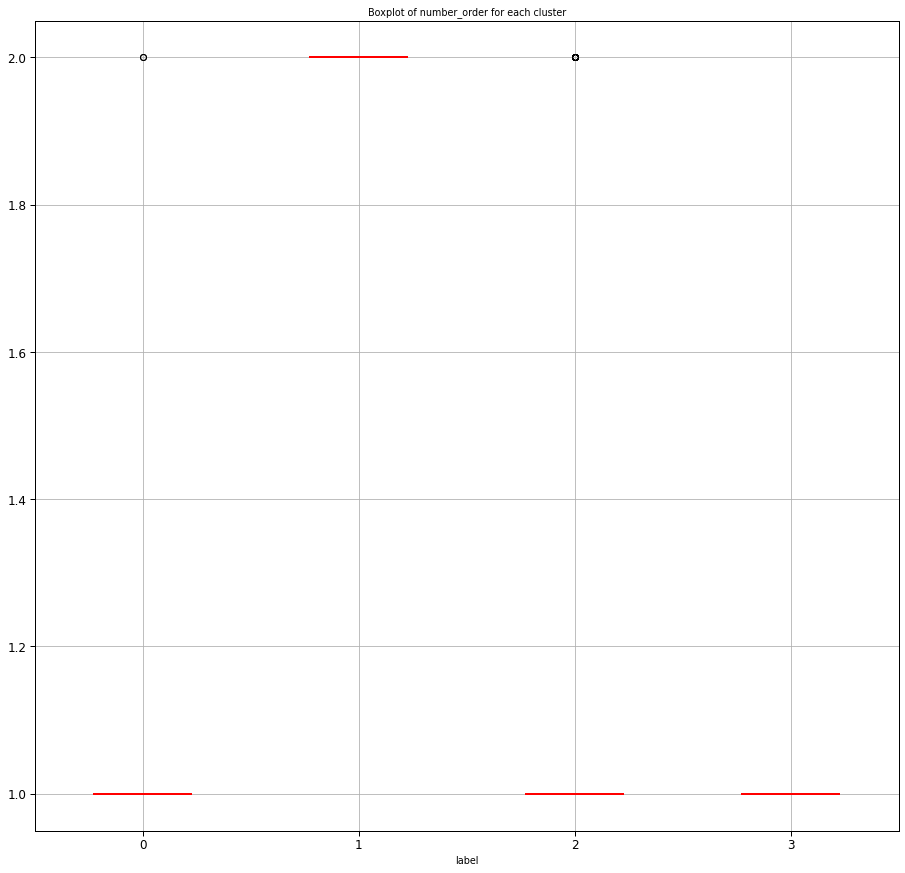

<Figure size 504x360 with 0 Axes>

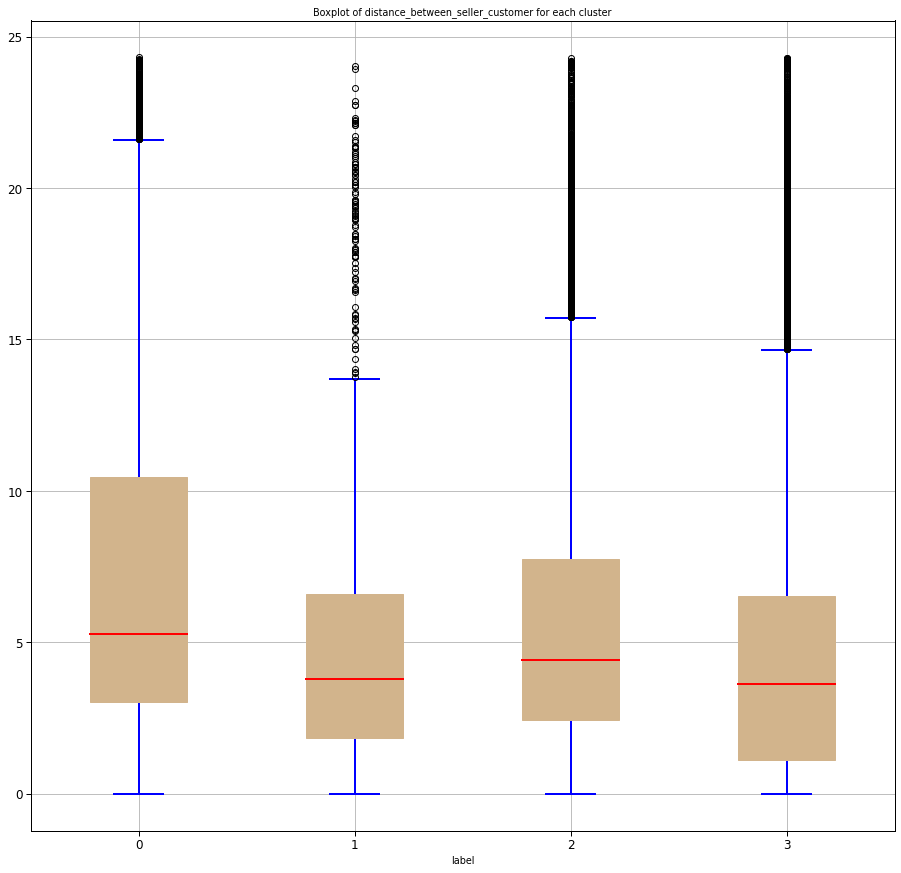

<Figure size 504x360 with 0 Axes>

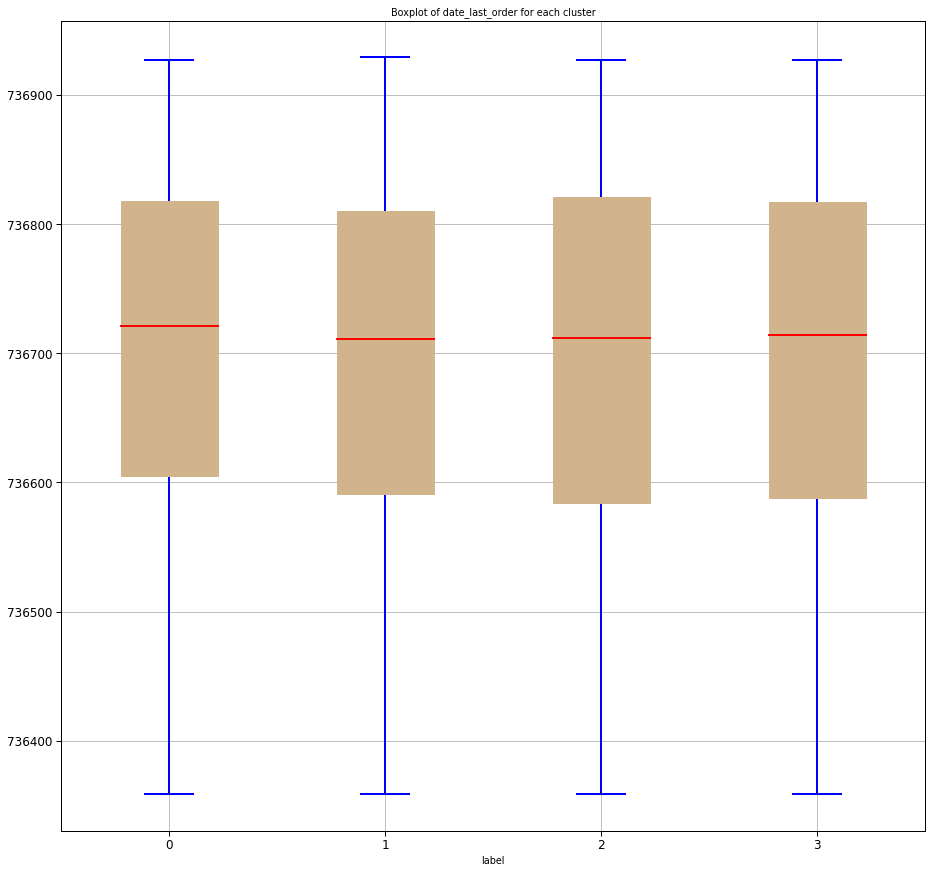

<Figure size 504x360 with 0 Axes>

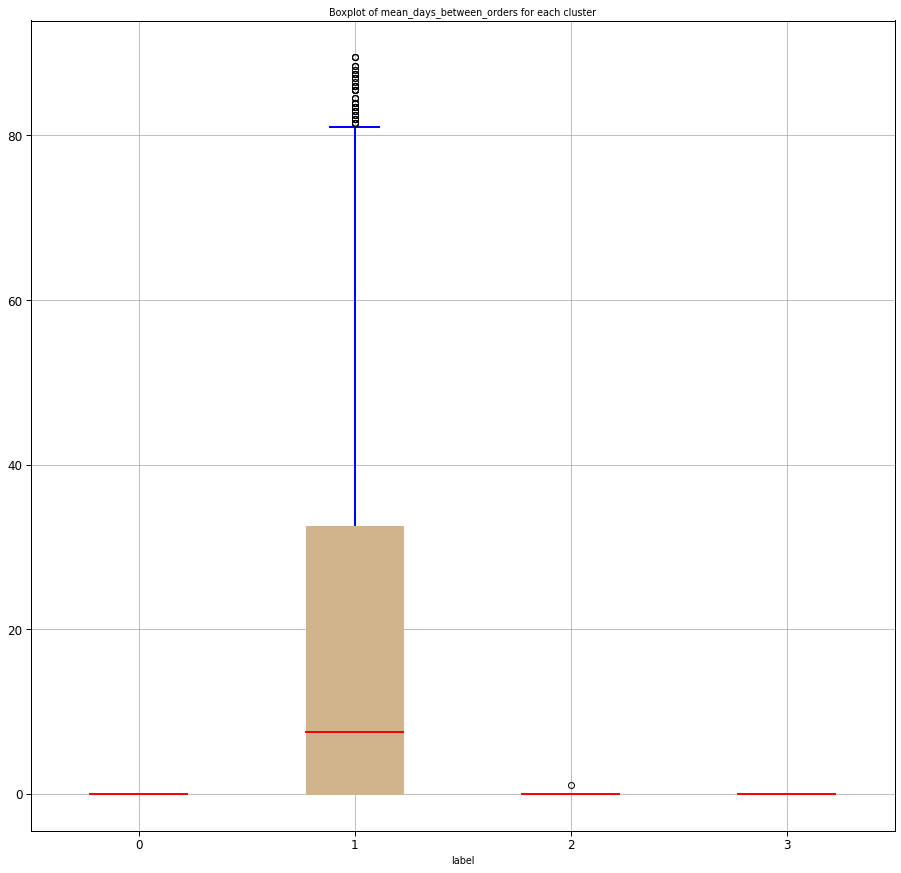

<Figure size 504x360 with 0 Axes>

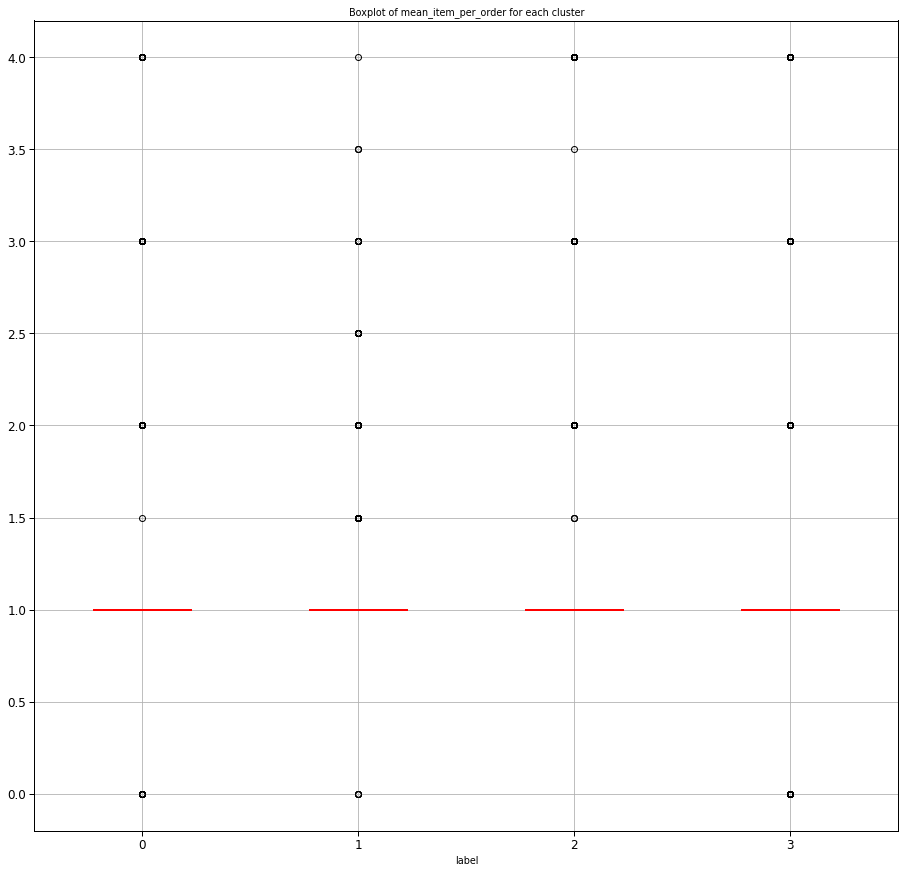

<Figure size 504x360 with 0 Axes>

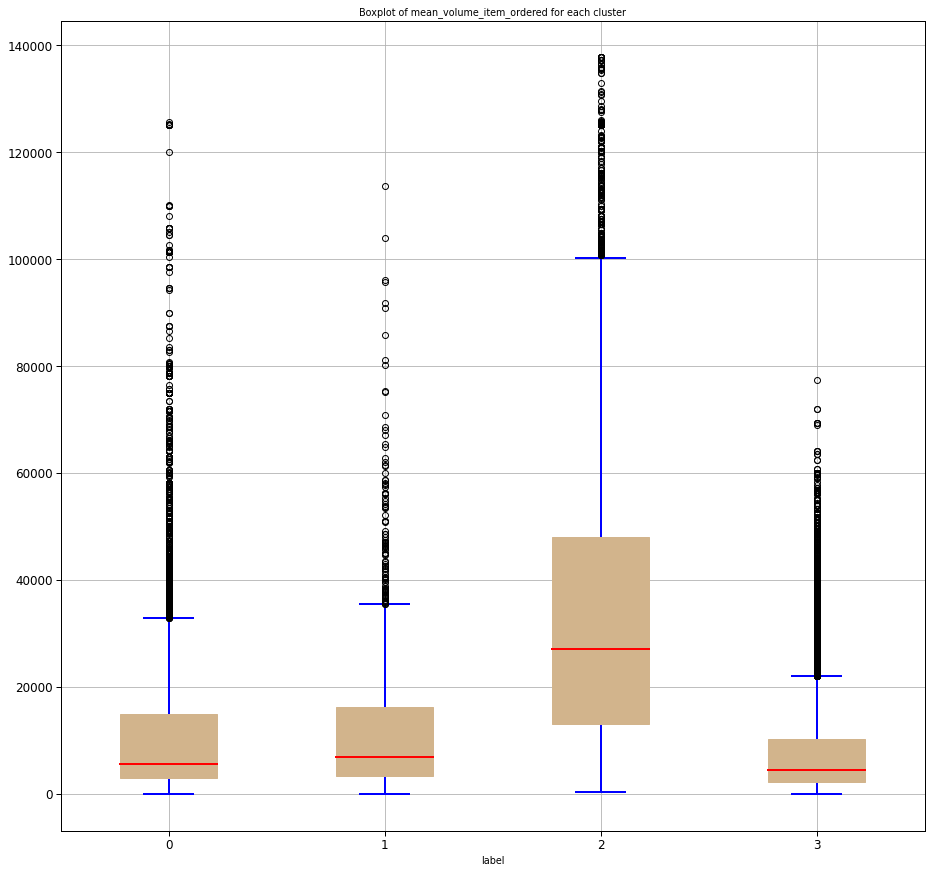

<Figure size 504x360 with 0 Axes>

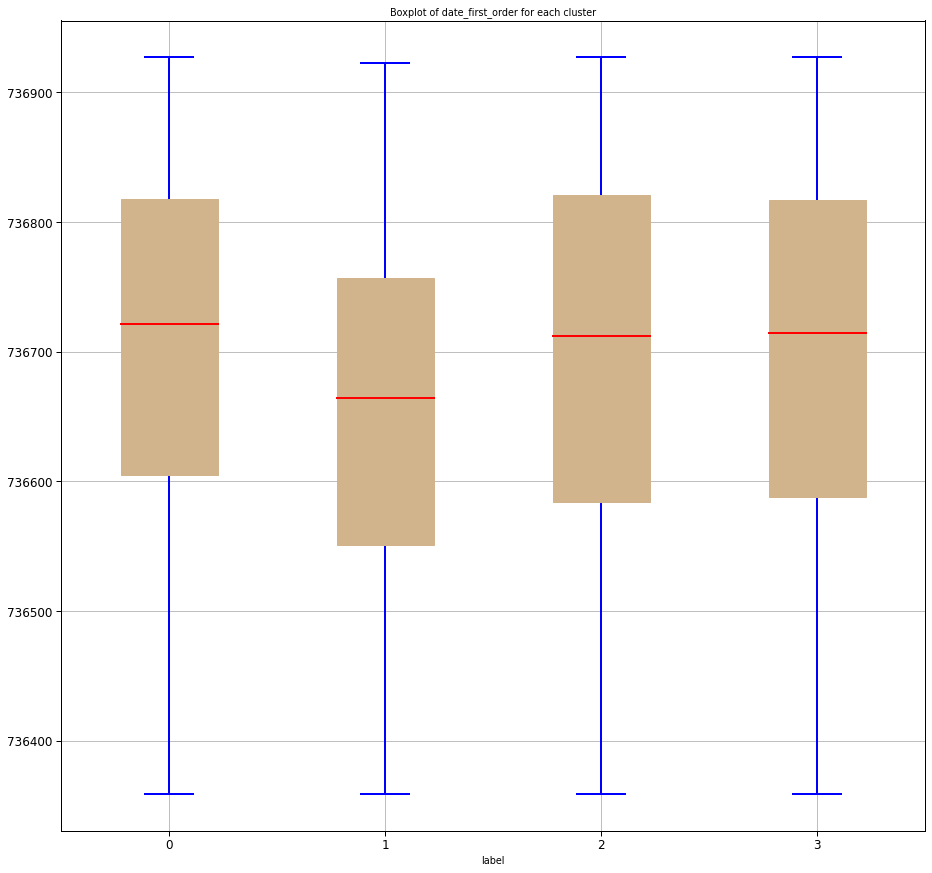

<Figure size 504x360 with 0 Axes>

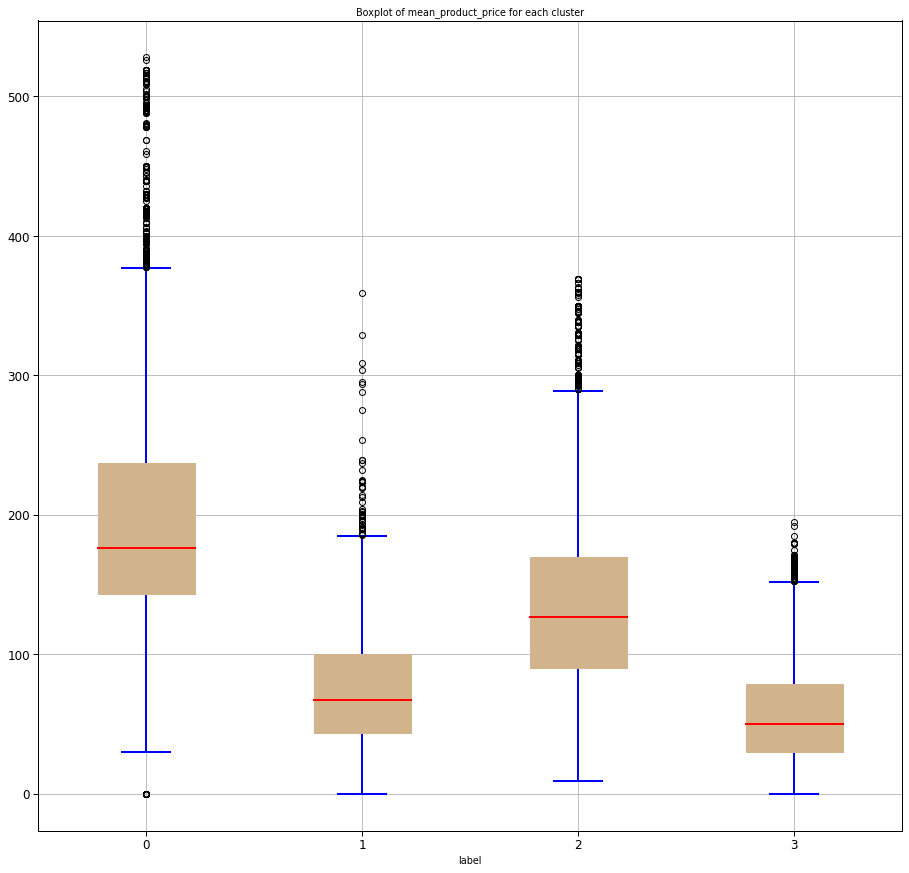

<Figure size 504x360 with 0 Axes>

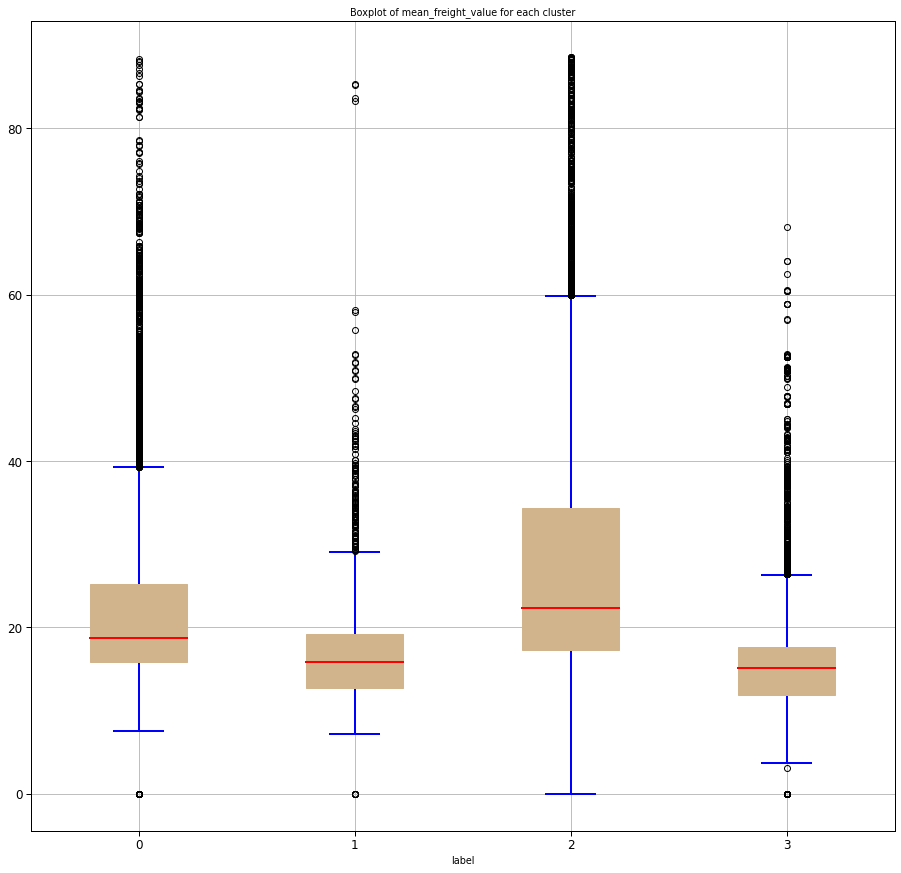

<Figure size 504x360 with 0 Axes>

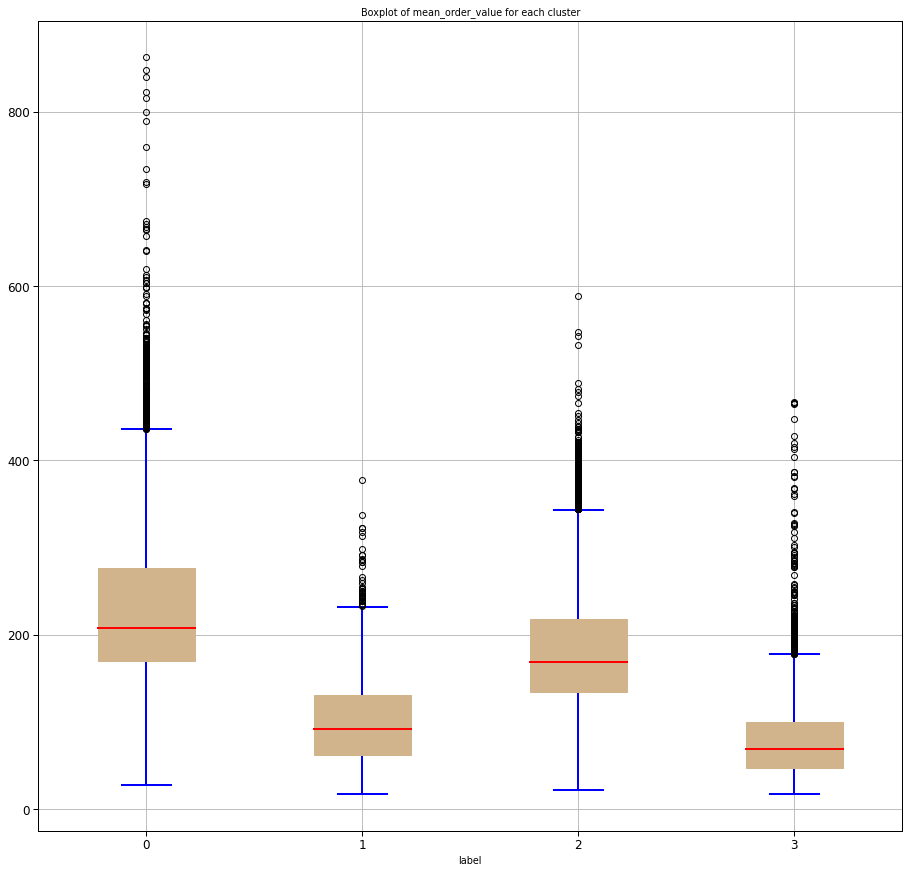

<Figure size 504x360 with 0 Axes>

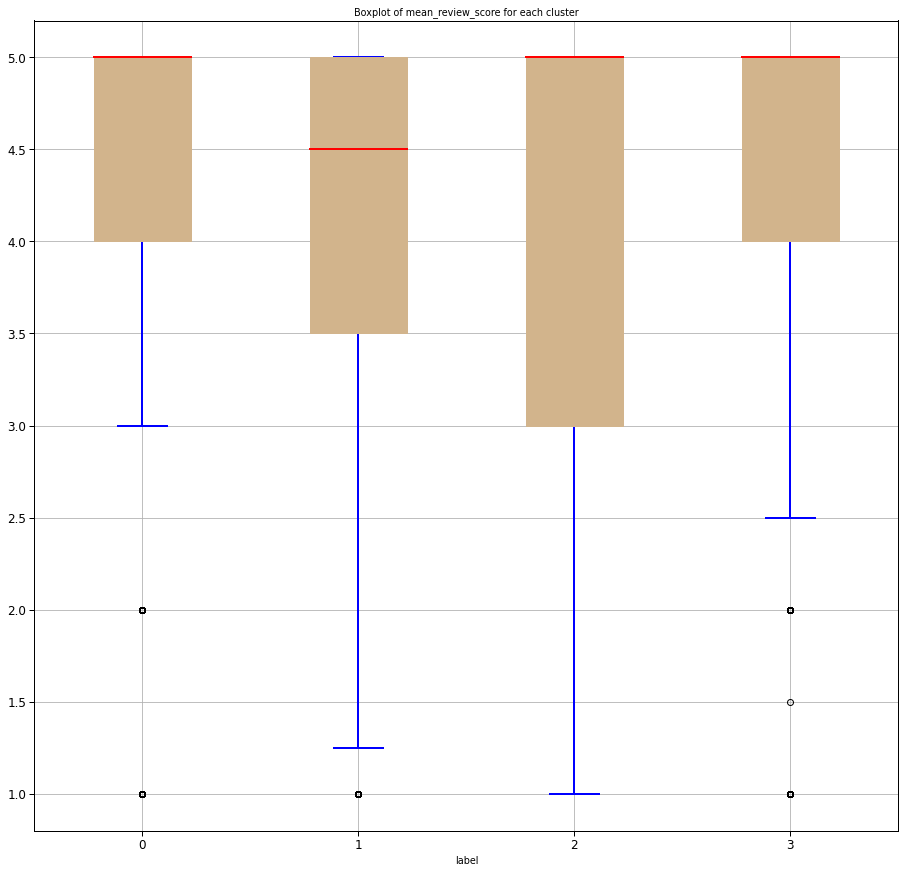

<Figure size 504x360 with 0 Axes>

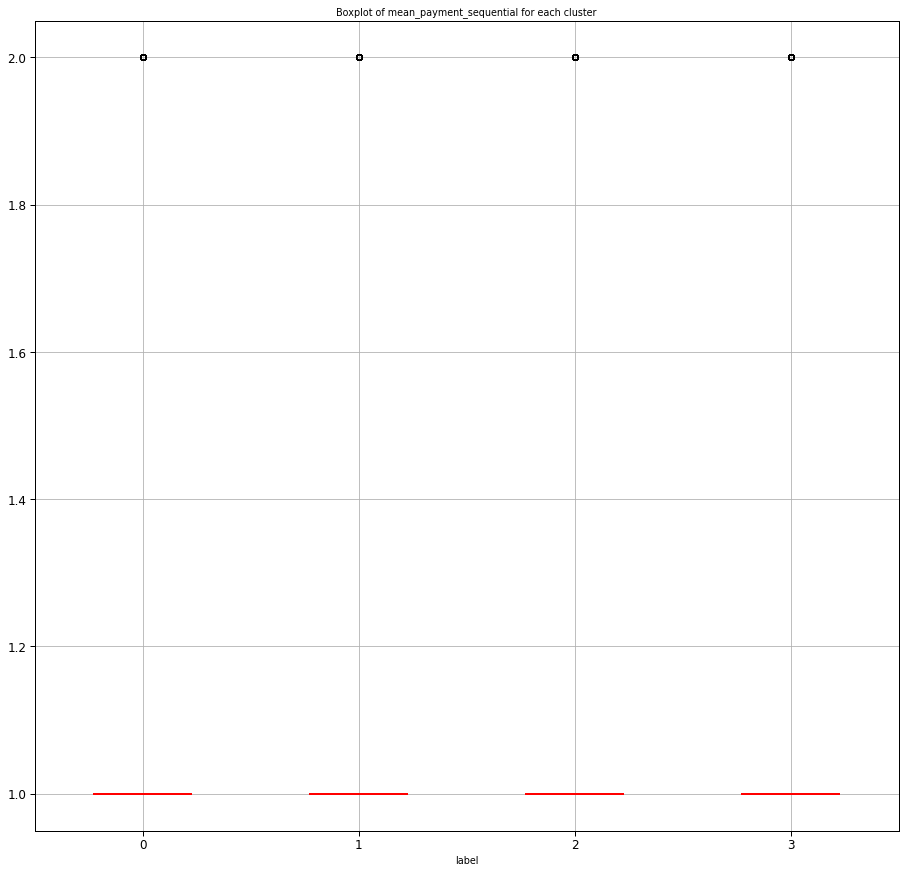

<Figure size 504x360 with 0 Axes>

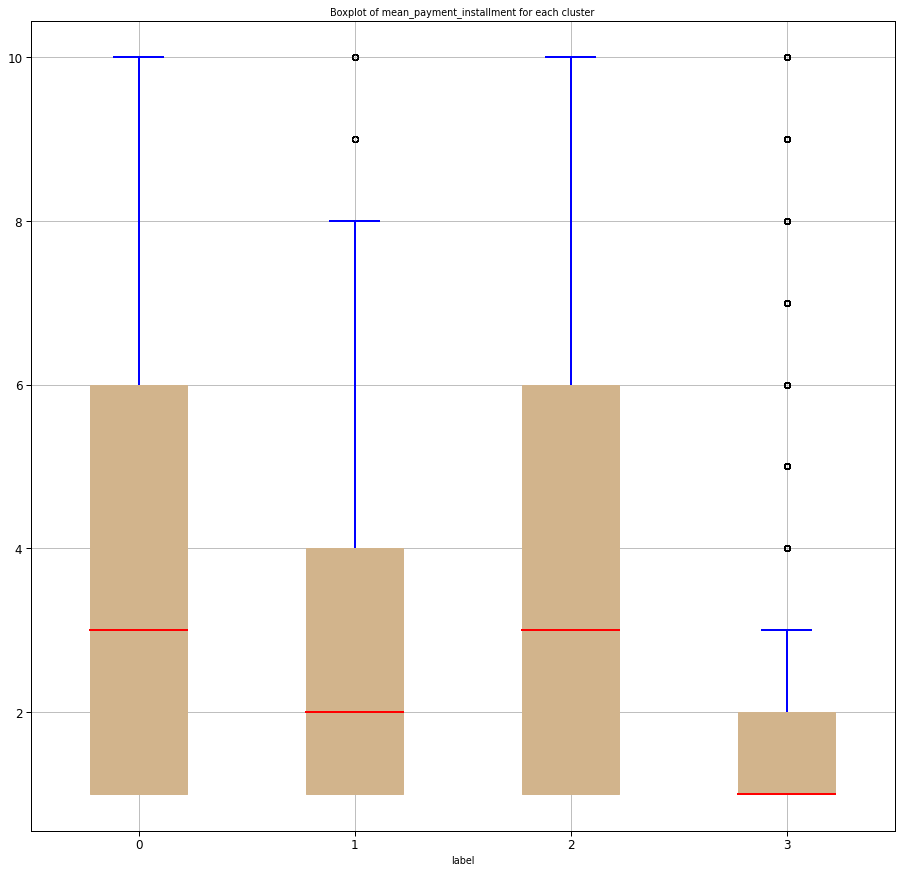

In [ ]:
for col in tot_data_label_boxplot.columns:
    if col =='label':
        pass
    else :
        plt.figure(figsize=(7, 5))
        tot_data_label_boxplot.boxplot(column=[col], by='label', fontsize=12, figsize=(15,15), showcaps=True, patch_artist=True, color='tan', medianprops={'linestyle': '-',
                                             'linewidth': 2, 'color': 'red'},
                   whiskerprops={'linestyle': '-', 'linewidth': 2,
                                 'color': 'blue'},
                   capprops={'linestyle': '-', 'linewidth': 2,
                             'color': 'blue'})
        title_boxplot = 'Boxplot of ' + str(col) + ' for each cluster'
        plt.title( title_boxplot )
        plt.suptitle('') # that's what you're after
        plt.show()
        print("\n \n \n")

Thanks to these boxplots, we can determine the main characteristics of each cluster.

- Some of the analyzed variables do not allow to define a separation between clusters: date_last_order, item_per_order, mean_payment_sequenttial.

- Cluster 0 : Individuals of this cluster have generally placed 1 order (number_order) of the most expensive (mean_order_value) products (mean_product_price), far enough from expensive them (distance_between_seller_customer). The individuals of this cluster put on average a rating of 4.05 (order_review) and pay on average in 4 times (mean_paymment_installment).

- Cluster 1: The individuals of this cluster have generally made 2 orders (number_order), that's why they are the only ones to have an important delay between two orders (mean_days_between_orders). This cluster gathers the individuals having made the oldest orders (date_first_order) with a mean review-score of 4.09 (review_score) in 2 or 3 times (mean_paymment_installment). The orders are placed with sellers close to the buyers (distance_between_seller_customer) and their amounts (mean_order_value) are not very high because the products (mean_price_product) purchased are not very expensive.

- Cluster 2 : The individuals of this cluster have generally placed 1 order (number_order) of very voluminous products (mean_item_ordered) and quite expensive (mean_product_price), that's why the individuals of this cluster pay the most shipping costs (mean_freight_value). The individuals of this cluster put on average a score of 3.9 (order_review) and pay on average in 4 times (mean_paymment_installment).

- Cluster 3: Individuals in this cluster typically place 1 order (number_order) of small volume products (mean_volume_item_ordered) that are cheap (mean_product_price) and therefore orders are cheap (mean_order_value). Individuals in this cluster put an average rating of 4.1 (order_review) and pay on average in 1 to 2 times (mean_paymment_installment).


## <font color='blue'> Categorical Data Analysis</font>

In [ ]:
tot_data_label["label"] = tot_data_label["label"].astype('object')

In [ ]:
tot_data_label.dtypes

label                                    object
customer_region                          object
number_order                            float64
distance_between_seller_customer        float64
date_last_order                         float64
mean_days_between_orders                float64
mean_item_per_order                     float64
mean_volume_item_ordered                float64
date_first_order                        float64
mean_product_price                      float64
mean_freight_value                      float64
mean_order_value                        float64
mean_review_score                       float64
mean_payment_sequential                 float64
mean_payment_installment                float64
most_payment_used                        object
category_most_purchased                  object
price_for_Office_equipment_furniture    float64
price_for_clothing_accessories          float64
price_for_electronic_equipment          float64
price_for_food_drink                    

In [ ]:
tot_data_label_nom = tot_data_label.select_dtypes(include='object')

In [ ]:
# %%flake8
cluster_0_nominal = tot_data_label_nom.loc[df['label'] == 0]
cluster_1_nominal = tot_data_label_nom.loc[df['label'] == 1]
cluster_2_nominal = tot_data_label_nom.loc[df['label'] == 2]

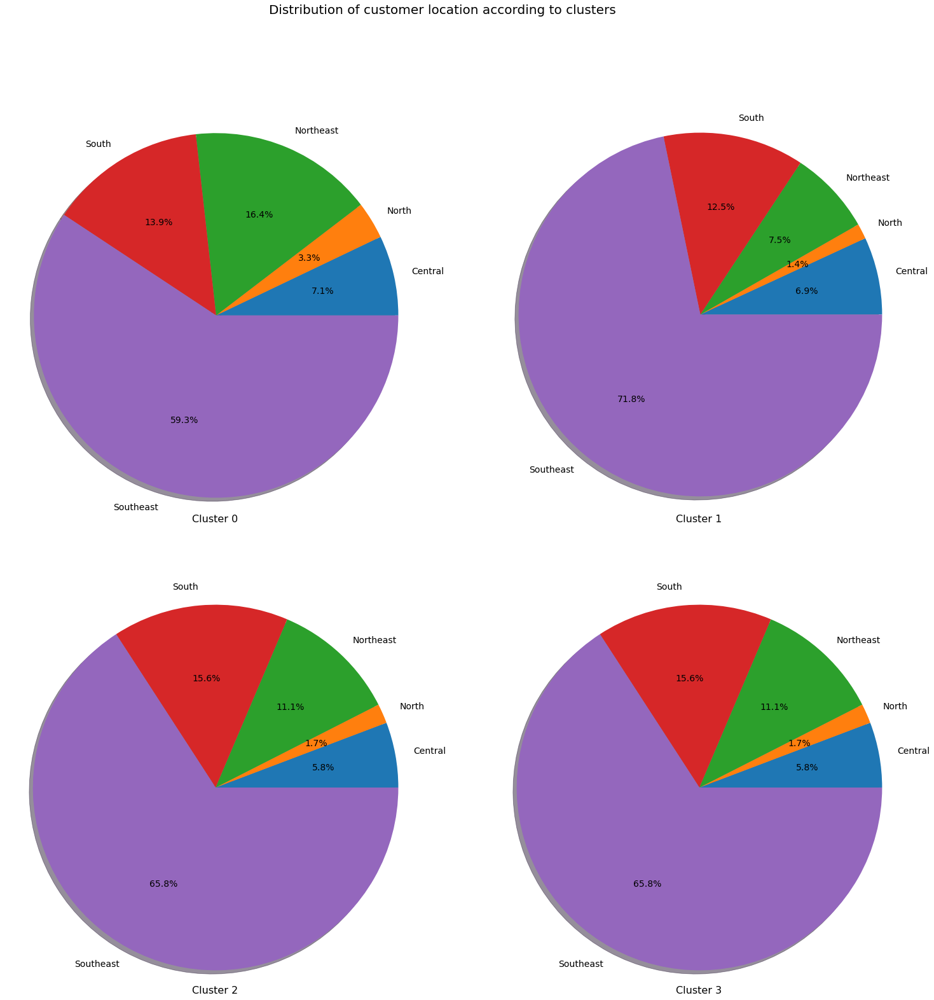

In [ ]:
# %%flake8

fig = plt.figure(figsize=(25, 25))
ax1 = plt.subplot(221)
ax2 = plt.subplot(222)
ax3 = plt.subplot(223)
ax4 = plt.subplot(224)


ax1 = cluster_0_nominal.groupby('customer_region').count().plot(kind='pie',
                                                                y='label',
                                                                ax=ax1,
                                                                legend=False,
                                                                shadow=True,
                                                                startangle=0,
                                                                autopct='%1.1f%%',
                                                                textprops={'fontsize': 14})
ax1.axis('equal')
ax1.set_xlabel("Cluster 0", fontsize=16)
ax1.set_ylabel(" ")


ax2 = cluster_1_nominal.groupby('customer_region').count().plot(kind='pie',
                                                                y='label',
                                                                ax=ax2,
                                                                legend=False,
                                                                shadow=True,
                                                                startangle=0,
                                                                autopct='%1.1f%%',
                                                                textprops={'fontsize': 14})
ax2.axis('equal')
ax2.set_xlabel("Cluster 1", fontsize=16)
ax2.set_ylabel(" ")


ax3 = cluster_2_nominal.groupby('customer_region').count().plot(kind='pie',
                                                                y='label',
                                                                ax=ax3,
                                                                legend=False,
                                                                shadow=True,
                                                                startangle=0,
                                                                autopct='%1.1f%%',
                                                                textprops={'fontsize': 14})
ax3.axis('equal')
ax3.set_xlabel("Cluster 2", fontsize=16)
ax3.set_ylabel(" ")

ax4 = cluster_2_nominal.groupby('customer_region').count().plot(kind='pie',
                                                                y='label',
                                                                ax=ax4,
                                                                legend=False,
                                                                shadow=True,
                                                                startangle=0,
                                                                autopct='%1.1f%%',
                                                                textprops={'fontsize': 14})
ax4.axis('equal')
ax4.set_xlabel("Cluster 3", fontsize=16)
ax4.set_ylabel(" ")



plt.suptitle('Distribution of customer location according to clusters',
             fontsize=20)

#plt.subplots_adjust(wspace=0.5)

plt.show()

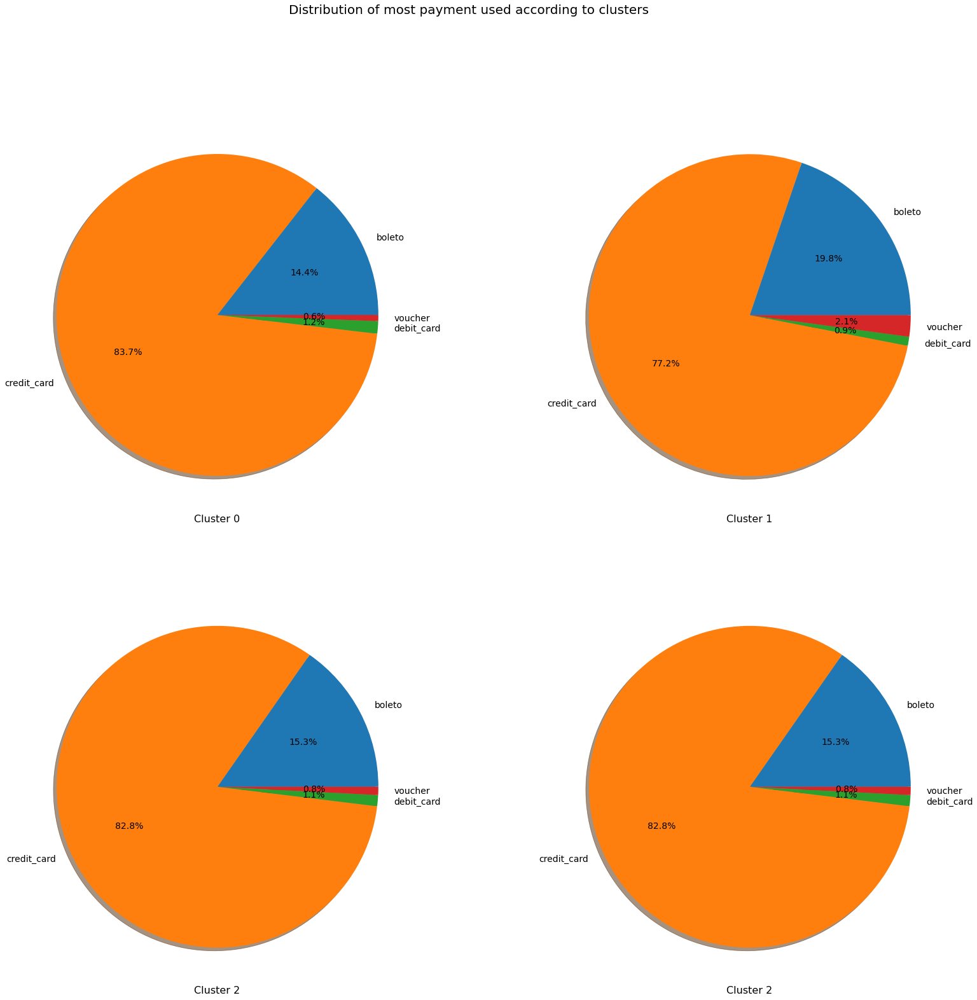

In [ ]:
fig = plt.figure(figsize=(25, 25))
ax1 = plt.subplot(221)
ax2 = plt.subplot(222)
ax3 = plt.subplot(223)
ax4 = plt.subplot(224)

ax1 = cluster_0_nominal.groupby('most_payment_used').count().plot(kind='pie',
                                                                  y='label',
                                                                  autopct='%1.1f%%',
                                                                  textprops={'fontsize': 14},
                                                                  ax=ax1,
                                                                  legend=False,
                                                                  shadow=True,
                                                                  startangle=0)
ax1.axis('equal')
ax1.set_xlabel("Cluster 0", fontsize=16)
ax1.set_ylabel(" ")


ax2 = cluster_1_nominal.groupby('most_payment_used').count().plot(kind='pie',
                                                                  y='label',
                                                                  autopct='%1.1f%%',
                                                                  textprops={'fontsize': 14},
                                                                  ax=ax2,
                                                                  legend=False,
                                                                  shadow=True,
                                                                  startangle=0)
ax2.axis('equal')
ax2.set_xlabel("Cluster 1", fontsize=16)
ax2.set_ylabel(" ")


ax3 = cluster_2_nominal.groupby('most_payment_used').count().plot(kind='pie',
                                                                  y='label',
                                                                  autopct='%1.1f%%',
                                                                  textprops={'fontsize': 14},
                                                                  ax=ax3,
                                                                  legend=False,
                                                                  shadow=True,
                                                                  startangle=0)
ax3.axis('equal')
ax3.set_xlabel("Cluster 2", fontsize=16)
ax3.set_ylabel(" ")

ax4 = cluster_2_nominal.groupby('most_payment_used').count().plot(kind='pie',
                                                                  y='label',
                                                                  autopct='%1.1f%%',
                                                                  textprops={'fontsize': 14},
                                                                  ax=ax4,
                                                                  legend=False,
                                                                  shadow=True,
                                                                  startangle=0)
ax4.axis('equal')
ax4.set_xlabel("Cluster 2", fontsize=16)
ax4.set_ylabel(" ")


plt.suptitle('Distribution of most payment used according to clusters', fontsize=20)
plt.subplots_adjust(wspace=0.5)

plt.show()

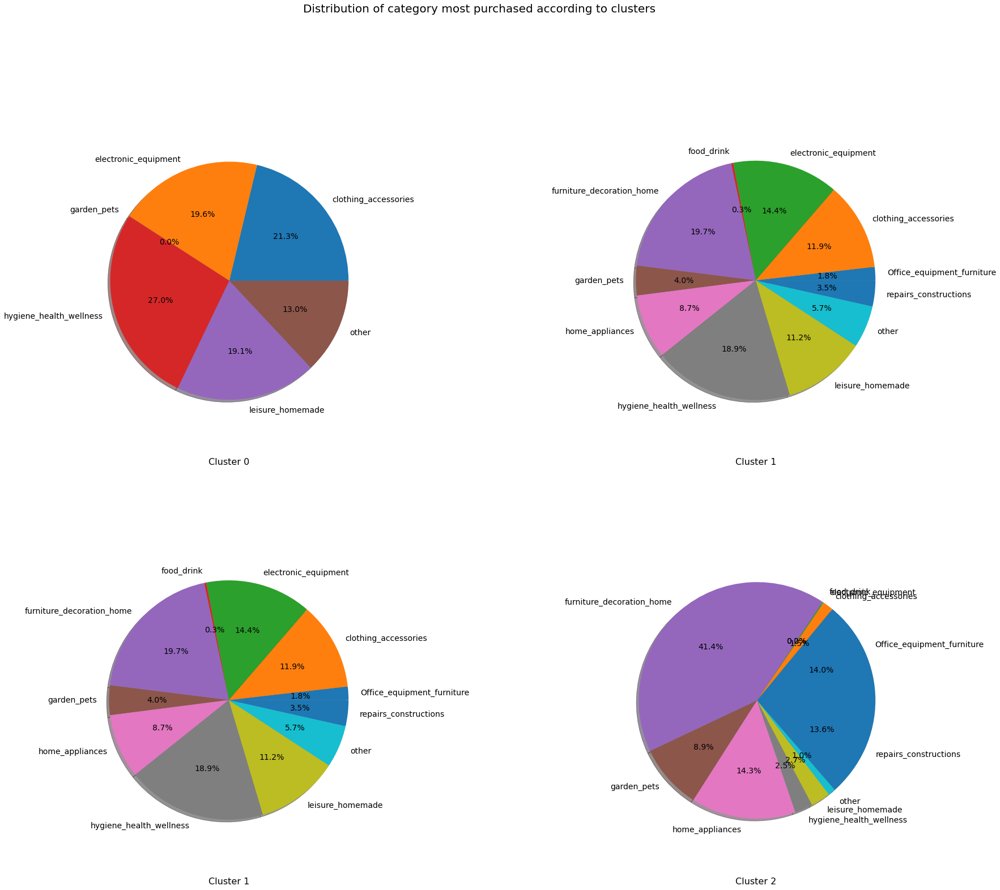

In [ ]:
fig = plt.figure(figsize=(25, 25))
ax1 = plt.subplot(221)
ax2 = plt.subplot(222)
ax3 = plt.subplot(223)
ax4 = plt.subplot(224)


ax1 = cluster_0_nominal.groupby('category_most_purchased').count().plot(kind='pie',
                                                                        y='label',
                                                                        autopct='%1.1f%%',
                                                                        textprops={'fontsize': 14}, 
                                                                        ax=ax1,
                                                                        legend=False,
                                                                        shadow=True,
                                                                        startangle=0)
ax1.axis('equal')
ax1.set_xlabel("Cluster 0", fontsize=16)
ax1.set_ylabel(" ")


ax2 = cluster_1_nominal.groupby('category_most_purchased').count().plot(kind='pie',
                                                                        y='label',
                                                                        autopct='%1.1f%%',
                                                                        textprops={'fontsize': 14},
                                                                        ax=ax2,
                                                                        legend=False,
                                                                        shadow=True,
                                                                        startangle=0)
ax2.axis('equal')
ax2.set_xlabel("Cluster 1", fontsize=16)
ax2.set_ylabel(" ")

ax3 = cluster_1_nominal.groupby('category_most_purchased').count().plot(kind='pie',
                                                                        y='label',
                                                                        autopct='%1.1f%%',
                                                                        textprops={'fontsize': 14},
                                                                        ax=ax3,
                                                                        legend=False,
                                                                        shadow=True,
                                                                        startangle=0)
ax3.axis('equal')
ax3.set_xlabel("Cluster 1", fontsize=16)
ax3.set_ylabel(" ")


ax4 = cluster_2_nominal.groupby('category_most_purchased').count().plot(kind='pie',
                                                                        y='label',
                                                                        autopct='%1.1f%%',
                                                                        textprops={'fontsize': 14},
                                                                        ax=ax4,
                                                                        legend=False,
                                                                        shadow=True,
                                                                        startangle=0)
ax4.axis('equal')
ax4.set_xlabel("Cluster 2", fontsize=16)
ax4.set_ylabel(" ")


plt.suptitle('Distribution of category most purchased according to clusters', fontsize=20)
plt.subplots_adjust(wspace=1)

plt.show()

No separation of clusters thanks to the customers_location because the distribution of customers is similar.

No separation of clusters thanks to the most_payment_used because the distribution of payments is similar.

- Cluster 0 : In this cluster, most of the orders are for products in the categories : hygiene_health_wellness, clothing_accessories, leisure_homemade

- Cluster 1 : In this cluster, most of the orders concern products in the categories : furniture_decoration_home, hygiene_health_wellness, electronic_equipment

- Cluster 2 : In this cluster, the majority of orders concern products found in the categories : furniture_decoration_home, hygiene_health_wellness, electronic_equipment
 
- Cluster 3 : In this cluster, the majority of orders concern products that can be found in the categories : furniture_decoration_home, office_equipment_furniture, repairs_construction




## <font color='blue'>Conclusion on the analysis of each cluster</font>

* Cluster 0 : 16,0% of the total
    - Individuals of this cluster have generally placed 1 order (number_order) of the most expensive (mean_order_value) products (mean_product_price), far enough from expensive them (distance_between_seller_customer). The individuals of this cluster put on average a rating of 4.05 (order_review) and pay on average in 4 times (mean_paymment_installment)
    - In this cluster, most of the orders are for products in the categories : hygiene_health_wellness, clothing_accessories, leisure_homemade
    - Cluster 0 puts the most money in the categories: electronics_equipment, clothing_accessories, other, leisure_homemade, hygiene_health_wellness

        **Conclusion: In this group, customers buy one large and expensive item per order from vendors far from their homes. They order the most in the hygiene_health_wellness, clothing_accessories, leisure_homemade categories and spend the most in the electronics_equipment, clothing_accessories, leisure_homemade, hygiene_health_wellness categories. Cluster associated with everything related to beauty and leisure.**   

 <br>

* Cluster 1: Cluster with the fewest individuals, the smallest: 2.1%.
    - The individuals of this cluster have generally made 2 orders (number_order), that's why they are the only ones to have an important delay between two orders (mean_days_between_orders). This cluster gathers the individuals having made the oldest orders (date_first_order) with a mean review-score of 4.09 (review_score) in 2 or 3 times (mean_paymment_installment). The orders are placed with sellers close to the buyers (distance_between_seller_customer) and their amounts (mean_order_value) are not very high because the products (mean_price_product) purchased are not very expensive.
    - In this cluster, most of the orders concern products in the categories : furniture_decoration_home, hygiene_health_wellness, electronic_equipment
    - Cluster 1 is quite uniform in the price (average price) given to each product category, without favoring any of them.

        **Conclusion: In this cluster, customers buy two non-bulky, inexpensive items per order from vendors near them. The orders are the oldest. They order the most in the categories furniture_decoration_home, hygiene_health_wellness, electronic_equipment, food and spend the same price regardless of product category. Cluster associated with everything associated with the home and food.**


 <br>

* Cluster 2: 16,9% of the total
    - The individuals of this cluster have generally placed 1 order (number_order) of very voluminous products (mean_item_ordered) and quite expensive (mean_product_price), that's why the individuals of this cluster pay the most shipping costs (mean_freight_value). The individuals of this cluster put on average a score of 3.9 (order_review) and pay on average in 4 times (mean_paymment_installment).
    - In this cluster, the majority of orders concern products found in the categories : furniture_decoration_home, hygiene_health_wellness, electronic_equipment
    - Cluster 2 invests the most money in the following categories: office_equipment_furniture, repairs_construction, home_appliance, furniture_home_decoation

        **Conclusion: In this group, customers buy the largest items with the most expensive shipping costs. They order the most in the categories furniture_decoration_home, hygiene_health_wellness, electronic_equipment and spend the most in the categories office_equipment_furniture, repairs_construction, home_appliance, furniture_home_decoation. Cluster associated with everything related to furnitures and construction.**

 <br>

* Cluster 3: Cluster with the most people, the largest: 65%.
    - Individuals in this cluster typically place 1 order (number_order) of small volume products (mean_volume_item_ordered) that are cheap (mean_product_price) and therefore orders are cheap (mean_order_value). Individuals in this cluster put an average rating of 4.1 (order_review) and pay on average in 1 to 2 times (mean_paymment_installment).
    - In this cluster, the majority of orders concern products that can be found in the categories : furniture_decoration_home, office_equipment_furniture, repairs_construction
    - Cluster 2 is fairly uniform in the price (low price) given to each product category, without favoring any of them.

        **Conclusion: In this group, customers generally buy a low-priced, low-volume item.  They order most in the categories furniture_decoration_home, office_equipment_furniture, repairs_construction and spend the same low price regardless of product category. Cluster associated with everything related to the home but inexpensive.**
